# Import

Install

In [1]:
pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Import

In [2]:
import requests
from io import BytesIO
from itertools import product
from datetime import datetime

import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt 
import matplotlib.ticker as plticker
import seaborn as sns

import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
import statsmodels.api as sm
import pmdarima as pm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import adfuller 
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict

import warnings
warnings.filterwarnings('ignore')

# Data

In [3]:
df_raw = pd.read_csv('20211022_수요예측_hackathon_data.csv', encoding = 'cp949')
df = df_raw
df

,region1,region2,reservation_return_at,reservation_start_at,age_group,gender,car_model
0,울산광역시,남구,2019-09-29 21:25:40+00:00,2019-09-29 19:20:00+00:00,1,male,경형
1,울산광역시,남구,2019-07-13 13:11:21+00:00,2019-07-13 11:00:00+00:00,1,male,준중형
2,울산광역시,남구,2019-09-16 23:43:08+00:00,2019-09-16 19:10:00+00:00,1,male,준중형
3,울산광역시,남구,2019-08-09 06:17:41+00:00,2019-08-09 00:20:00+00:00,1,male,준중형
4,울산광역시,남구,2019-07-24 12:36:29+00:00,2019-07-24 09:00:00+00:00,2,male,경형
...,...,...,...,...,...,...,...
457062,경기도,고양시 일산서구,2019-09-14 12:25:29+00:00,2019-09-14 12:00:00+00:00,1,male,경형
457063,경기도,고양시 일산서구,2019-07-25 15:30:00+00:00,2019-07-24 18:30:00+00:00,4,female,준중형
457064,경기도,고양시 일산서구,2019-07-14 22:38:09+00:00,2019-07-14 21:30:00+00:00,1,male,경형
457065,경기도,고양시 일산서구,2019-06-20 18:25:37+00:00,2019-06-20 18:10:00+00:00,1,unknown,소형SUV


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 457067 entries, 0 to 457066
Data columns (total 7 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   region1                457067 non-null  object
 1   region2                457067 non-null  object
 2   reservation_return_at  457067 non-null  object
 3   reservation_start_at   457067 non-null  object
 4   age_group              457067 non-null  int64 
 5   gender                 457067 non-null  object
 6   car_model              457067 non-null  object
dtypes: int64(1), object(6)
memory usage: 24.4+ MB


전처리

In [5]:
df['reservation_return_at'] = pd.to_datetime(df['reservation_return_at'])
df['reservation_start_at'] = pd.to_datetime(df['reservation_start_at'])

In [6]:
df.isnull().sum()

region1                  0
region2                  0
reservation_return_at    0
reservation_start_at     0
age_group                0
gender                   0
car_model                0
dtype: int64

In [7]:
df.dropna(axis = 0, inplace = True)

In [8]:
df_경기도 = df[df['region1'] == '경기도']
df_경기도

,region1,region2,reservation_return_at,reservation_start_at,age_group,gender,car_model
44105,경기도,광명시,2019-10-08 12:27:53+00:00,2019-10-07 19:30:00+00:00,1,male,소형SUV
44106,경기도,광명시,2019-05-14 12:50:00+00:00,2019-05-13 13:00:00+00:00,4,male,준중형SUV
44107,경기도,광명시,2019-01-11 17:14:14+00:00,2019-01-11 13:30:00+00:00,1,male,소형SUV
44108,경기도,광명시,2019-04-07 19:54:19+00:00,2019-04-07 10:30:00+00:00,3,female,소형SUV
44109,경기도,광명시,2019-09-20 22:47:39+00:00,2019-09-20 16:20:00+00:00,2,male,준중형
...,...,...,...,...,...,...,...
457062,경기도,고양시 일산서구,2019-09-14 12:25:29+00:00,2019-09-14 12:00:00+00:00,1,male,경형
457063,경기도,고양시 일산서구,2019-07-25 15:30:00+00:00,2019-07-24 18:30:00+00:00,4,female,준중형
457064,경기도,고양시 일산서구,2019-07-14 22:38:09+00:00,2019-07-14 21:30:00+00:00,1,male,경형
457065,경기도,고양시 일산서구,2019-06-20 18:25:37+00:00,2019-06-20 18:10:00+00:00,1,unknown,소형SUV


In [9]:
df_경기도['used_time'] = df_경기도['reservation_return_at'] - df_경기도['reservation_start_at']
df_경기도['reservation_return_date'] = df_경기도['reservation_return_at'].dt.to_period(freq = 'D')
df_경기도['reservation_start_date'] = df_경기도['reservation_start_at']. dt.to_period(freq = 'D')
df_경기도['week'] = df_경기도['reservation_start_date'].dt.dayofweek

In [10]:
df_경기도

,region1,region2,reservation_return_at,reservation_start_at,age_group,gender,car_model,used_time,reservation_return_date,reservation_start_date,week
44105,경기도,광명시,2019-10-08 12:27:53+00:00,2019-10-07 19:30:00+00:00,1,male,소형SUV,0 days 16:57:53,2019-10-08,2019-10-07,0
44106,경기도,광명시,2019-05-14 12:50:00+00:00,2019-05-13 13:00:00+00:00,4,male,준중형SUV,0 days 23:50:00,2019-05-14,2019-05-13,0
44107,경기도,광명시,2019-01-11 17:14:14+00:00,2019-01-11 13:30:00+00:00,1,male,소형SUV,0 days 03:44:14,2019-01-11,2019-01-11,4
44108,경기도,광명시,2019-04-07 19:54:19+00:00,2019-04-07 10:30:00+00:00,3,female,소형SUV,0 days 09:24:19,2019-04-07,2019-04-07,6
44109,경기도,광명시,2019-09-20 22:47:39+00:00,2019-09-20 16:20:00+00:00,2,male,준중형,0 days 06:27:39,2019-09-20,2019-09-20,4
...,...,...,...,...,...,...,...,...,...,...,...
457062,경기도,고양시 일산서구,2019-09-14 12:25:29+00:00,2019-09-14 12:00:00+00:00,1,male,경형,0 days 00:25:29,2019-09-14,2019-09-14,5
457063,경기도,고양시 일산서구,2019-07-25 15:30:00+00:00,2019-07-24 18:30:00+00:00,4,female,준중형,0 days 21:00:00,2019-07-25,2019-07-24,2
457064,경기도,고양시 일산서구,2019-07-14 22:38:09+00:00,2019-07-14 21:30:00+00:00,1,male,경형,0 days 01:08:09,2019-07-14,2019-07-14,6
457065,경기도,고양시 일산서구,2019-06-20 18:25:37+00:00,2019-06-20 18:10:00+00:00,1,unknown,소형SUV,0 days 00:15:37,2019-06-20,2019-06-20,3


In [11]:
df_경기도['gender'] = df_경기도['gender'].apply(lambda x: 0 if x == 'male' else 1)
df_경기도['is_weekend'] = df_경기도['week'].apply(lambda x: 0 if x < 5 else 1)
df_경기도

,region1,region2,reservation_return_at,reservation_start_at,age_group,gender,car_model,used_time,reservation_return_date,reservation_start_date,week,is_weekend
44105,경기도,광명시,2019-10-08 12:27:53+00:00,2019-10-07 19:30:00+00:00,1,0,소형SUV,0 days 16:57:53,2019-10-08,2019-10-07,0,0
44106,경기도,광명시,2019-05-14 12:50:00+00:00,2019-05-13 13:00:00+00:00,4,0,준중형SUV,0 days 23:50:00,2019-05-14,2019-05-13,0,0
44107,경기도,광명시,2019-01-11 17:14:14+00:00,2019-01-11 13:30:00+00:00,1,0,소형SUV,0 days 03:44:14,2019-01-11,2019-01-11,4,0
44108,경기도,광명시,2019-04-07 19:54:19+00:00,2019-04-07 10:30:00+00:00,3,1,소형SUV,0 days 09:24:19,2019-04-07,2019-04-07,6,1
44109,경기도,광명시,2019-09-20 22:47:39+00:00,2019-09-20 16:20:00+00:00,2,0,준중형,0 days 06:27:39,2019-09-20,2019-09-20,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...
457062,경기도,고양시 일산서구,2019-09-14 12:25:29+00:00,2019-09-14 12:00:00+00:00,1,0,경형,0 days 00:25:29,2019-09-14,2019-09-14,5,1
457063,경기도,고양시 일산서구,2019-07-25 15:30:00+00:00,2019-07-24 18:30:00+00:00,4,1,준중형,0 days 21:00:00,2019-07-25,2019-07-24,2,0
457064,경기도,고양시 일산서구,2019-07-14 22:38:09+00:00,2019-07-14 21:30:00+00:00,1,0,경형,0 days 01:08:09,2019-07-14,2019-07-14,6,1
457065,경기도,고양시 일산서구,2019-06-20 18:25:37+00:00,2019-06-20 18:10:00+00:00,1,1,소형SUV,0 days 00:15:37,2019-06-20,2019-06-20,3,0


In [12]:
df_경기도['region2'].unique()

array(['광명시', '구리시', '김포시', '양평군', '하남시', '화성시', '남양주시', '의정부시',
       '고양시\u3000덕양구', '성남시\u3000분당구', '성남시\u3000수정구', '성남시\u3000중원구',
       '안양시\u3000동안구', '안양시\u3000만안구', '고양시\u3000일산동구', '고양시\u3000일산서구'],
      dtype=object)

# 함수

In [13]:
def arima_sarima(data):
    print('ARIMA')
    df_function = pd.DataFrame(data['reservation_start_date'].value_counts())
    df_function.reset_index(inplace = True)
    df_function.columns = ['Date', 'Demand']
    df_function.sort_values(by = ['Date'], inplace = True)
    df_function['Date'] = df_function['Date'].astype(str)

    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (12, 8))  
    plt.plot(df_function['Date'], df_function['Demand'])
    plt.xticks(rotation = 45)
    loc = plticker.MultipleLocator(base = 30.0) 
    ax.xaxis.set_major_locator(loc)
    plt.show()

    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (12, 8))  
    plt.plot(df_function['Date'][0:100], df_function['Demand'][0:100], "b.-")
    plt.xticks(rotation = 45)
    loc = plticker.MultipleLocator(base = 7.0) 
    ax.xaxis.set_major_locator(loc)
    plt.show()

    df_function['Date'] = pd.to_datetime(df_function['Date'])
    df_function.set_index('Date', inplace = True)

    demand_rate = df_function['Demand']
    STL_decomposed = STL(demand_rate, seasonal = 7, period = 7).fit()
    fig = STL_decomposed.plot()
    fig.set_size_inches(10, 16)

    for ax in fig.axes :
        loc = plticker.MultipleLocator(base = 30.0) 
        ax.xaxis.set_major_locator(loc)
        ax.xaxis.set_minor_locator(loc)
        ax.tick_params(axis='x', labelrotation = 45)
    
    plt.show()
    print(STL_decomposed.resid[STL_decomposed.resid > 0.1])

    demand_rate_replace = demand_rate.copy()
    demand_rate_replace[STL_decomposed.resid>0.1] = np.NaN
    demand_rate_replace = demand_rate_replace.interpolate(method='linear') 

    STL_decomposed_replace = STL(demand_rate_replace, seasonal = 7, period = 7).fit()
    fig = STL_decomposed_replace.plot()
    fig.set_size_inches(10, 16)

    for ax in fig.axes :
        loc = plticker.MultipleLocator(base = 30.0) 
        ax.xaxis.set_major_locator(loc)
        ax.xaxis.set_minor_locator(loc)
        ax.tick_params(axis='x', labelrotation = 45)
    
    plt.show()
    print(STL_decomposed_replace.resid[STL_decomposed_replace.resid > 0.1])    

    plot_acf(demand_rate_replace)
    plot_pacf(demand_rate_replace)
    plt.show()

    demand_rate_diff = demand_rate_replace.diff(7).dropna()
    plot_acf(demand_rate_diff)
    plot_pacf(demand_rate_diff)
    plt.show()

    demand_rate_diff = pd.DataFrame(demand_rate_diff)
    demand_rate_diff.columns = ['Diff']

    p_value = adfuller(demand_rate_diff.reset_index().Diff)[1]
    print(f'p-value of ADF test (diff 7): {p_value}')
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 8))
    plt.plot(demand_rate_diff.reset_index().Diff);
    plt.show()

    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 8))
    plt.plot(demand_rate_diff.reset_index().Diff[0:100], "b.-")
    plt.show()

    arima_rate_train = demand_rate_diff[demand_rate_diff.index<'2019-09-08']
    arima_rate_test = demand_rate_diff[demand_rate_diff.index>='2019-09-08']
    model = sm.tsa.arima.ARIMA(arima_rate_train, order=(3, 1, 1))  
    fitted_m = model.fit()  
    print(fitted_m.summary())

    plot_predict(fitted_m)
    plt.show()

    fc = fitted_m.forecast(len(arima_rate_test), alpha = 0.05)  

    arima_rmse = np.sqrt(sklearn.metrics.mean_squared_error(arima_rate_test, fc))
    print(f'Test RMSE: {arima_rmse}\n')

    fc_series = pd.Series(fc, index = arima_rate_test.index)   

    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (12, 8))

    plt.plot(arima_rate_train, alpha = 0.5, color = 'black', label = 'training')
    plt.plot(arima_rate_test, alpha = 0.5, color = 'red', label = 'actual operation rate')
    plt.plot(fc_series, alpha = 0.5, color = 'blue', label = 'predicted operation rate')
    plt.legend()

    plt.xticks(rotation = 45)
    loc = plticker.MultipleLocator(base = 30.0) 
    ax.xaxis.set_major_locator(loc)

    plt.show()

    print('\n\n\n\nSARIMA')
    model_auto_arima = pm.auto_arima(arima_rate_train, seasonal = True, m = 7, D = 1) 
    print(model_auto_arima)
    print(model_auto_arima.params())
    print(model_auto_arima.aic())

    sarima_rate_pred, conf_int = model_auto_arima.predict(n_periods = arima_rate_test.shape[0], return_conf_int = True)
    sarima_rmse = np.sqrt(sklearn.metrics.mean_squared_error(arima_rate_test, sarima_rate_pred))
    print(f'Test RMSE: {sarima_rmse}\n')

    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (12, 8))
    plt.xticks(rotation = 45)
    loc = plticker.MultipleLocator(base = 7.0) 
    ax.xaxis.set_major_locator(loc)

    plt.plot(arima_rate_train[-50:], alpha = 0.5, color = 'black', label = 'training')
    plt.plot(arima_rate_test, alpha = 0.5, color = 'red', label = 'actual operation rate')
    plt.plot(arima_rate_test.index.values, sarima_rate_pred, alpha = 0.5, color = 'blue', label = 'predicted operation rate')
    plt.fill_between(arima_rate_test.index.values, conf_int[:, 0], conf_int[:, 1], alpha = 0.1, color = 'b') 
    plt.legend()
    plt.show()

    model_auto_arima.plot_diagnostics(figsize=(10, 10))
    plt.show()

# 분석

광명시

ARIMA


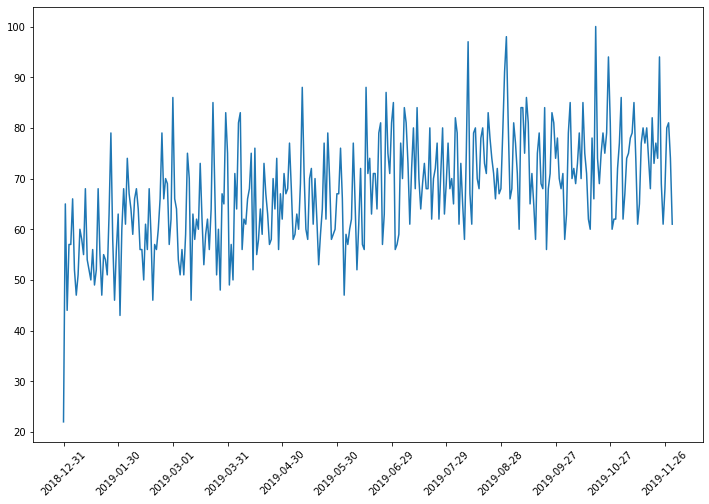

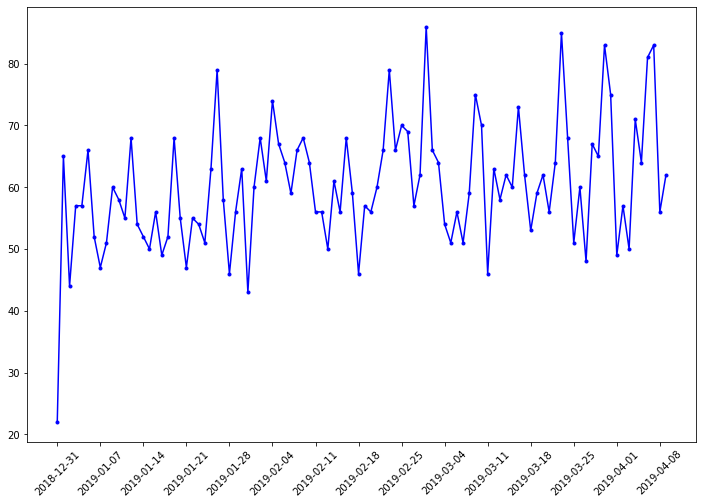

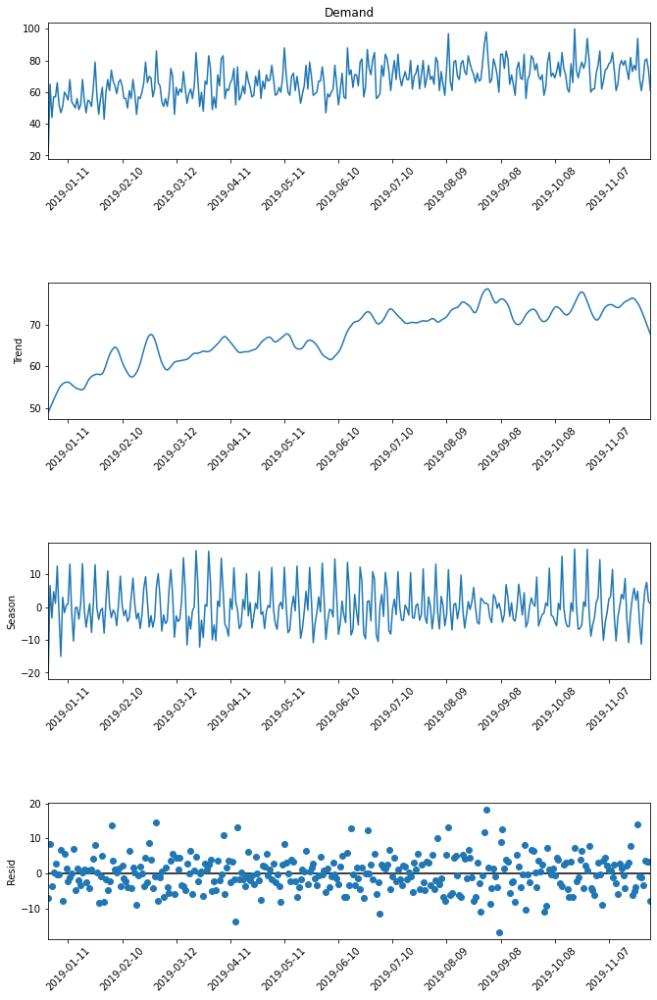

Date
2019-01-01     8.415071
2019-01-03     0.270734
2019-01-04     2.904485
2019-01-07     6.655800
2019-01-09     5.636724
                ...    
2019-11-19     7.922190
2019-11-23    14.099299
2019-11-27     3.585111
2019-11-28     3.367977
2019-11-29     3.451007
Name: resid, Length: 159, dtype: float64


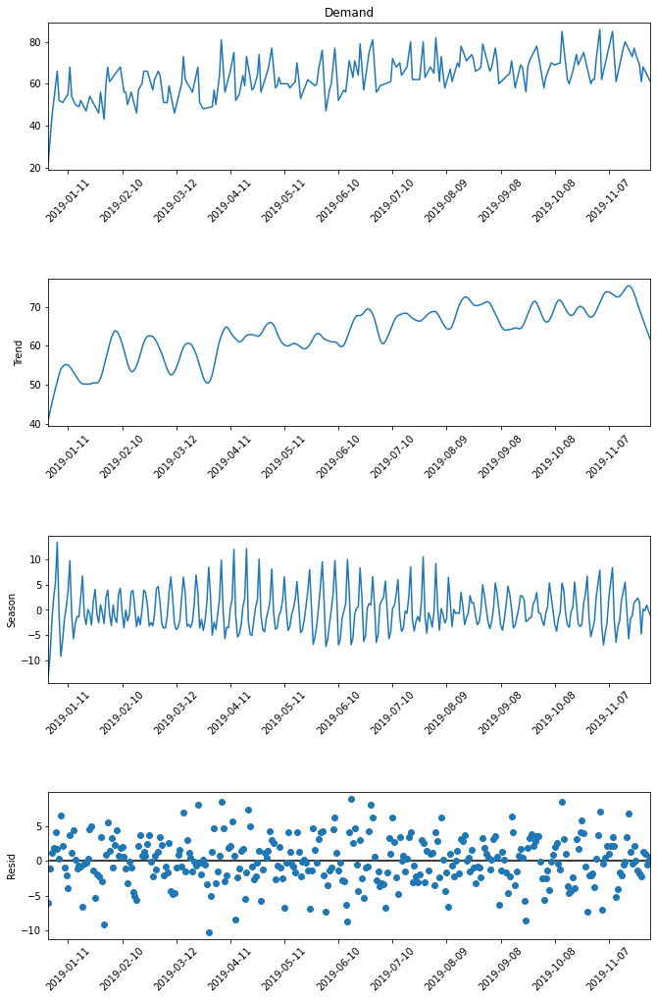

Date
2019-01-02    1.189897
2019-01-03    1.835911
2019-01-04    4.216111
2019-01-05    1.805566
2019-01-06    0.340704
                ...   
2019-11-19    1.316282
2019-11-21    2.177184
2019-11-26    1.269394
2019-11-27    1.094102
2019-11-30    0.564355
Name: resid, Length: 162, dtype: float64


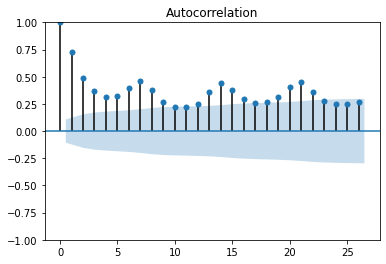

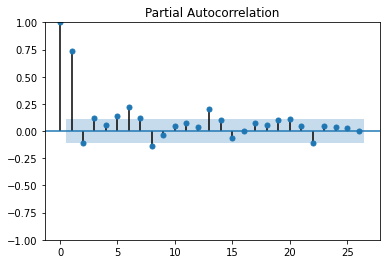

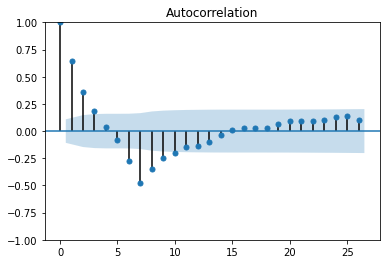

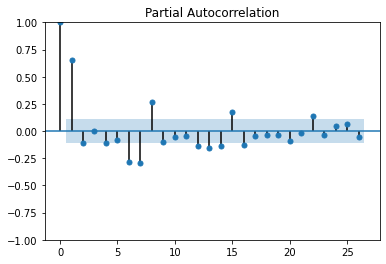

p-value of ADF test (diff 7): 1.9112151772693737e-08


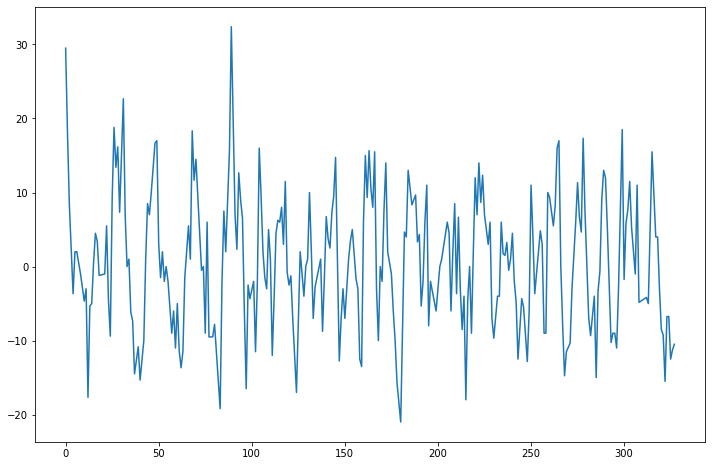

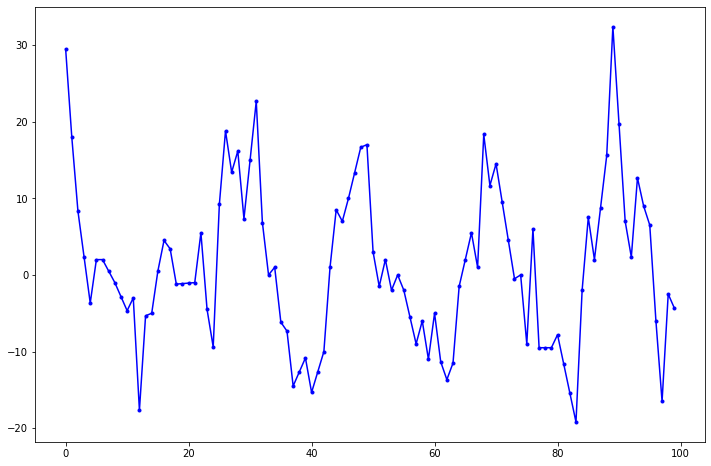

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  244
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -807.623
Date:                Thu, 12 Jan 2023   AIC                           1625.246
Time:                        06:47:53   BIC                           1642.711
Sample:                    01-07-2019   HQIC                          1632.281
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7365      0.063     11.638      0.000       0.612       0.861
ar.L2         -0.0979      0.078     -1.250      0.211      -0.251       0.056
ar.L3          0.0238      0.078      0.306      0.7

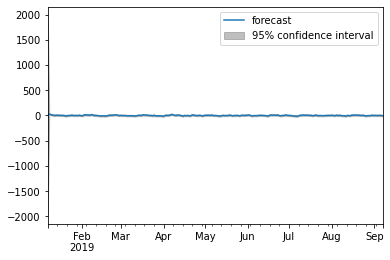

Test RMSE: 8.598218789910232



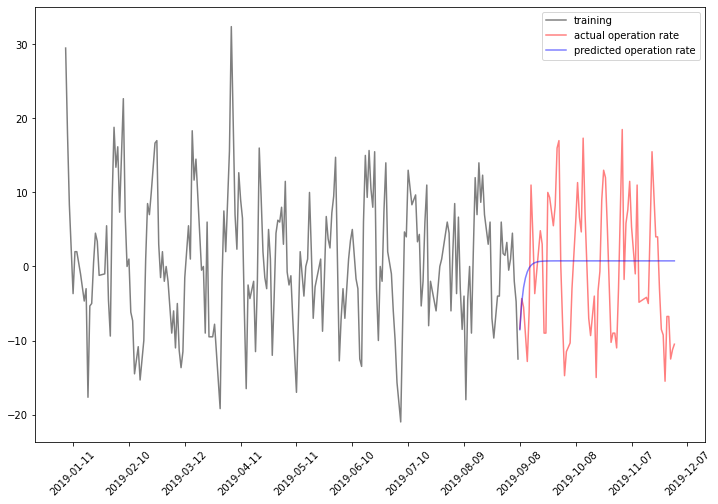





SARIMA
 ARIMA(1,0,0)(2,1,0)[7]          
ar.L1        0.646434
ar.S.L7     -0.991350
ar.S.L14    -0.548814
sigma2      53.342135
dtype: float64
1632.180445424671
Test RMSE: 9.48450847902022



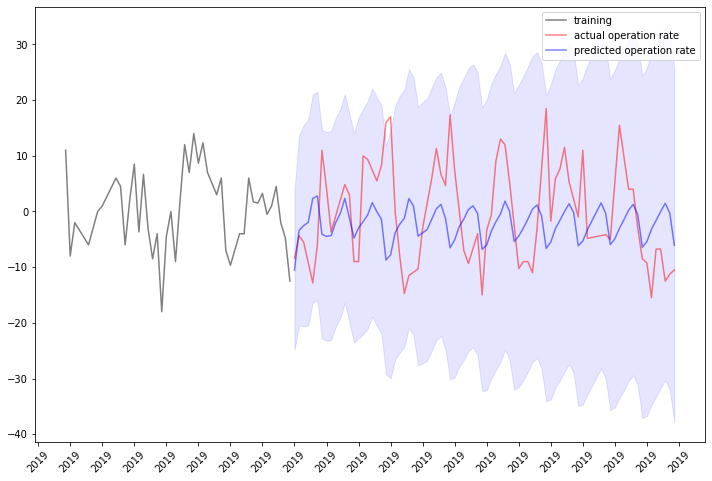

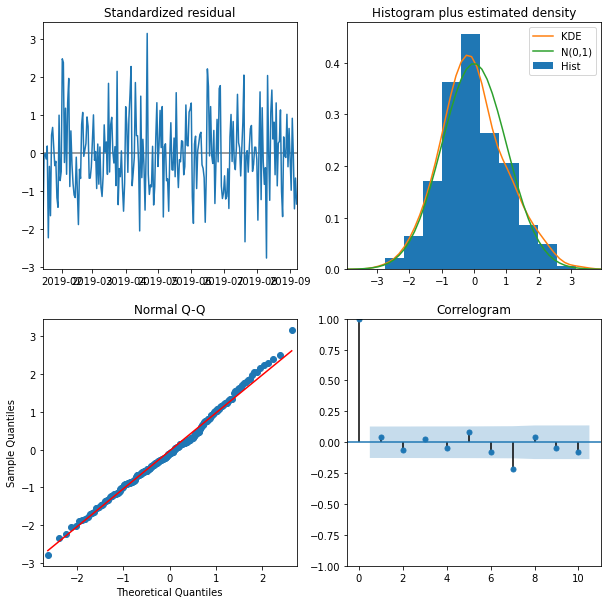

In [14]:
df_경기도_광명시 = df_경기도[df_경기도['region2'] == '광명시']
arima_sarima(df_경기도_광명시)

구리시

ARIMA


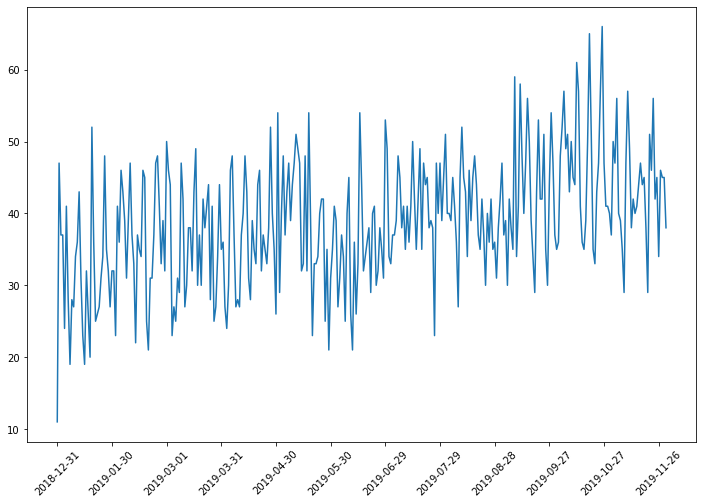

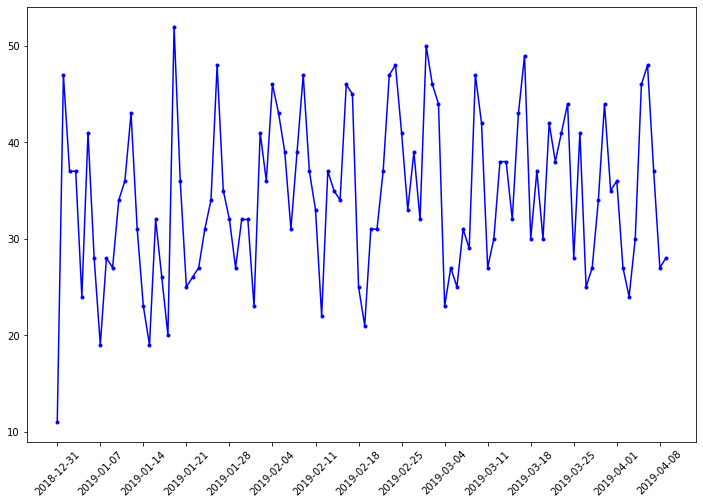

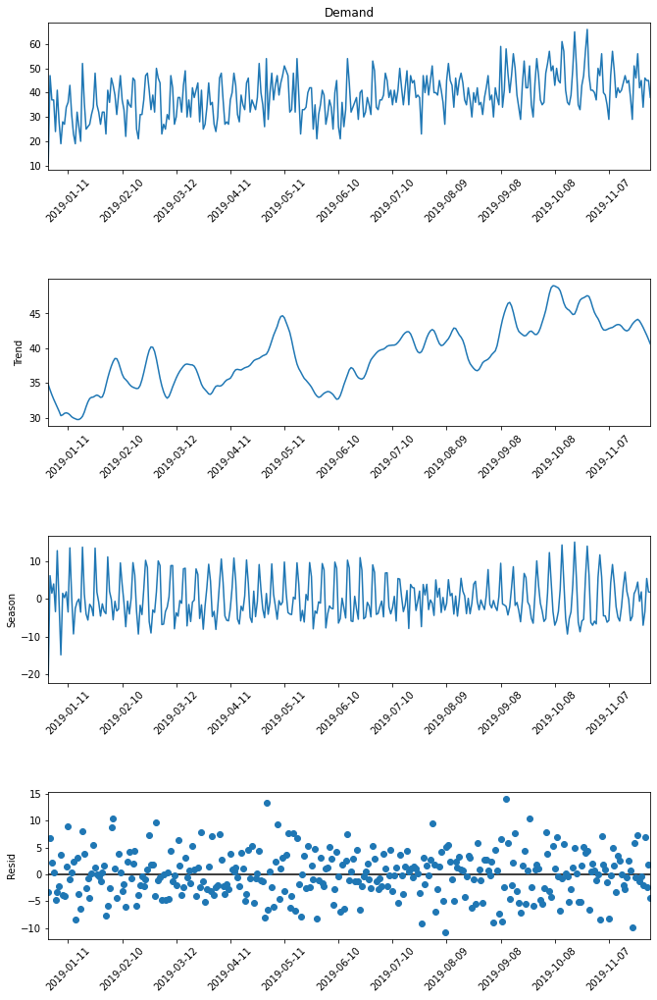

Date
2019-01-01    6.809694
2019-01-02    2.151936
2019-01-03    0.344502
2019-01-07    3.550716
2019-01-10    1.391175
                ...   
2019-11-19    0.740324
2019-11-21    5.813437
2019-11-23    7.345762
2019-11-27    6.876931
2019-11-29    1.851825
Name: resid, Length: 162, dtype: float64


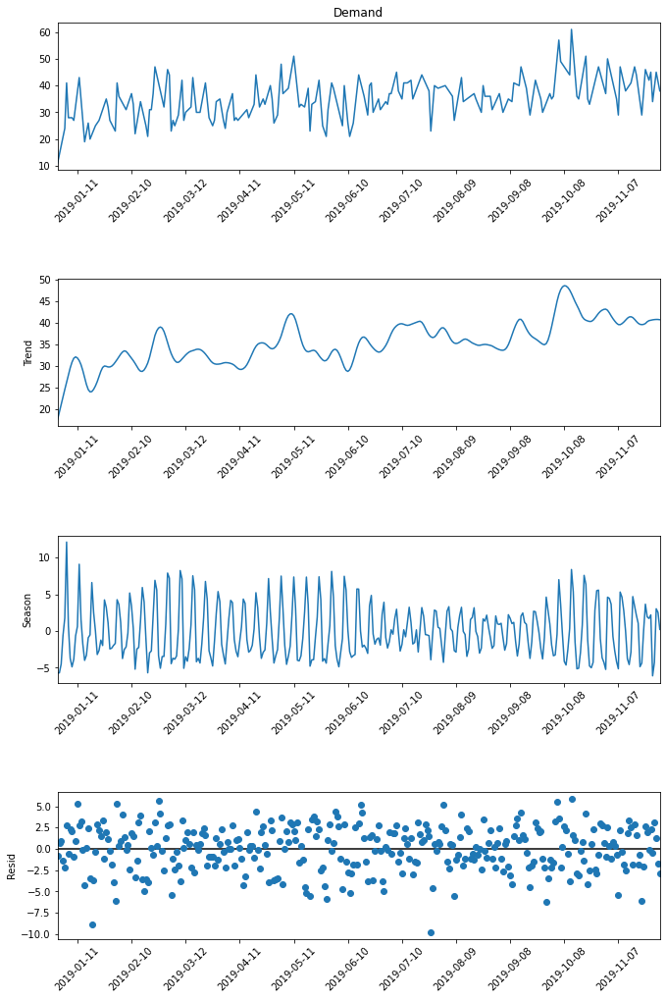

Date
2019-01-01    0.671029
2019-01-02    0.969783
2019-01-05    2.746910
2019-01-07    2.254986
2019-01-08    2.079369
                ...   
2019-11-22    2.598611
2019-11-23    1.912691
2019-11-25    2.285555
2019-11-27    3.091700
2019-11-28    1.276114
Name: resid, Length: 173, dtype: float64


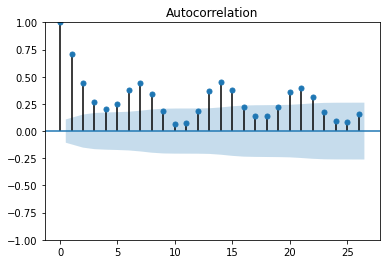

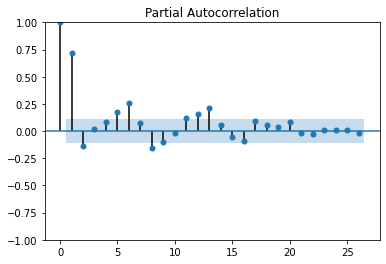

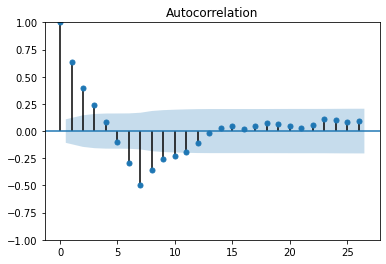

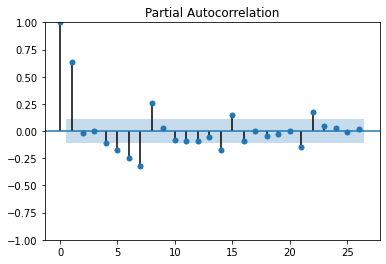

p-value of ADF test (diff 7): 2.048770319177149e-07


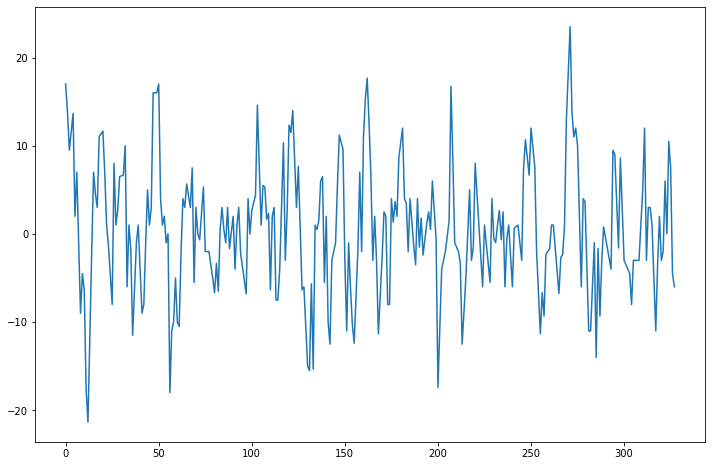

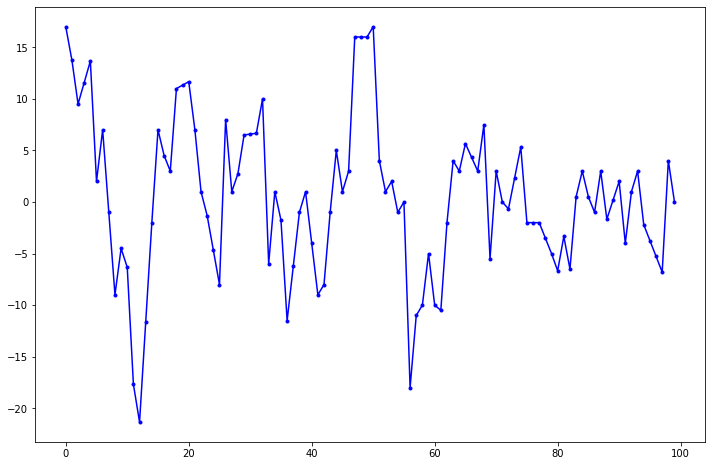

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  244
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -761.067
Date:                Thu, 12 Jan 2023   AIC                           1532.135
Time:                        06:48:32   BIC                           1549.600
Sample:                    01-07-2019   HQIC                          1539.170
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6502      0.069      9.397      0.000       0.515       0.786
ar.L2         -0.0064      0.082     -0.079      0.937      -0.167       0.154
ar.L3         -0.0022      0.066     -0.033      0.9

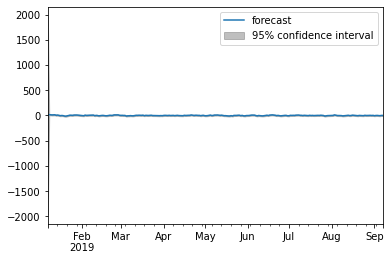

Test RMSE: 7.172629252274048



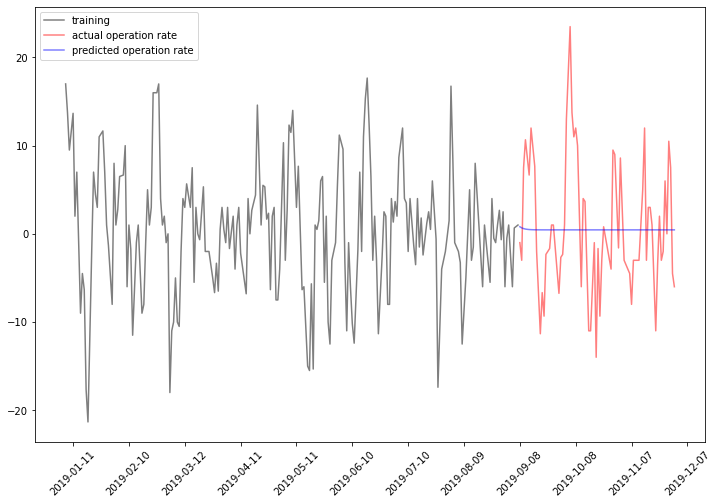





SARIMA
 ARIMA(1,0,0)(2,1,0)[7]          
ar.L1        0.579863
ar.S.L7     -1.026432
ar.S.L14    -0.461105
sigma2      36.741657
dtype: float64
1543.1747542353382
Test RMSE: 7.3680912834435945



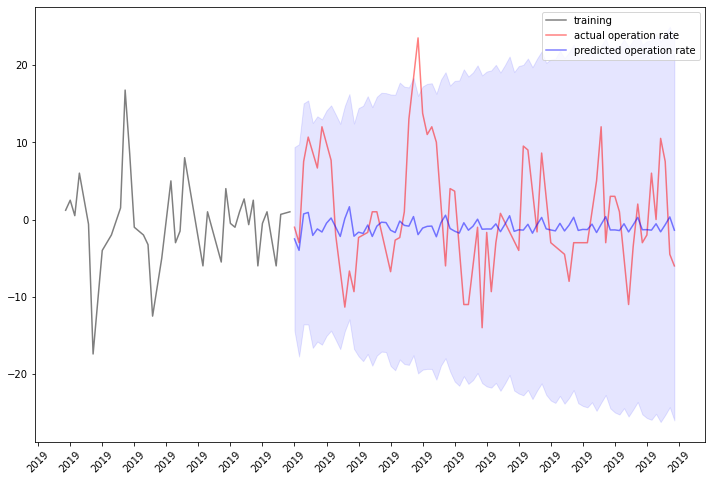

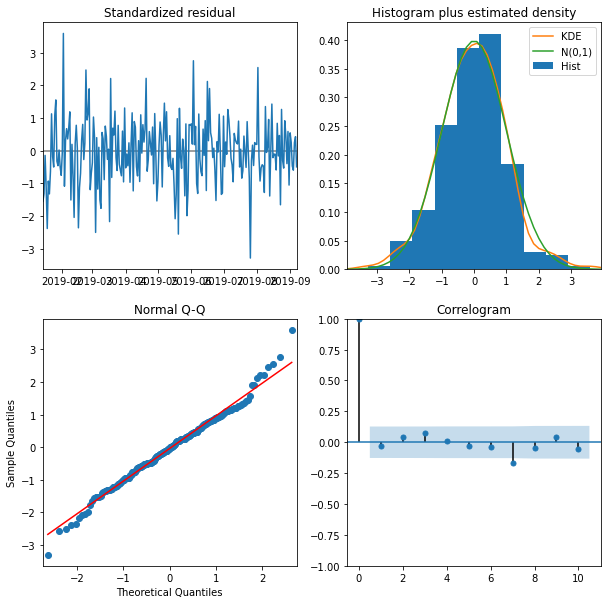

In [15]:
df_경기도_구리시 = df_경기도[df_경기도['region2'] == '구리시']
arima_sarima(df_경기도_구리시)

김포시

ARIMA


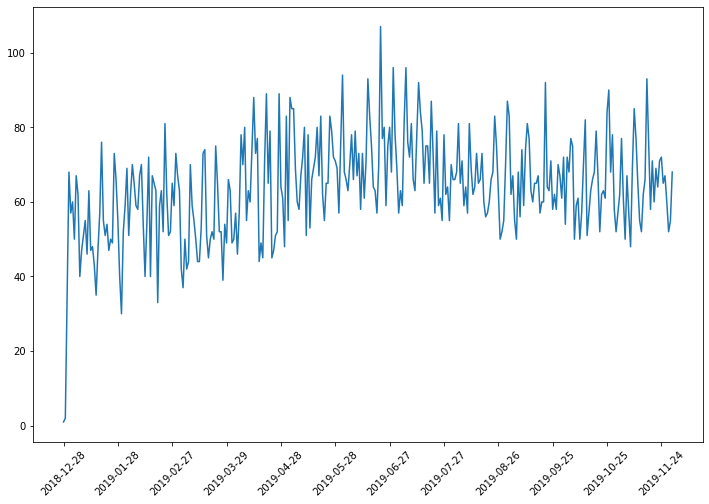

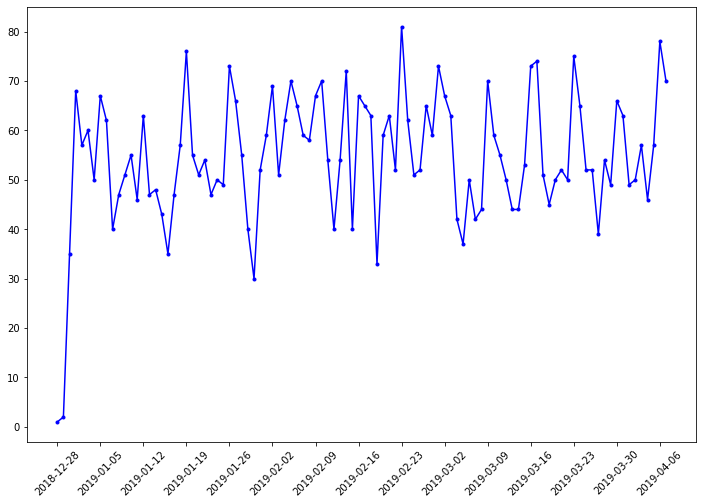

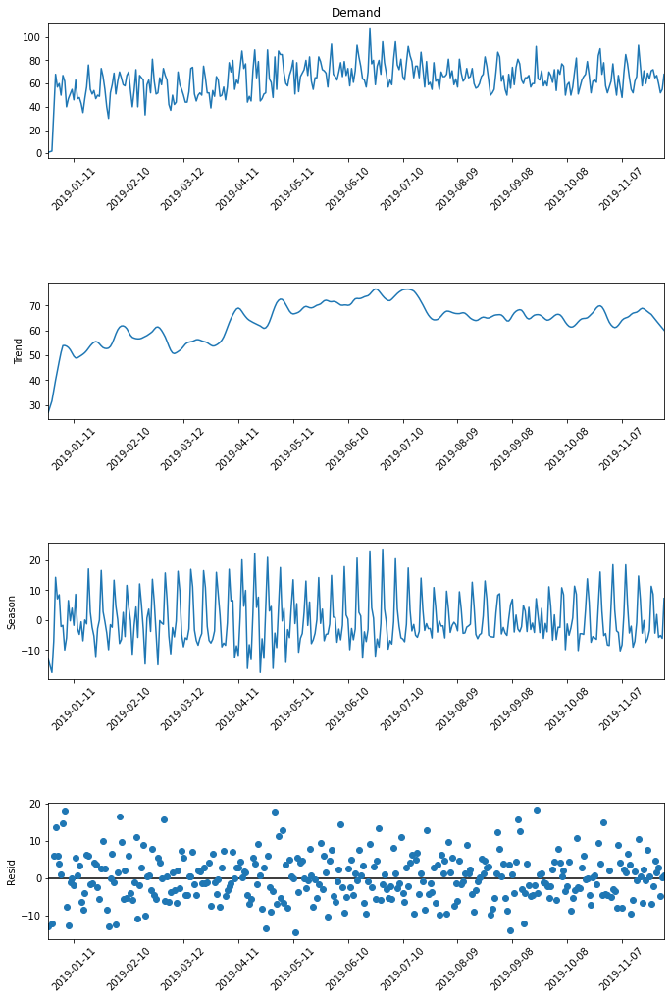

Date
2018-12-31     6.101570
2019-01-01    13.614277
2019-01-02     5.932923
2019-01-03     3.834617
2019-01-04     0.946600
                ...    
2019-11-22     0.442084
2019-11-25     4.744247
2019-11-26     1.401065
2019-11-27     2.950473
2019-11-30     0.593717
Name: resid, Length: 164, dtype: float64


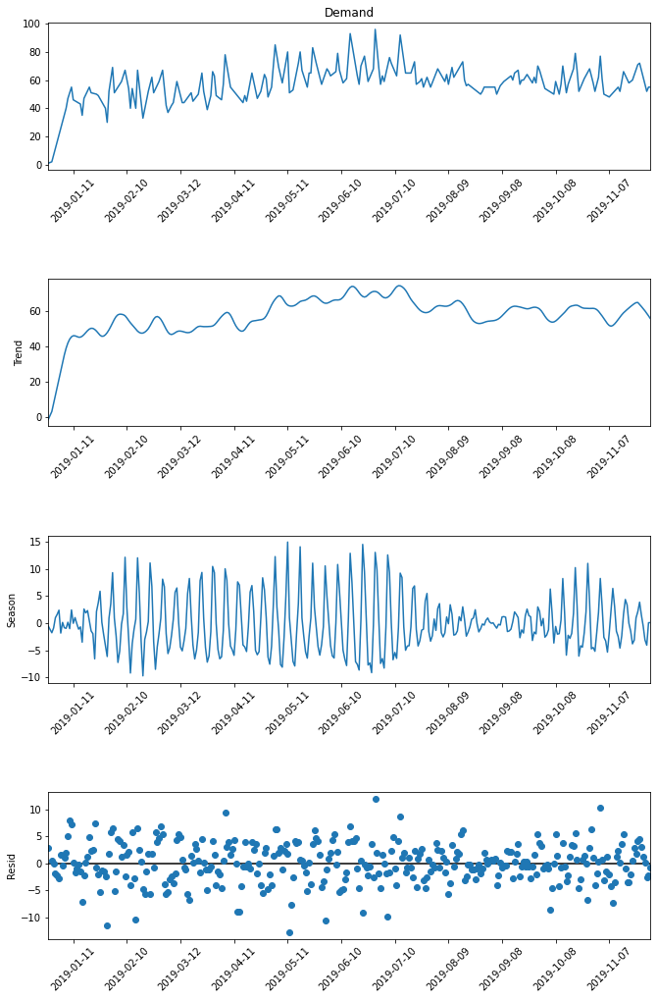

Date
2018-12-28    2.818647
2018-12-30    0.555829
2019-01-04    1.568158
2019-01-06    0.960103
2019-01-07    2.039604
                ...   
2019-11-23    4.178865
2019-11-24    4.548513
2019-11-25    3.093452
2019-11-26    1.314022
2019-11-27    0.135358
Name: resid, Length: 164, dtype: float64


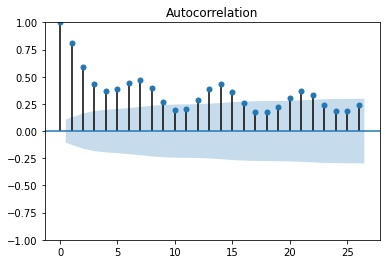

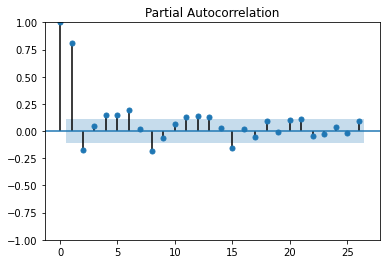

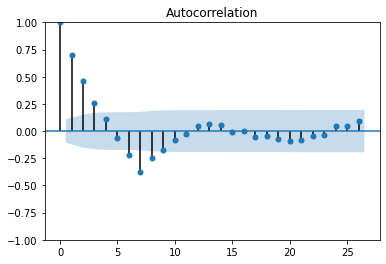

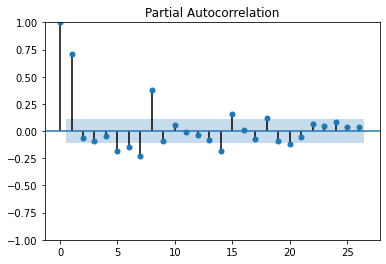

p-value of ADF test (diff 7): 3.012332988961223e-06


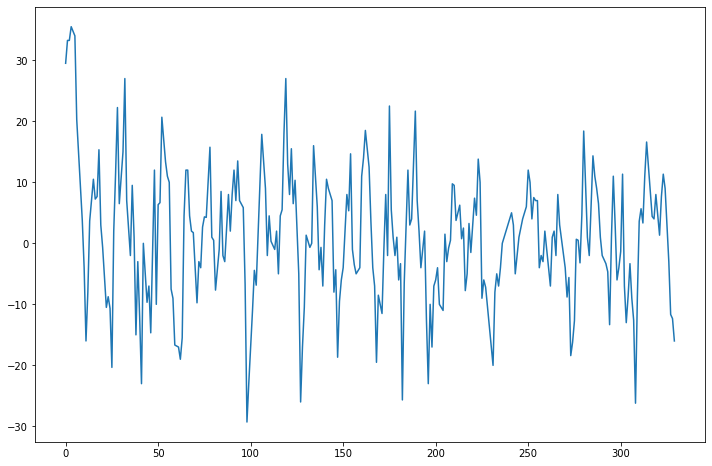

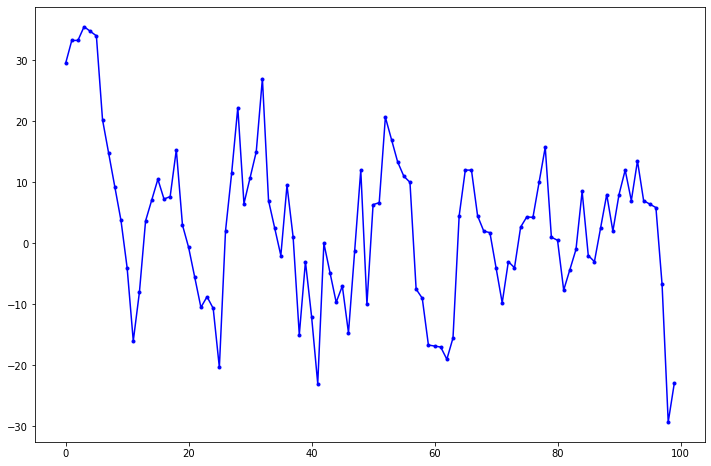

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  246
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -852.830
Date:                Thu, 12 Jan 2023   AIC                           1715.660
Time:                        06:48:53   BIC                           1733.166
Sample:                    01-05-2019   HQIC                          1722.710
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7342      0.058     12.588      0.000       0.620       0.848
ar.L2          0.0713      0.081      0.879      0.379      -0.088       0.230
ar.L3         -0.1225      0.065     -1.880      0.0

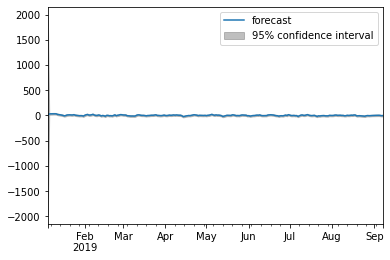

Test RMSE: 8.429529073593558



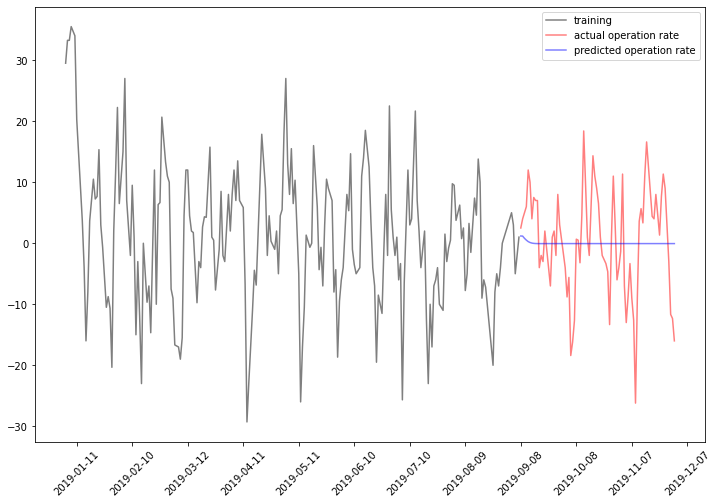





SARIMA
 ARIMA(2,0,1)(2,1,0)[7]          
ar.L1        1.671961
ar.L2       -0.724650
ma.L1       -0.947279
ar.S.L7     -0.977895
ar.S.L14    -0.420682
sigma2      73.190394
dtype: float64
1725.5769968132363
Test RMSE: 9.058530095011895



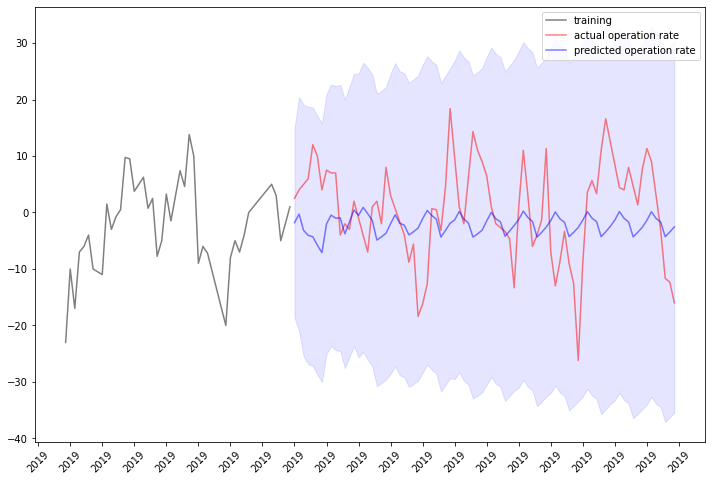

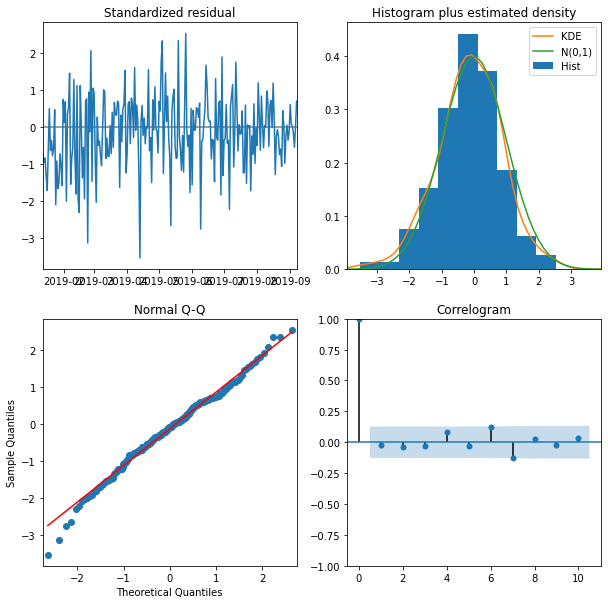

In [16]:
df_경기도_김포시 = df_경기도[df_경기도['region2'] == '김포시']
arima_sarima(df_경기도_김포시)

양평군

ARIMA


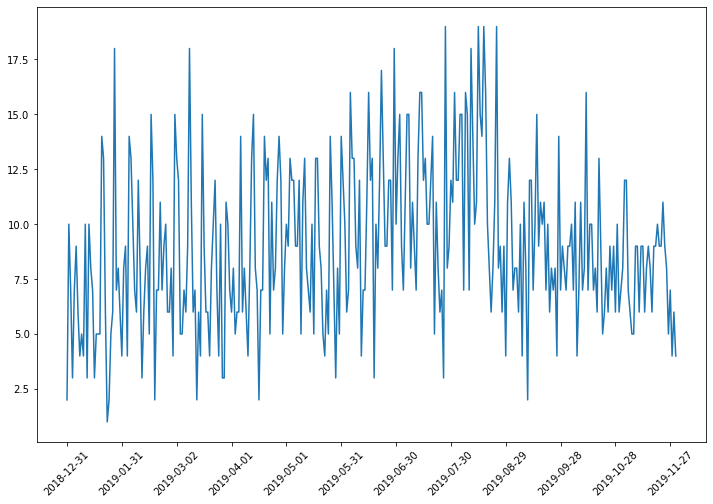

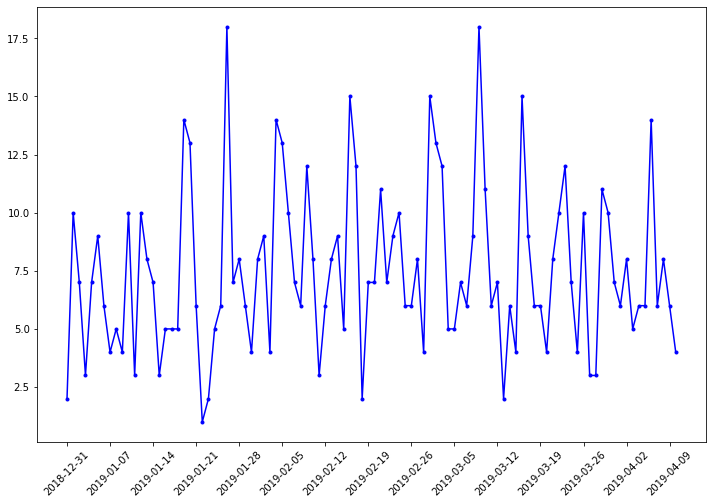

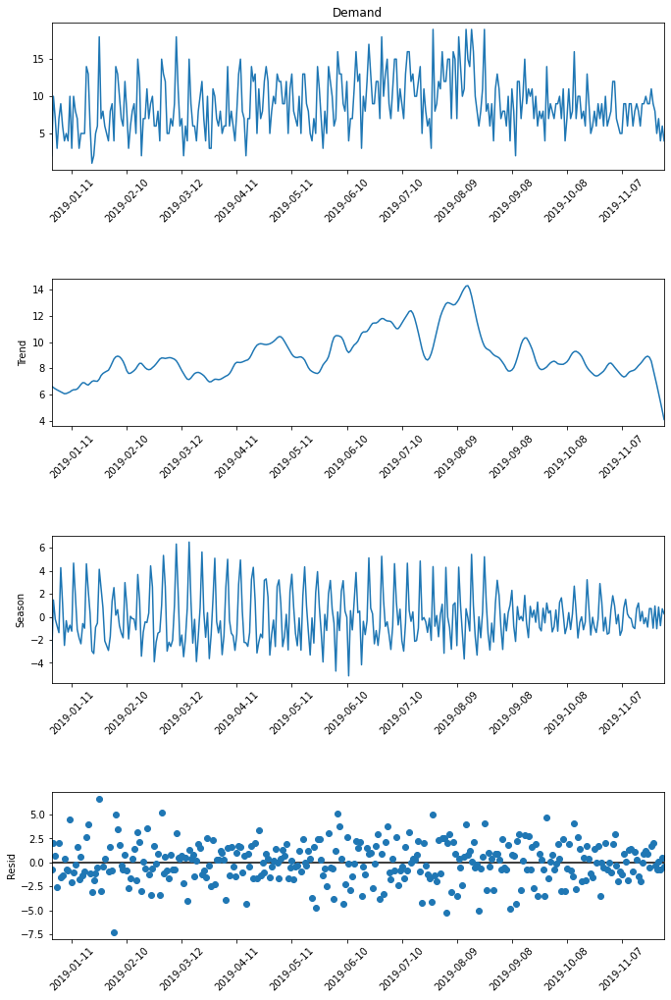

Date
2019-01-01    1.989831
2019-01-02    0.754934
2019-01-04    2.085191
2019-01-07    0.415967
2019-01-10    4.520084
                ...   
2019-11-20    1.212905
2019-11-21    0.961777
2019-11-23    1.735914
2019-11-24    2.031752
2019-11-29    0.515635
Name: resid, Length: 160, dtype: float64


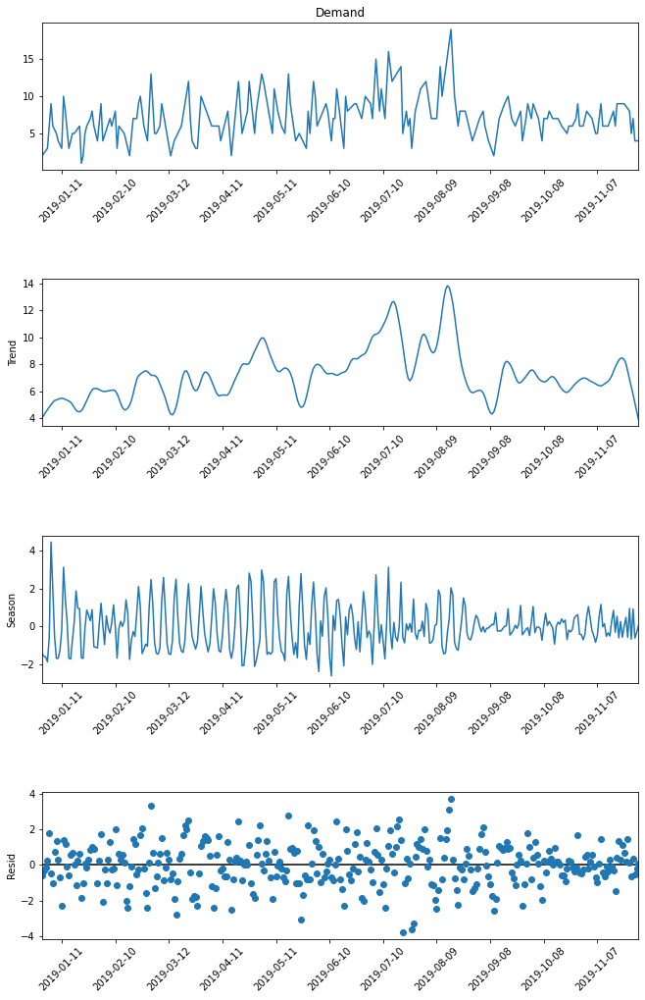

Date
2019-01-03    0.247736
2019-01-04    1.783594
2019-01-07    0.763086
2019-01-08    1.346035
2019-01-09    0.288423
                ...   
2019-11-22    0.679313
2019-11-23    0.159581
2019-11-24    1.448556
2019-11-25    0.152428
2019-11-27    0.347320
Name: resid, Length: 160, dtype: float64


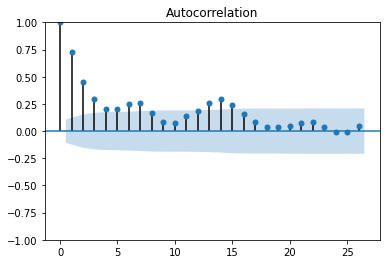

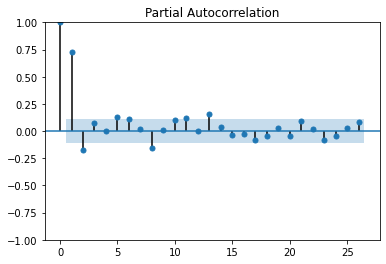

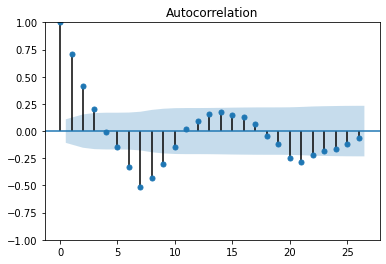

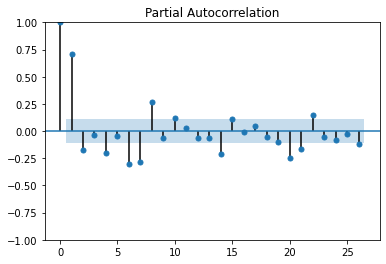

p-value of ADF test (diff 7): 6.359176284083036e-06


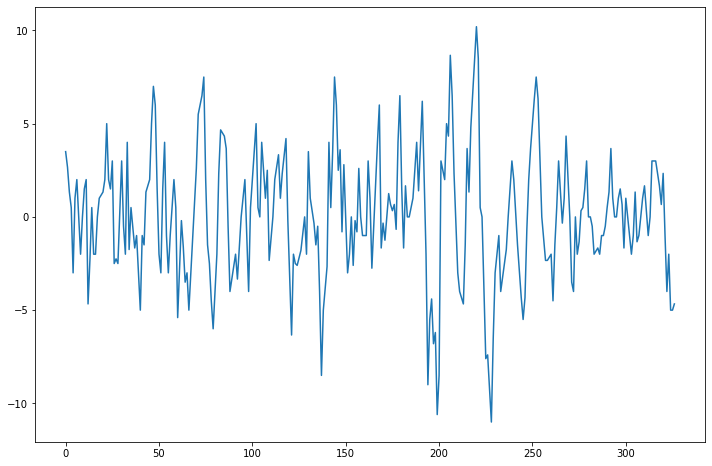

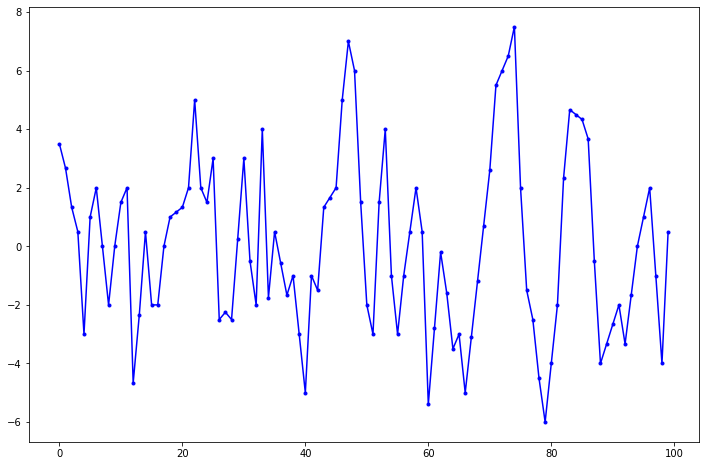

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  243
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -586.550
Date:                Thu, 12 Jan 2023   AIC                           1183.099
Time:                        06:49:27   BIC                           1200.544
Sample:                             0   HQIC                          1190.127
                                - 243                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4645      0.714     -0.651      0.515      -1.863       0.934
ar.L2         -0.1547      0.073     -2.119      0.034      -0.298      -0.012
ar.L3          0.0078      0.145      0.054      0.9

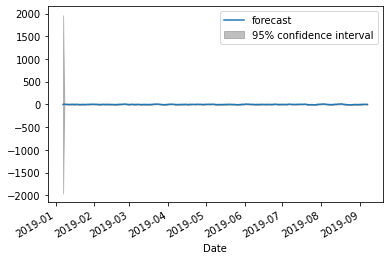

Test RMSE: 2.8920826576976704



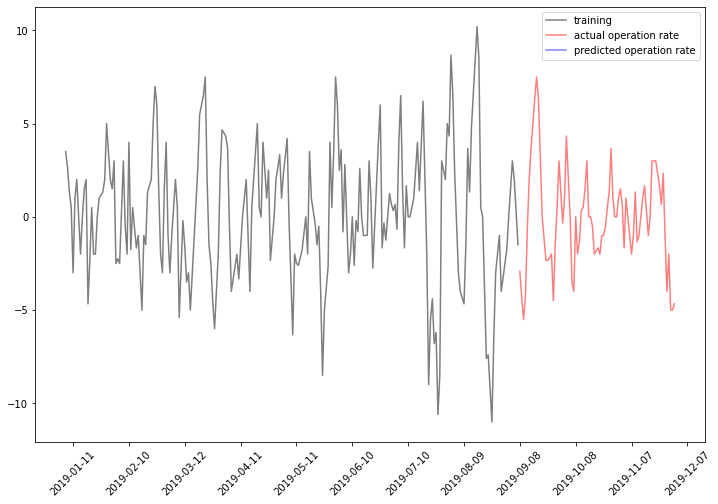





SARIMA
 ARIMA(1,0,1)(2,1,0)[7]          
ar.L1       0.534713
ma.L1       0.301919
ar.S.L7    -0.965818
ar.S.L14   -0.377974
sigma2      8.373859
dtype: float64
1188.8622595170127
Test RMSE: 3.441931616900173



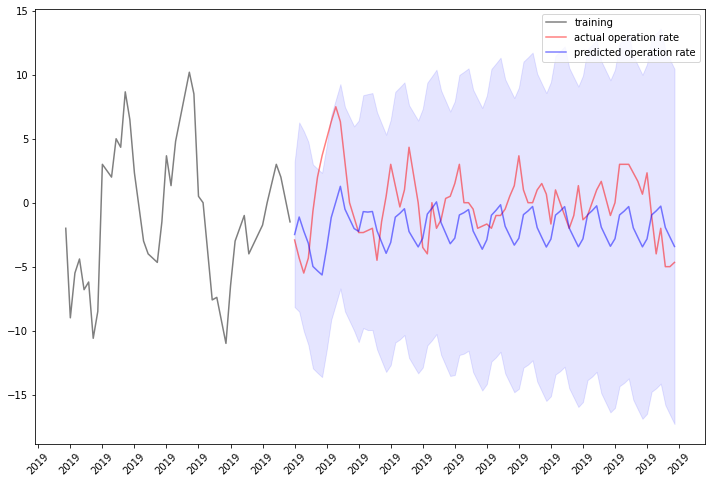

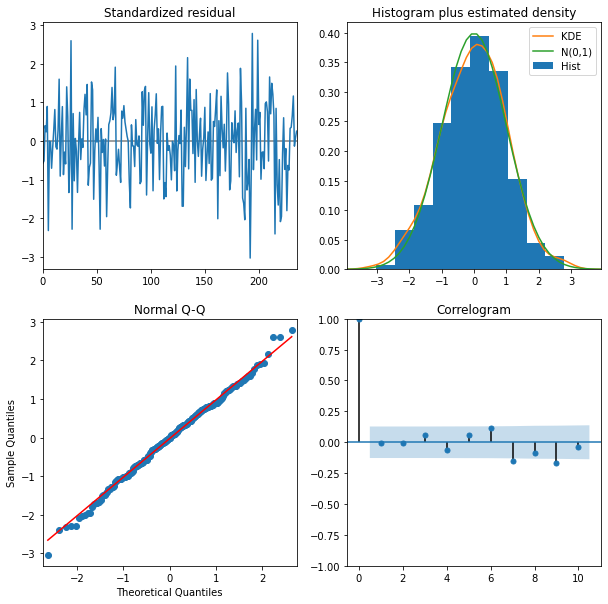

In [17]:
df_경기도_양평군 = df_경기도[df_경기도['region2'] == '양평군']
arima_sarima(df_경기도_양평군)

하남시

ARIMA


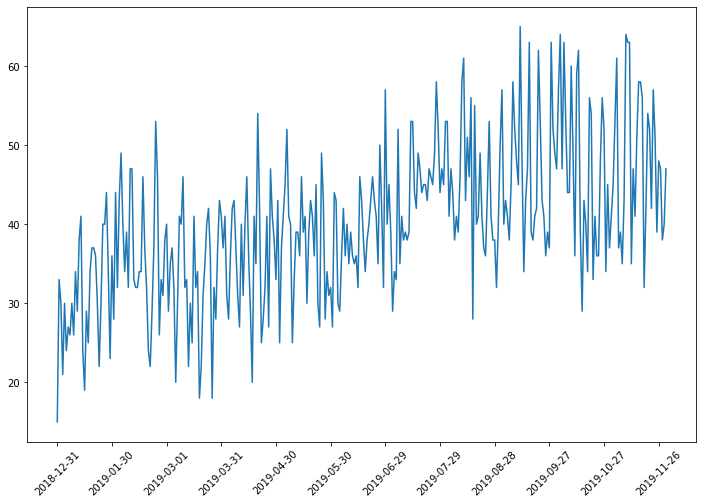

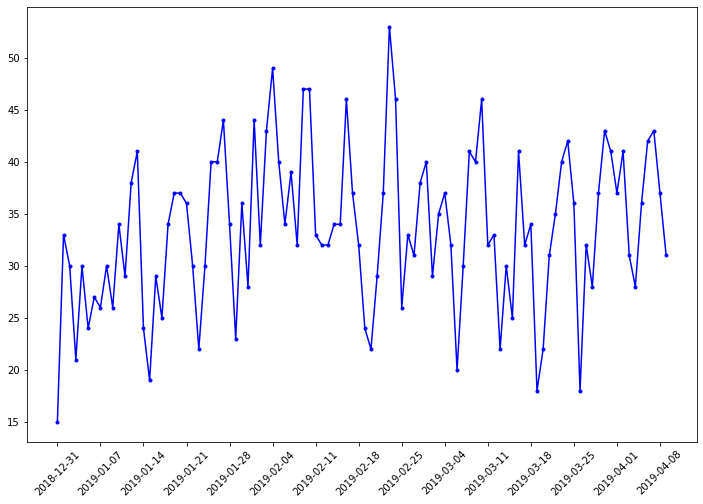

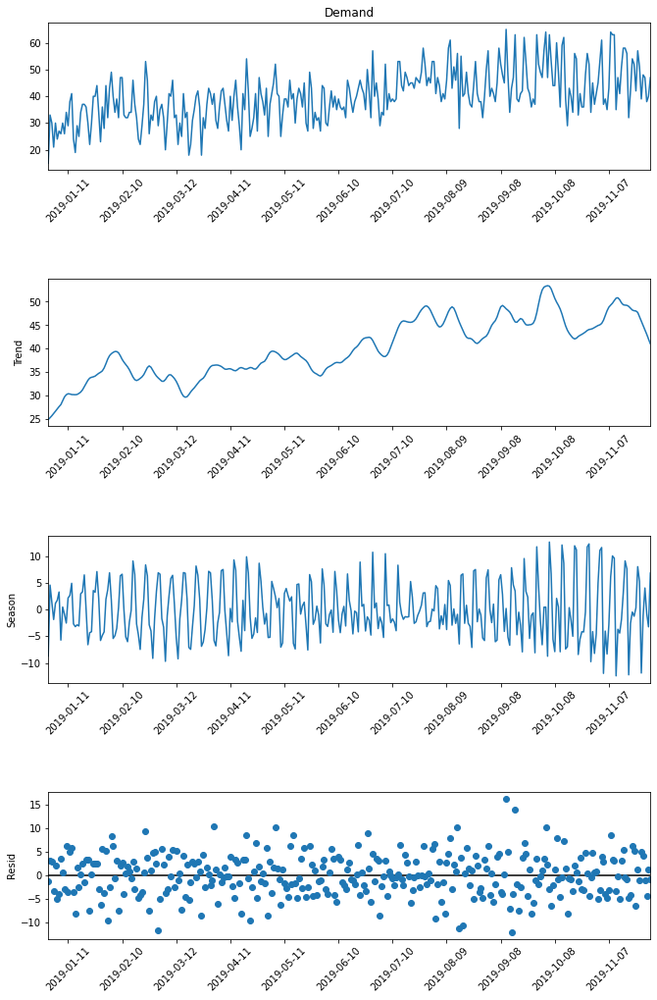

Date
2019-01-01    3.088256
2019-01-02    2.865499
2019-01-04    2.122217
2019-01-07    3.595426
2019-01-08    0.562978
                ...   
2019-11-21    5.155667
2019-11-23    1.234097
2019-11-25    5.006391
2019-11-26    4.181072
2019-11-29    1.148197
Name: resid, Length: 164, dtype: float64


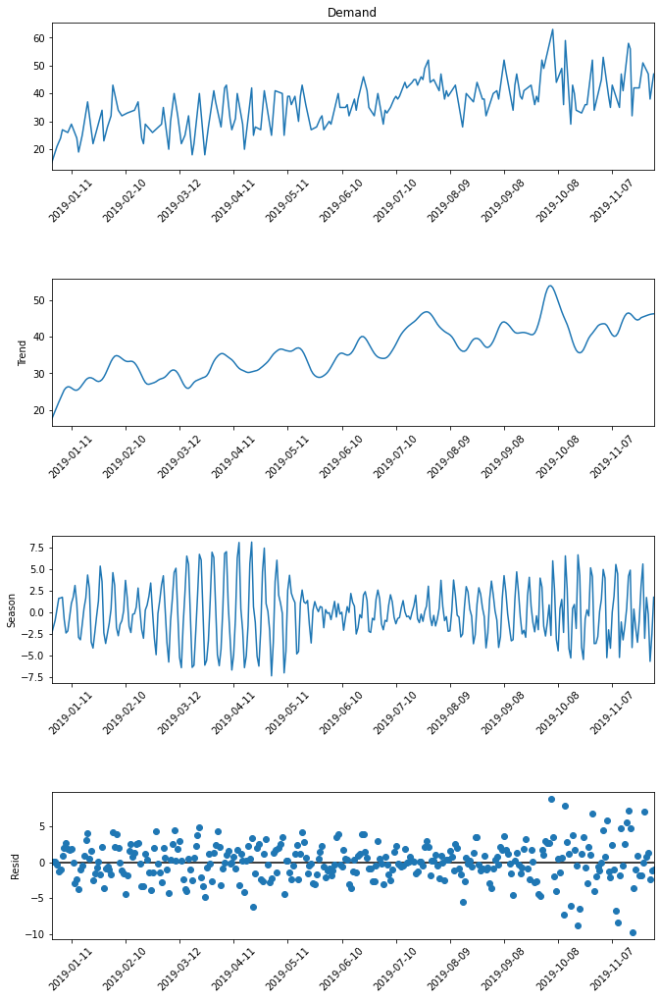

Date
2018-12-31    0.135461
2019-01-01    0.125720
2019-01-02    0.132445
2019-01-06    0.870164
2019-01-07    2.009414
                ...   
2019-11-17    4.776709
2019-11-21    0.911880
2019-11-25    7.093812
2019-11-26    0.808145
2019-11-27    1.272617
Name: resid, Length: 165, dtype: float64


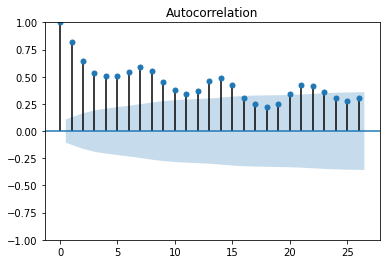

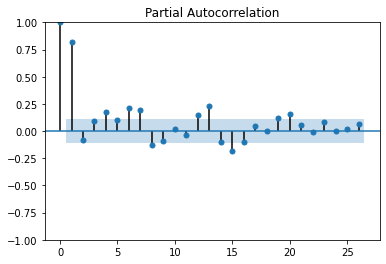

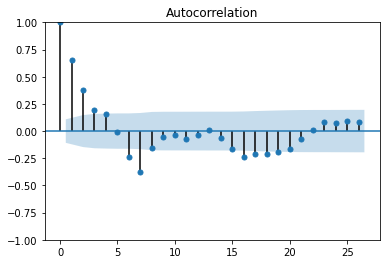

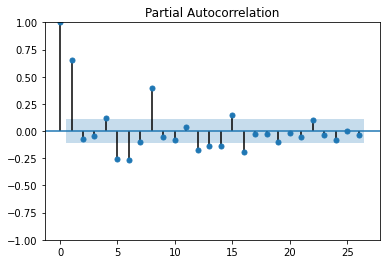

p-value of ADF test (diff 7): 2.0442061948222317e-08


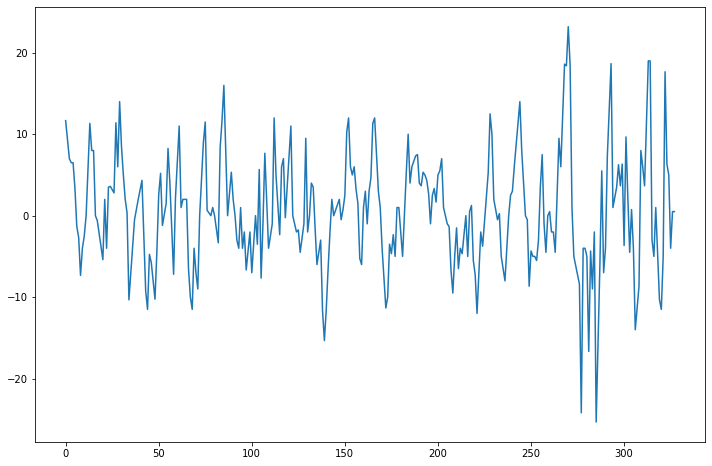

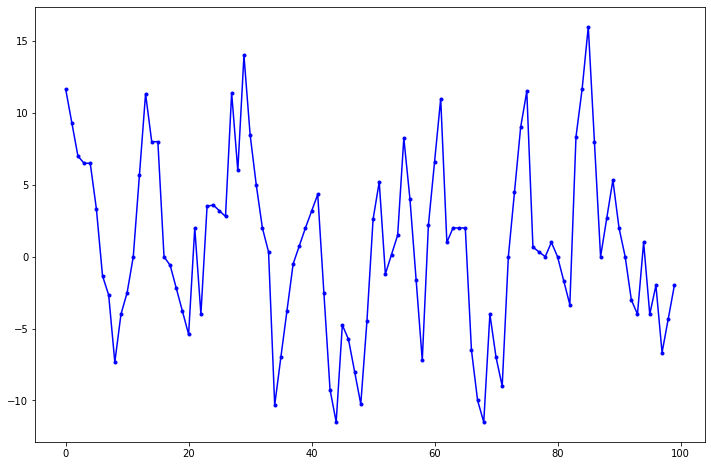

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  244
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -705.206
Date:                Thu, 12 Jan 2023   AIC                           1420.413
Time:                        06:50:13   BIC                           1437.878
Sample:                    01-07-2019   HQIC                          1427.448
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2330      0.270     -0.862      0.389      -0.763       0.297
ar.L2         -0.1527      0.066     -2.330      0.020      -0.281      -0.024
ar.L3         -0.2253      0.069     -3.243      0.0

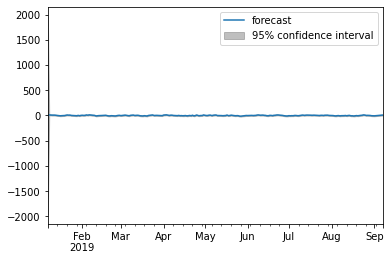

Test RMSE: 13.181460854032311



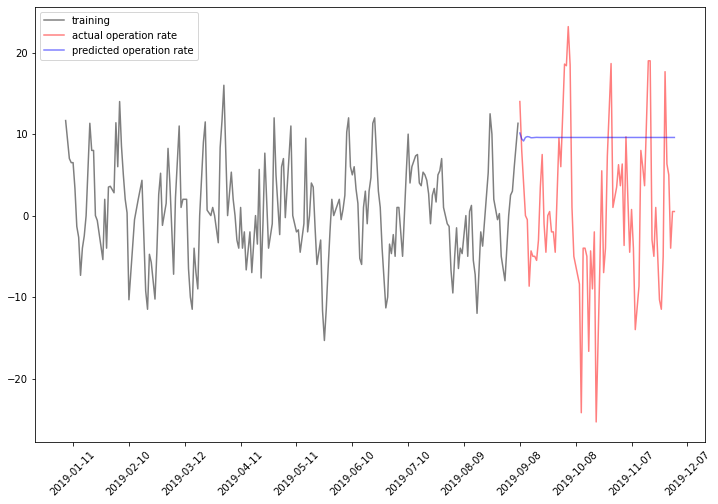





SARIMA
 ARIMA(1,0,0)(2,1,0)[7]          
ar.L1        0.749936
ar.S.L7     -1.000016
ar.S.L14    -0.390535
sigma2      21.875305
dtype: float64
1419.7817871808686
Test RMSE: 9.7272616393531



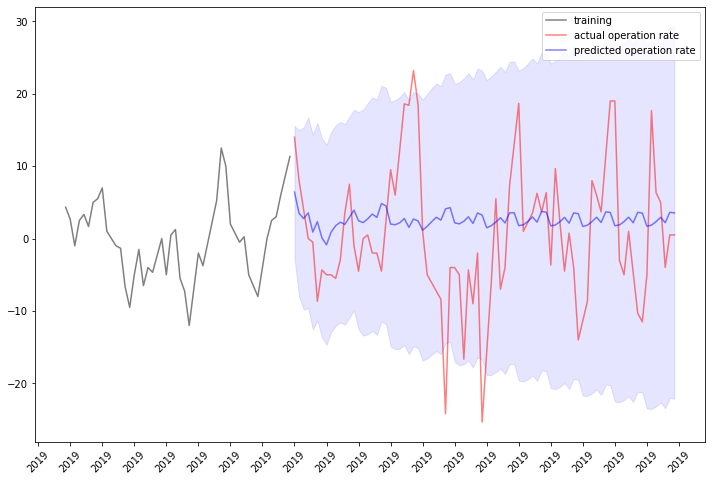

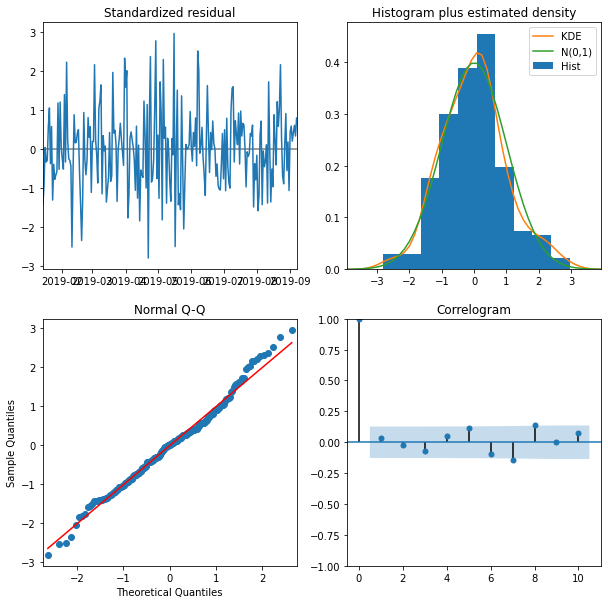

In [18]:
df_경기도_하남시 = df_경기도[df_경기도['region2'] == '하남시']
arima_sarima(df_경기도_하남시)

화성시

ARIMA


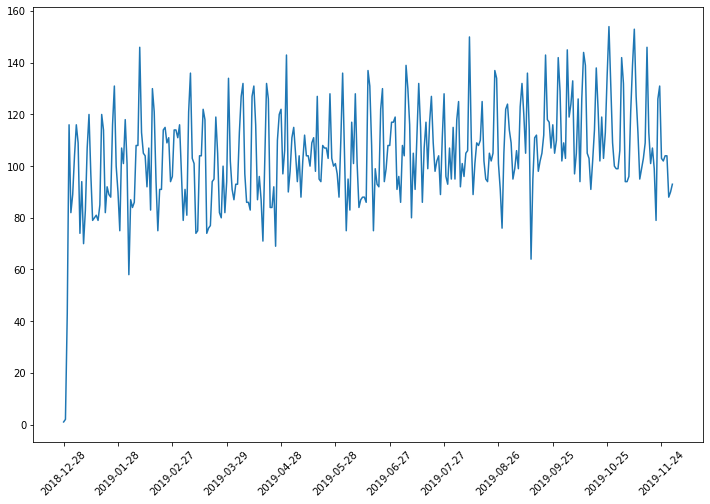

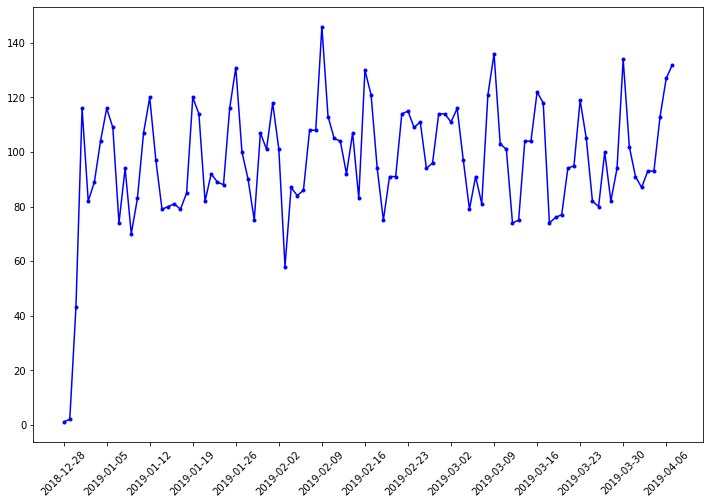

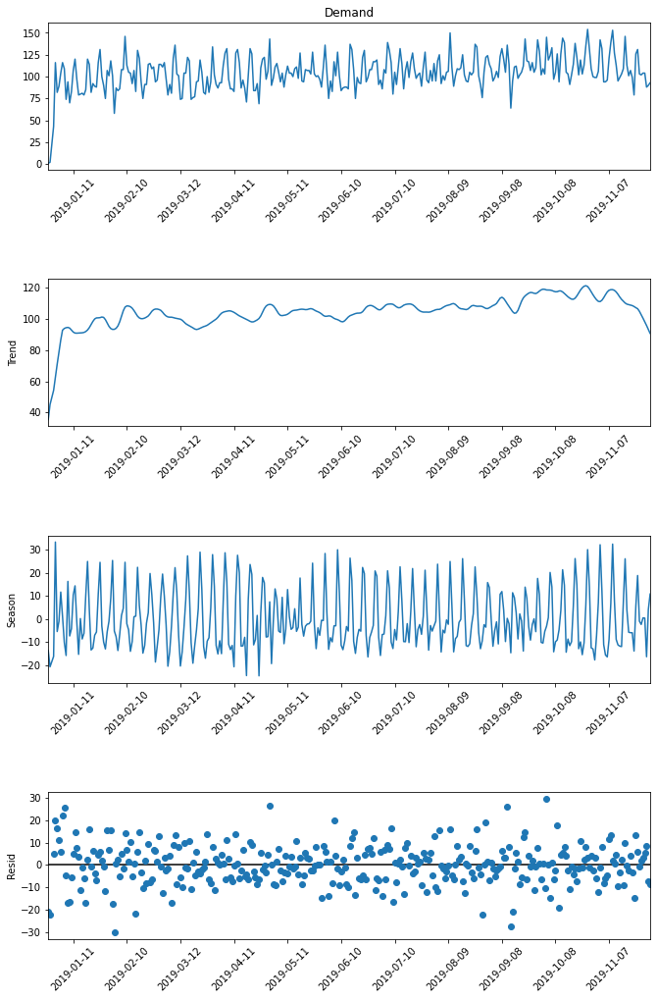

Date
2018-12-31     5.141923
2019-01-01    19.956877
2019-01-02    16.555807
2019-01-03    11.229648
2019-01-04     5.927918
                ...    
2019-11-23     5.739291
2019-11-25     1.755950
2019-11-26     3.181556
2019-11-27     5.562988
2019-11-28     8.688030
Name: resid, Length: 166, dtype: float64


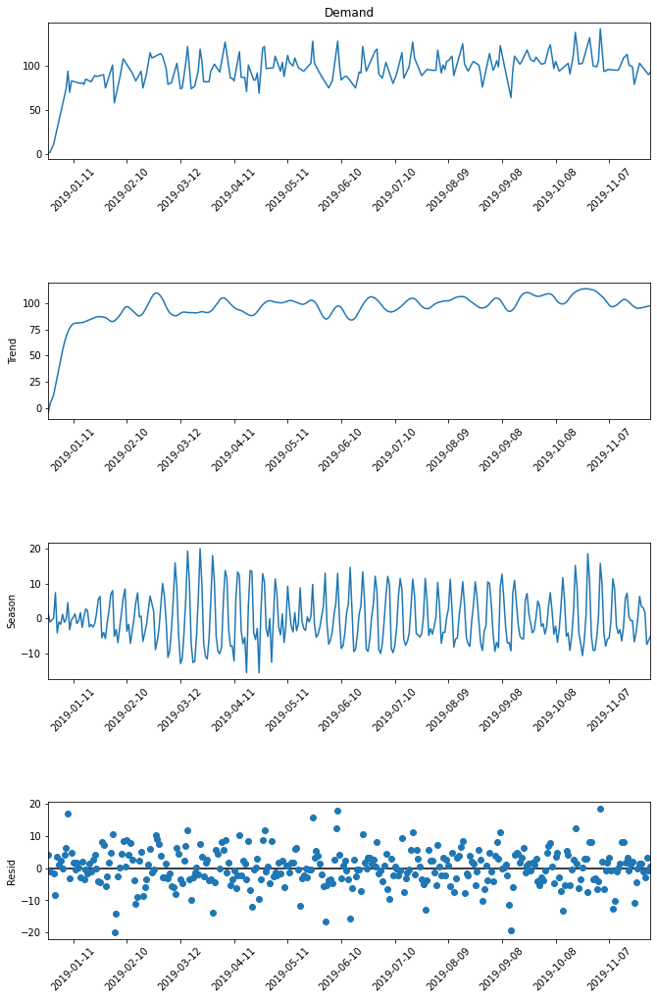

Date
2018-12-28    4.185015
2019-01-02    3.576504
2019-01-03    1.026946
2019-01-04    2.285247
2019-01-06    4.095558
                ...   
2019-11-20    1.856706
2019-11-24    1.444680
2019-11-25    1.457054
2019-11-28    3.331307
2019-11-30    0.447365
Name: resid, Length: 168, dtype: float64


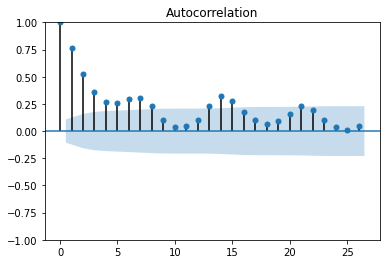

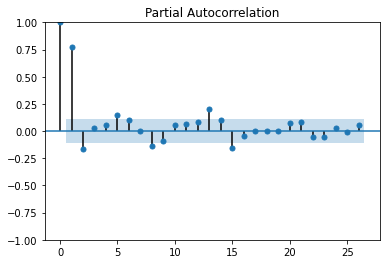

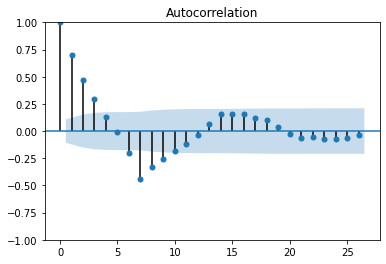

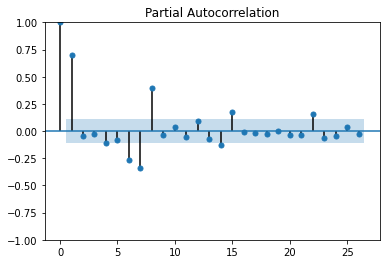

p-value of ADF test (diff 7): 5.121081414146693e-08


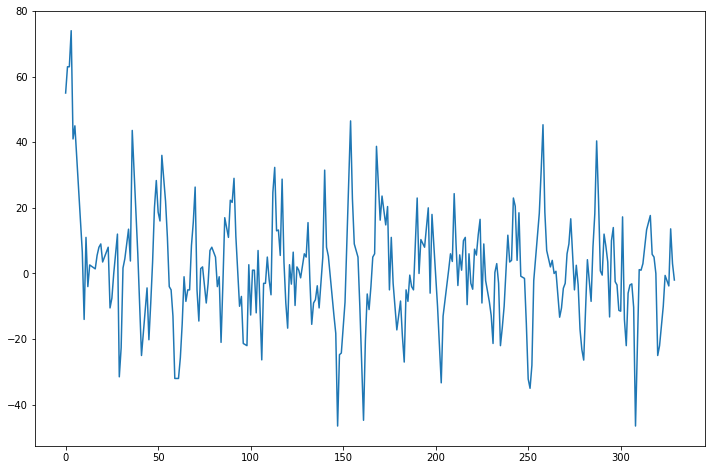

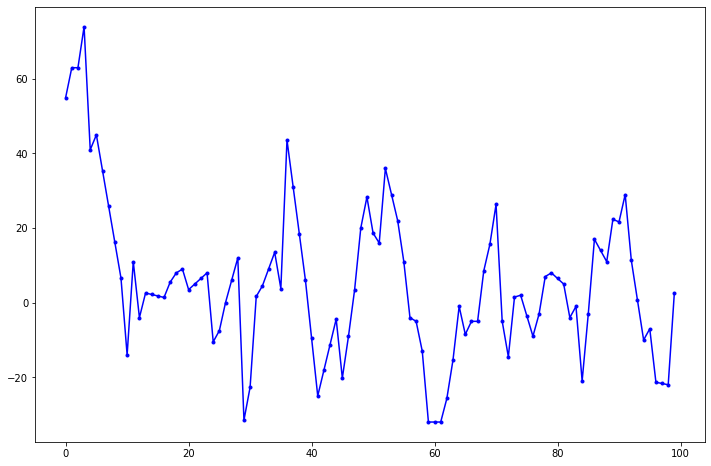

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  246
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -971.593
Date:                Thu, 12 Jan 2023   AIC                           1953.185
Time:                        06:50:33   BIC                           1970.692
Sample:                    01-05-2019   HQIC                          1960.235
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0610      1.741     -0.035      0.972      -3.474       3.352
ar.L2         -0.0742      0.337     -0.220      0.826      -0.734       0.586
ar.L3         -0.0318      0.188     -0.169      0.8

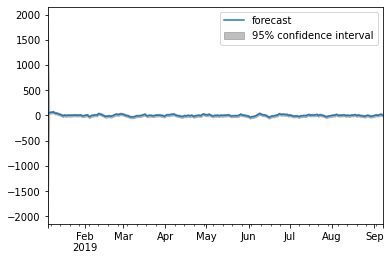

Test RMSE: 23.257749124481236



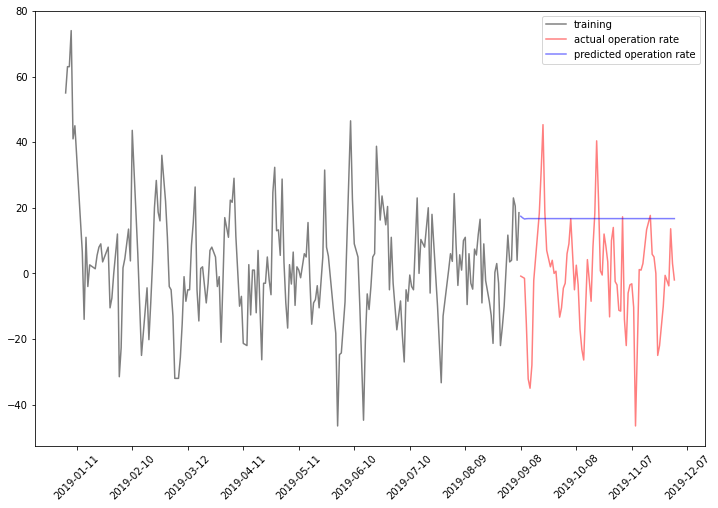





SARIMA
 ARIMA(1,0,0)(2,1,0)[7]          
ar.L1         0.732746
ar.S.L7      -1.114452
ar.S.L14     -0.523444
sigma2      157.892117
dtype: float64
1906.3874596563996
Test RMSE: 15.94120188467449



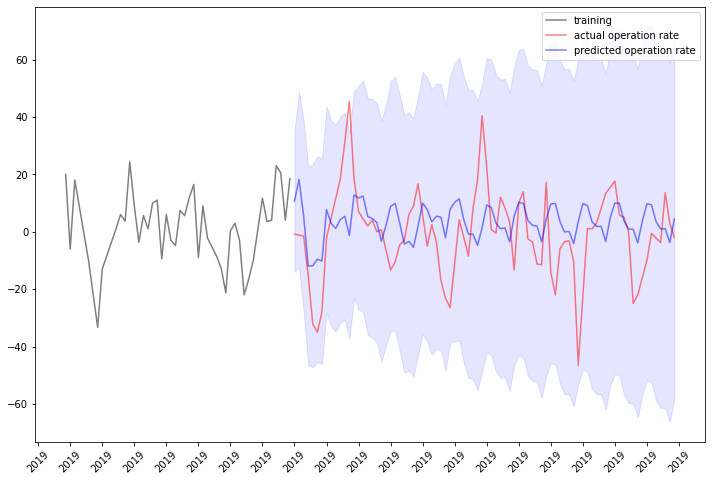

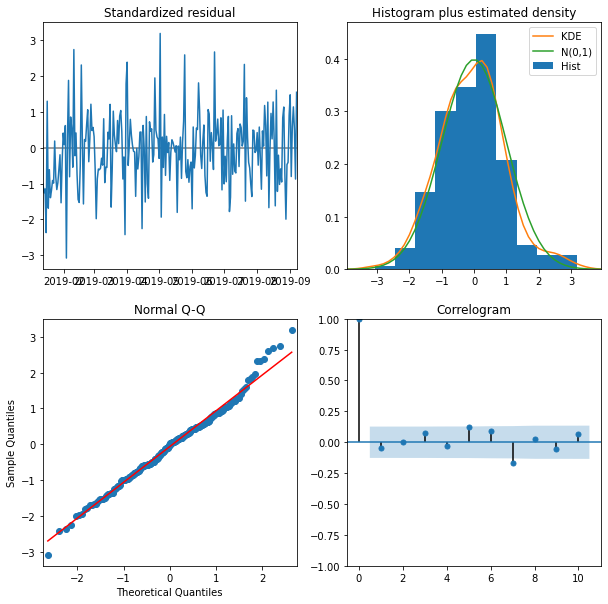

In [19]:
df_경기도_화성시 = df_경기도[df_경기도['region2'] == '화성시']
arima_sarima(df_경기도_화성시)

남양주시

ARIMA


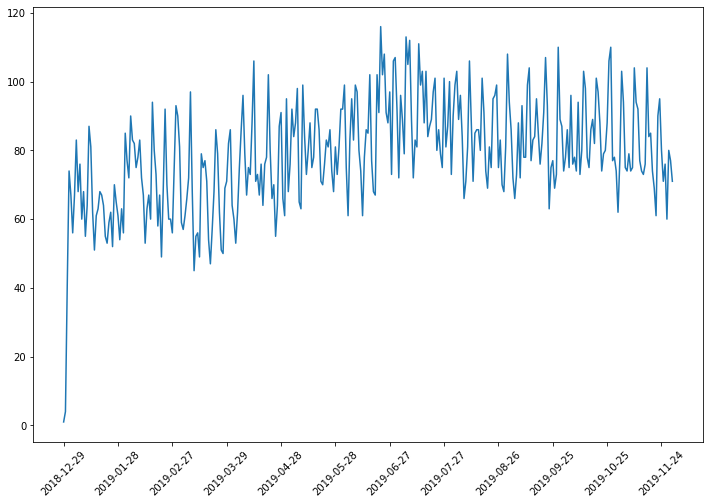

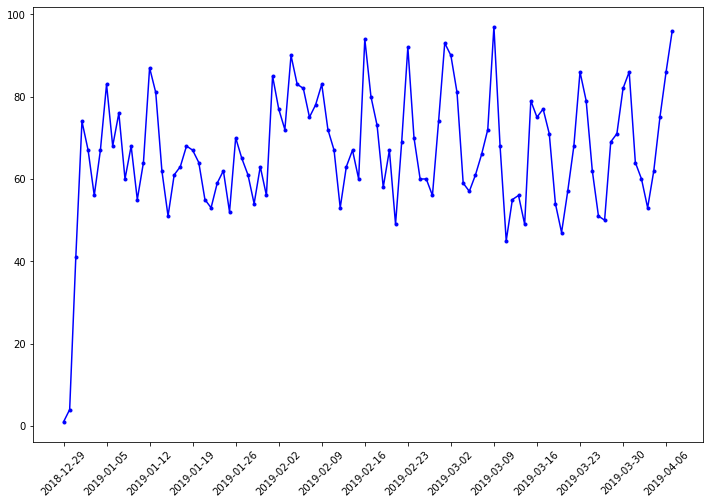

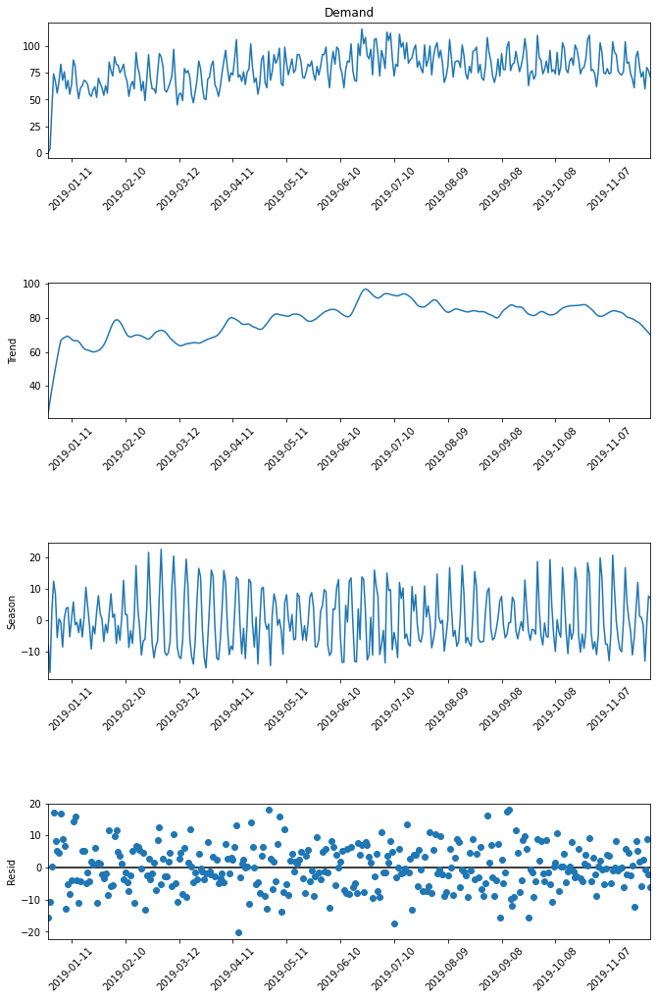

Date
2018-12-31     0.346516
2019-01-01    17.210869
2019-01-02     8.370972
2019-01-03     5.284161
2019-01-04     4.674919
                ...    
2019-11-22     8.408642
2019-11-23     5.335092
2019-11-24     1.772755
2019-11-26     2.616824
2019-11-28     9.051476
Name: resid, Length: 160, dtype: float64


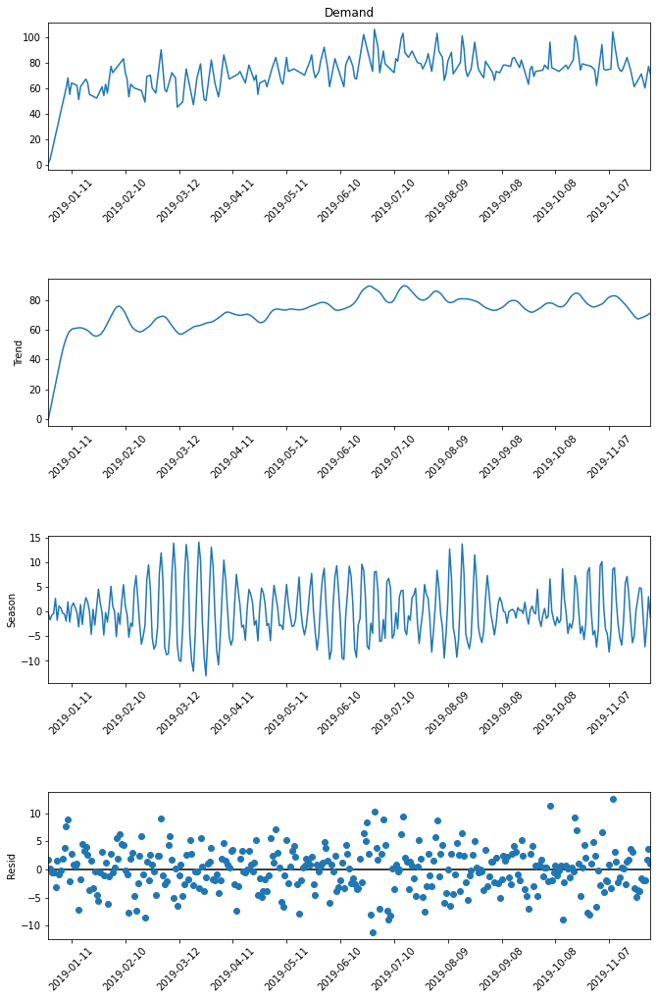

Date
2018-12-29    1.679183
2018-12-30    0.153806
2019-01-03    1.604417
2019-01-06    1.870416
2019-01-07    3.796250
                ...   
2019-11-19    3.644252
2019-11-20    3.148839
2019-11-28    1.797220
2019-11-29    3.590652
2019-11-30    1.009803
Name: resid, Length: 174, dtype: float64


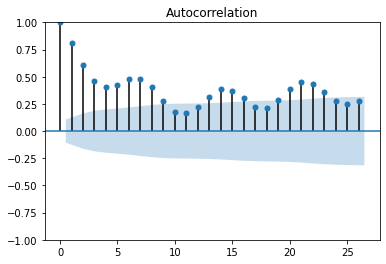

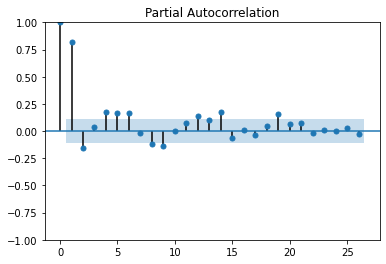

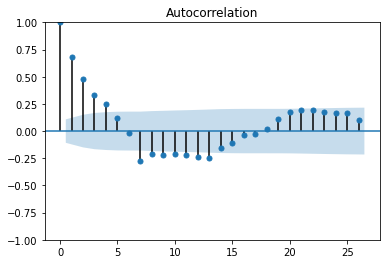

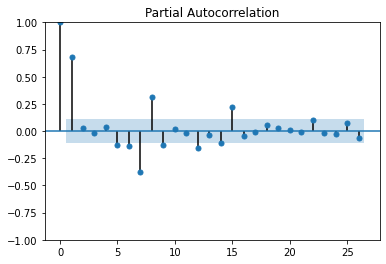

p-value of ADF test (diff 7): 7.991952695905234e-10


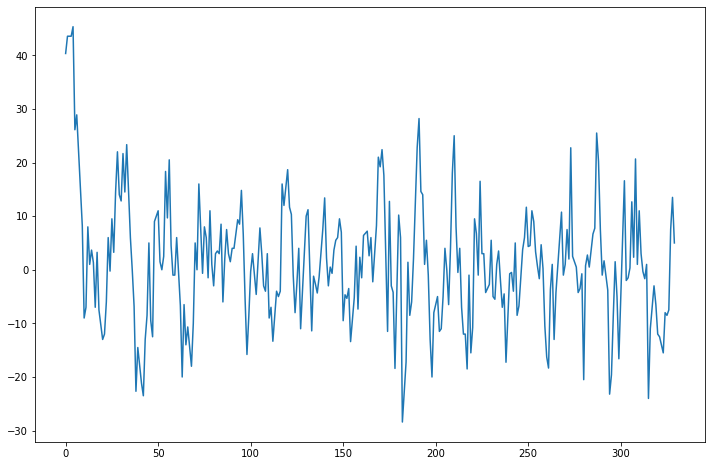

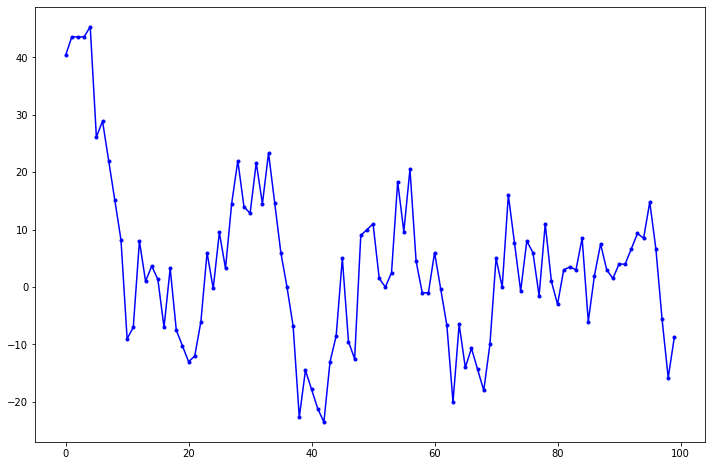

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  246
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -866.314
Date:                Thu, 12 Jan 2023   AIC                           1742.627
Time:                        06:50:57   BIC                           1760.133
Sample:                    01-05-2019   HQIC                          1749.677
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9901      0.103     -9.603      0.000      -1.192      -0.788
ar.L2         -0.3013      0.088     -3.436      0.001      -0.473      -0.129
ar.L3         -0.2456      0.059     -4.135      0.0

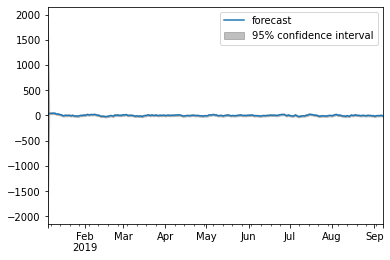

Test RMSE: 11.186533840837729



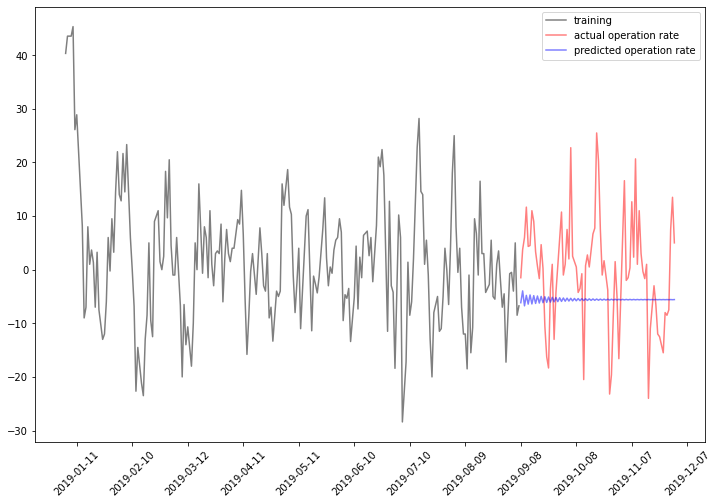





SARIMA
 ARIMA(1,0,0)(2,1,0)[7]          
ar.L1        0.758469
ar.S.L7     -1.015614
ar.S.L14    -0.512931
sigma2      80.354391
dtype: float64
1743.6346612971022
Test RMSE: 11.90128799040442



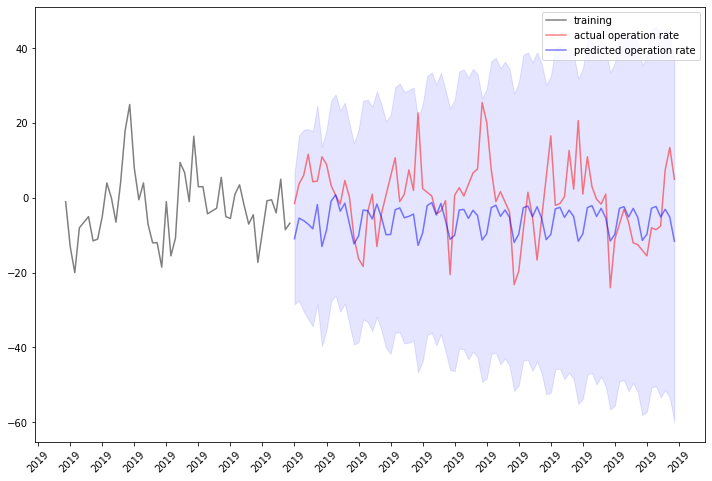

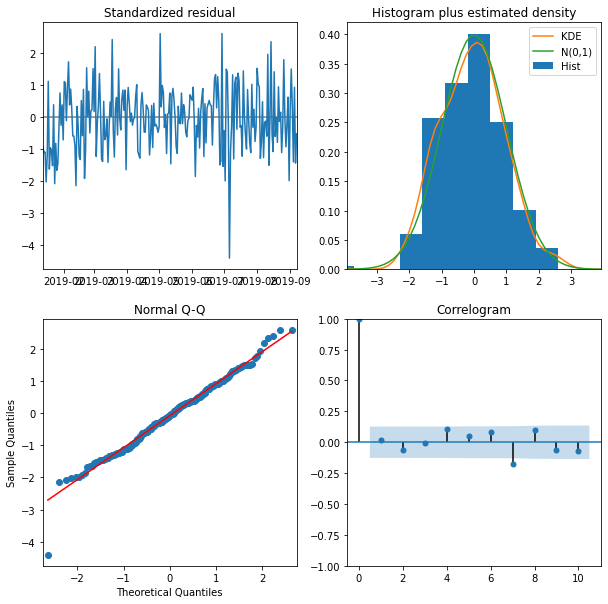

In [20]:
df_경기도_남양주시 = df_경기도[df_경기도['region2'] == '남양주시']
arima_sarima(df_경기도_남양주시)

의정부시

ARIMA


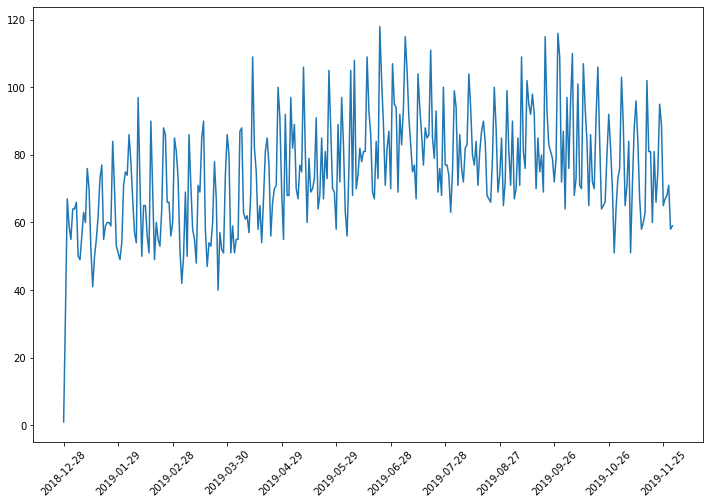

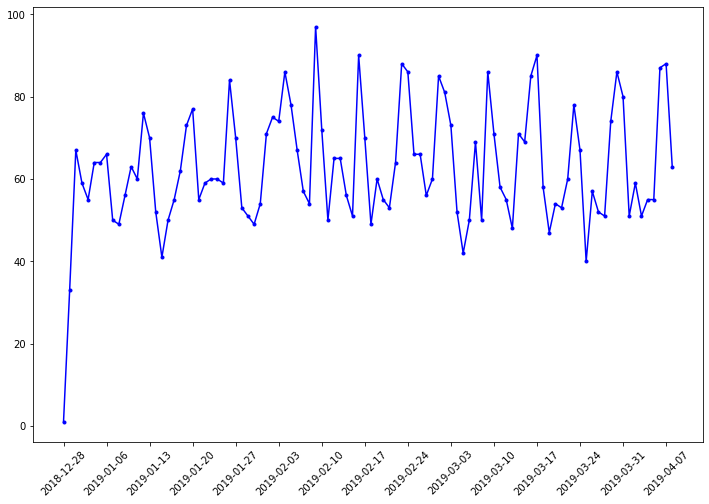

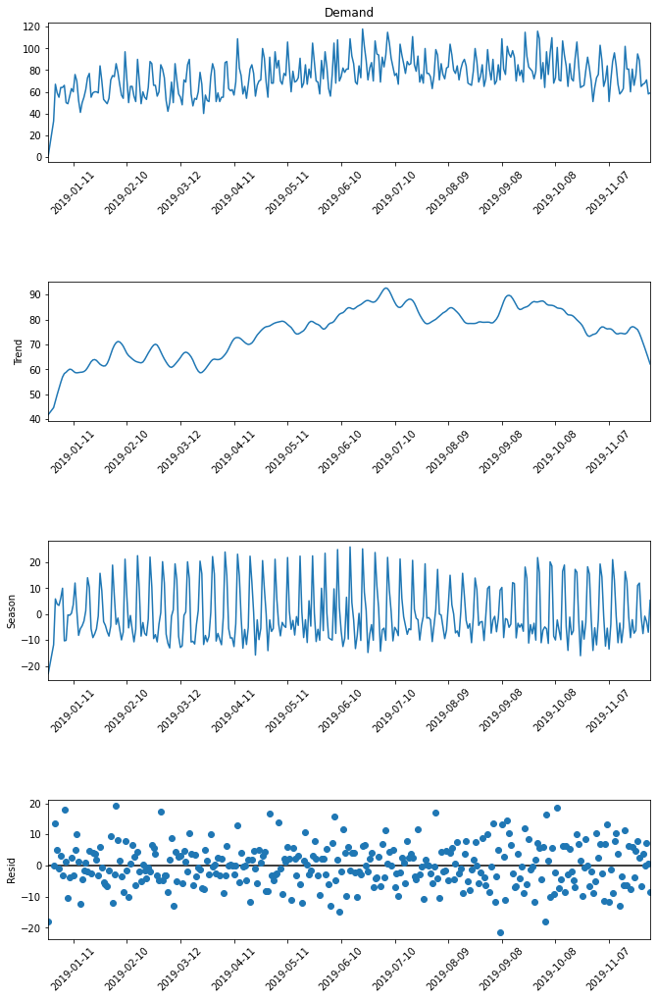

Date
2018-12-31     0.106789
2019-01-01    13.740905
2019-01-02     5.200665
2019-01-04     3.033462
2019-01-06    17.946619
                ...    
2019-11-24     2.500574
2019-11-26     3.829972
2019-11-27     0.131168
2019-11-28     7.289465
2019-11-29     0.593774
Name: resid, Length: 160, dtype: float64


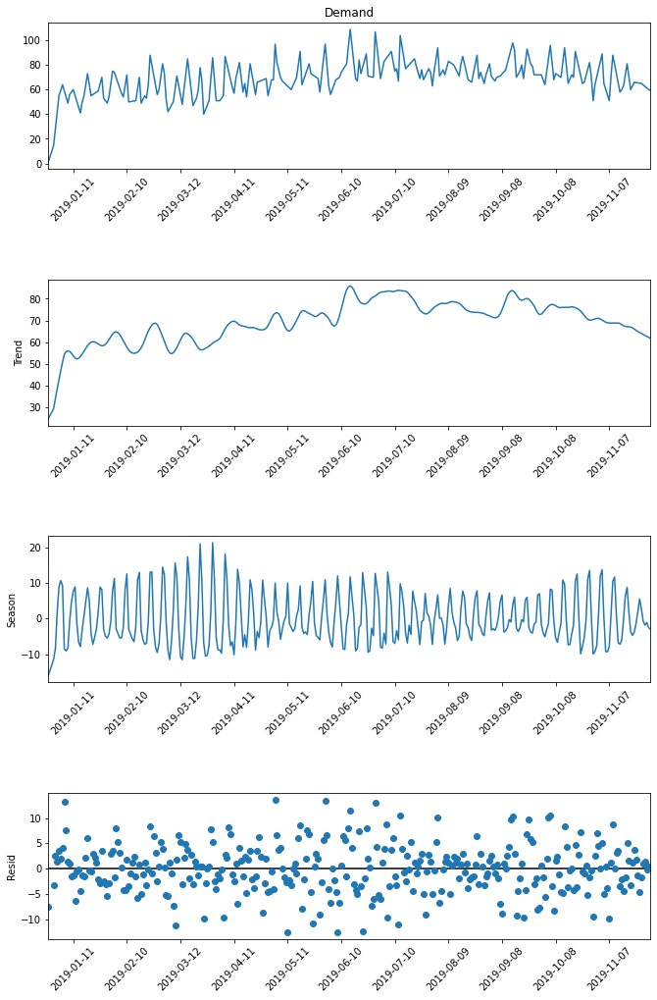

Date
2019-01-01    2.549066
2019-01-02    1.427589
2019-01-03    3.441212
2019-01-04    2.038104
2019-01-05    4.035997
                ...   
2019-11-22    1.728982
2019-11-26    1.027733
2019-11-27    1.425667
2019-11-29    0.506223
2019-11-30    0.166432
Name: resid, Length: 168, dtype: float64


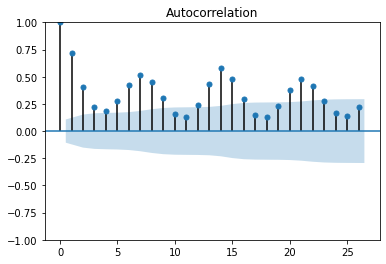

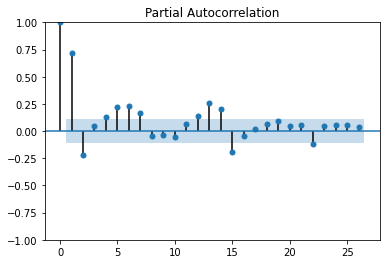

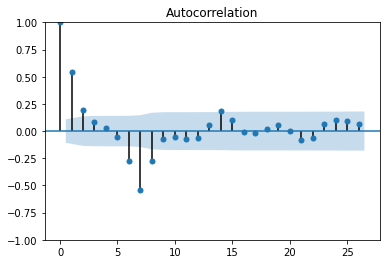

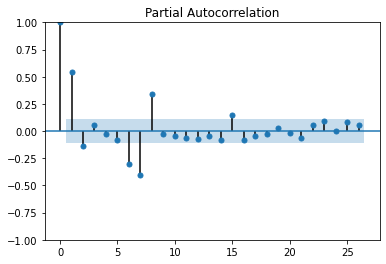

p-value of ADF test (diff 7): 5.100265513824616e-07


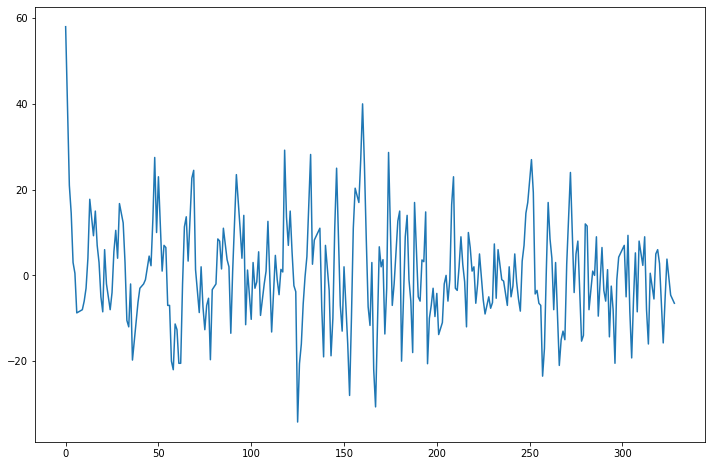

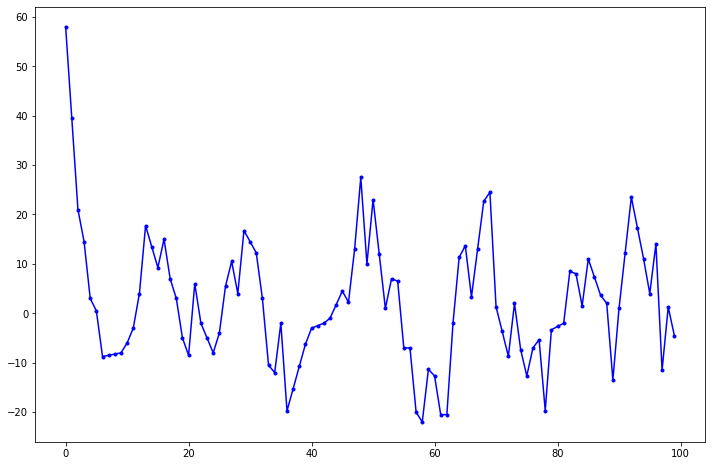

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  245
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -923.383
Date:                Thu, 12 Jan 2023   AIC                           1856.765
Time:                        06:51:22   BIC                           1874.251
Sample:                    01-06-2019   HQIC                          1863.808
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1221      0.395     -0.309      0.757      -0.896       0.652
ar.L2         -0.2646      0.088     -3.002      0.003      -0.437      -0.092
ar.L3         -0.1627      0.131     -1.238      0.2

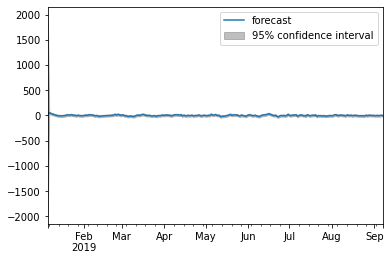

Test RMSE: 10.7390490208824



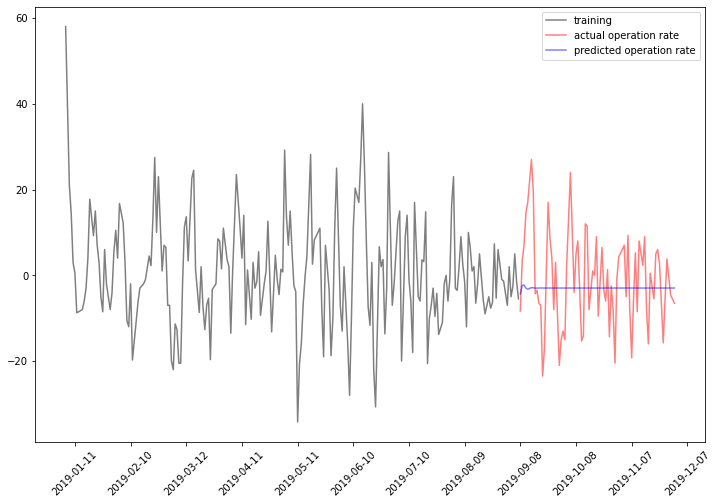





SARIMA
 ARIMA(1,0,0)(2,1,0)[7]          
ar.L1        0.615364
ar.S.L7     -1.164742
ar.S.L14    -0.453731
sigma2      95.995508
dtype: float64
1780.5247101750679
Test RMSE: 11.182772723064819



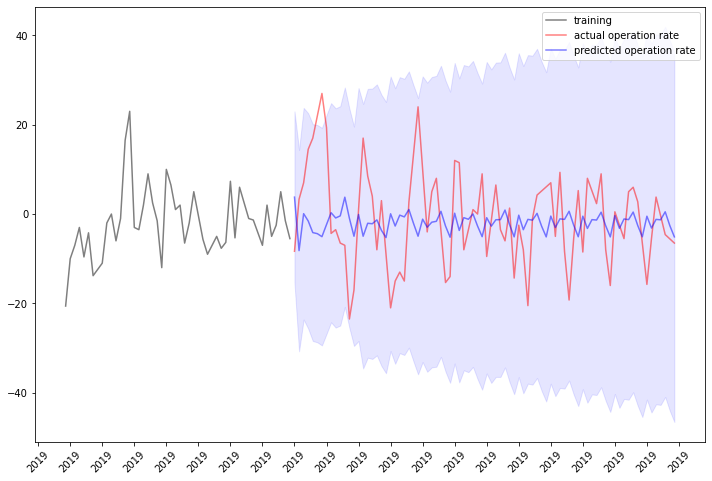

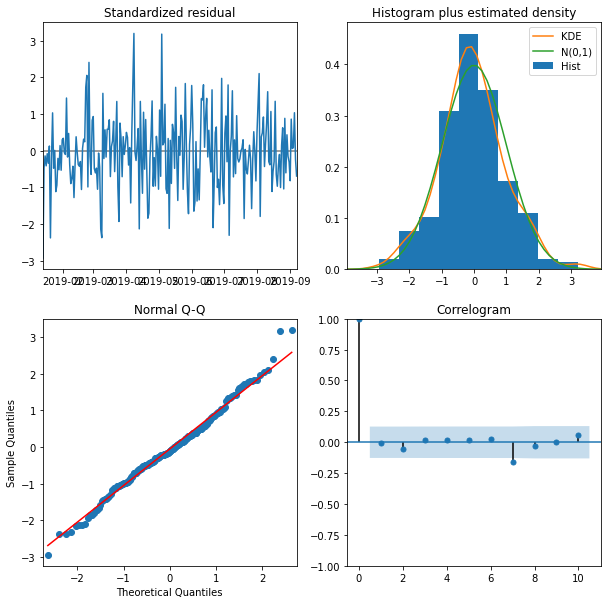

In [21]:
df_경기도_의정부시 = df_경기도[df_경기도['region2'] == '의정부시']
arima_sarima(df_경기도_의정부시)

고양시 덕양구

ARIMA


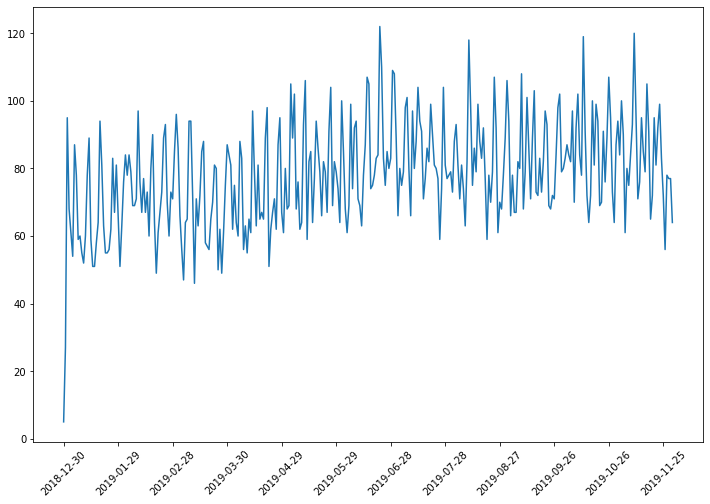

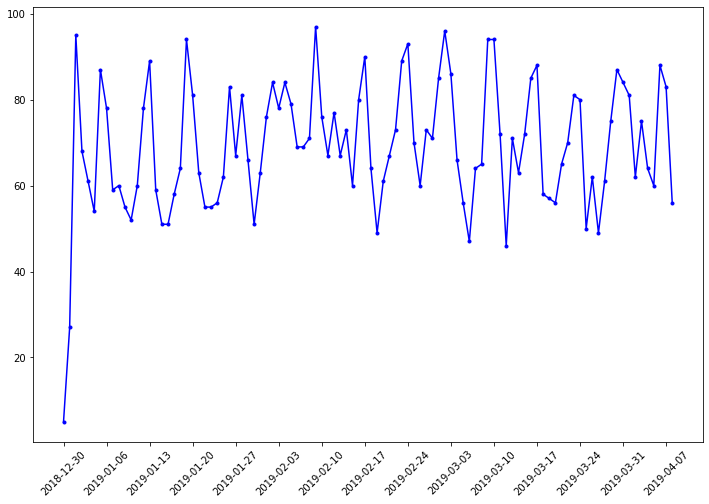

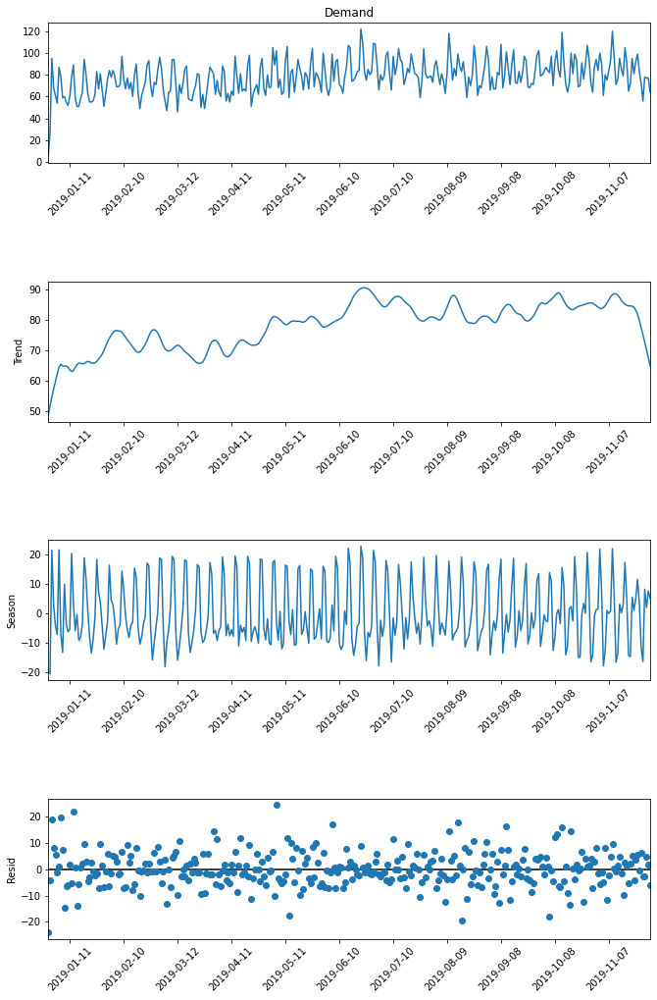

Date
2019-01-01    18.972140
2019-01-02     7.993692
2019-01-03     5.453817
2019-01-05     1.040717
2019-01-06    19.635580
                ...    
2019-11-22     3.747523
2019-11-23     5.584444
2019-11-25     6.077992
2019-11-28     4.930407
2019-11-29     1.837359
Name: resid, Length: 153, dtype: float64


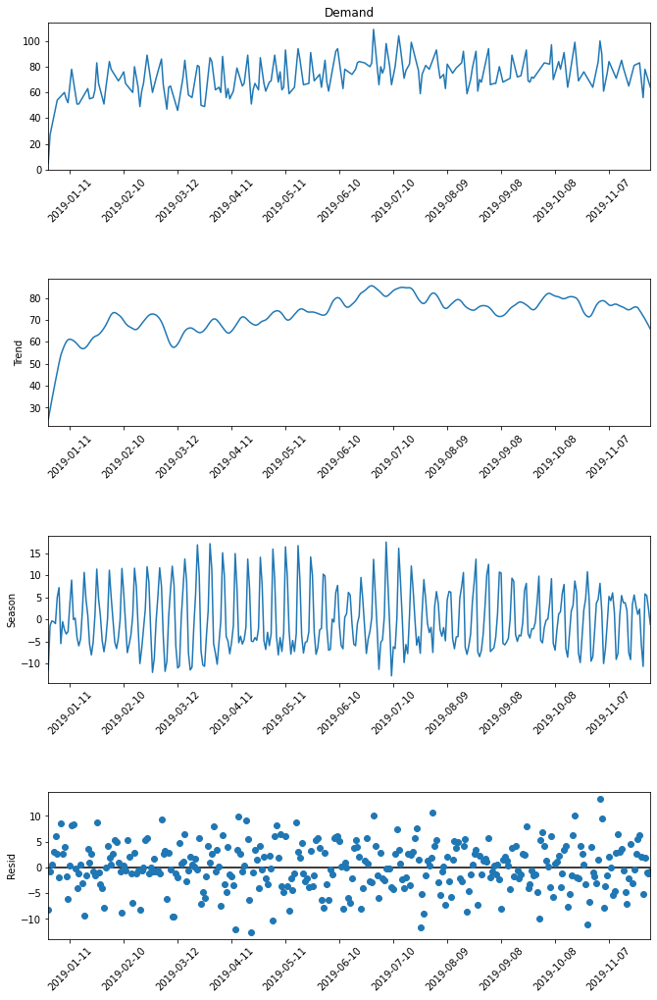

Date
2019-01-01    0.515757
2019-01-02    3.125749
2019-01-03    6.079227
2019-01-04    2.754829
2019-01-06    8.549065
                ...   
2019-11-22    2.645886
2019-11-23    5.567016
2019-11-24    6.287616
2019-11-25    2.083275
2019-11-27    1.831817
Name: resid, Length: 165, dtype: float64


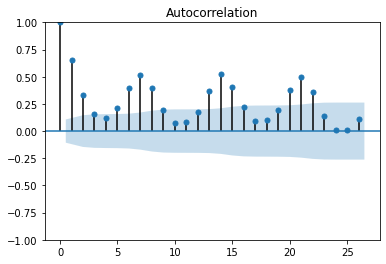

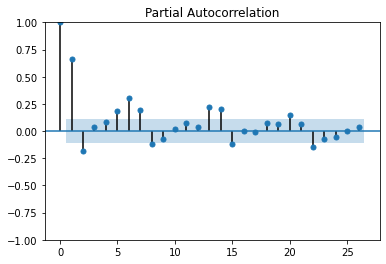

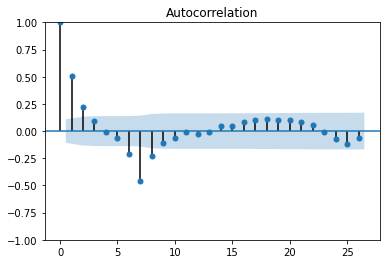

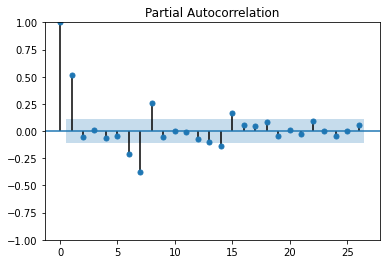

p-value of ADF test (diff 7): 4.4907550768506623e-08


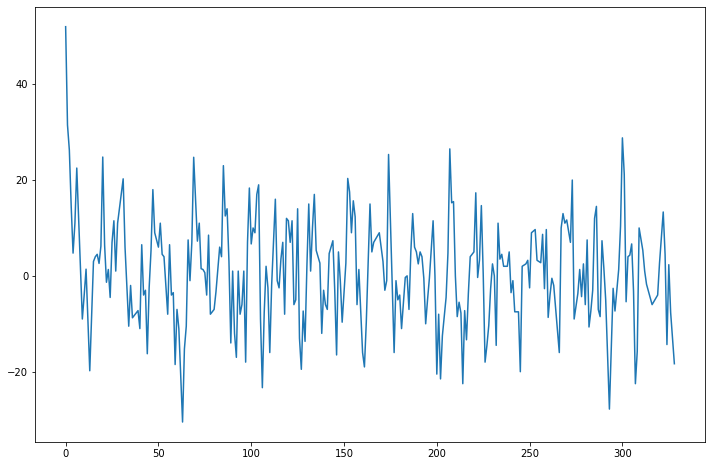

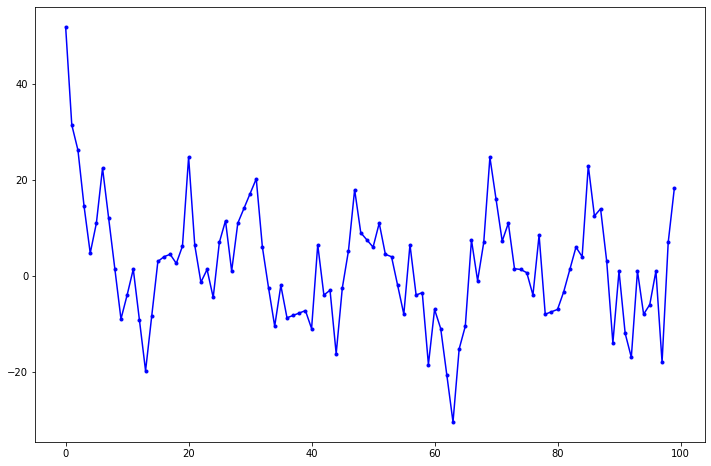

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  245
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -891.424
Date:                Thu, 12 Jan 2023   AIC                           1792.847
Time:                        06:51:51   BIC                           1810.333
Sample:                    01-06-2019   HQIC                          1799.889
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6001      0.067      9.007      0.000       0.469       0.731
ar.L2         -0.0541      0.078     -0.695      0.487      -0.206       0.098
ar.L3          0.0401      0.071      0.567      0.5

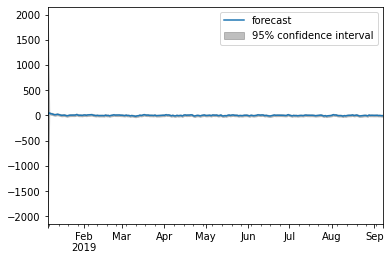

Test RMSE: 9.969966225797714



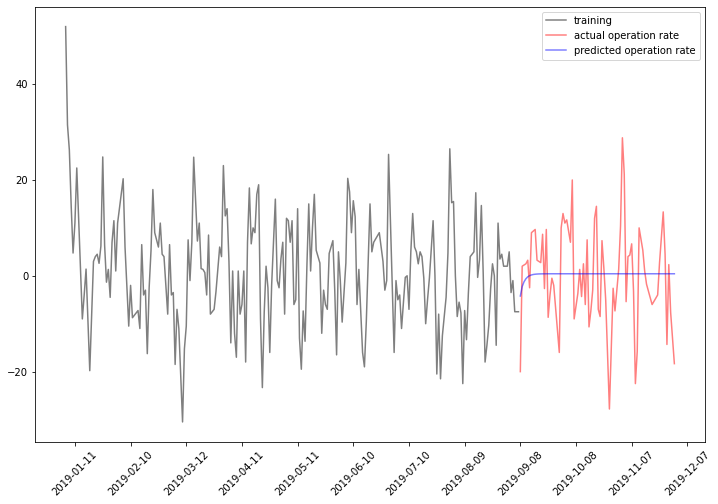





SARIMA
 ARIMA(2,0,5)(2,1,0)[7]          
ar.L1        0.186147
ar.L2        0.540455
ma.L1        0.484508
ma.L2       -0.539885
ma.L3       -0.350052
ma.L4       -0.075067
ma.L5       -0.311558
ar.S.L7     -0.971041
ar.S.L14    -0.515365
sigma2      85.069174
dtype: float64
1765.768087674442
Test RMSE: 10.295248492118054



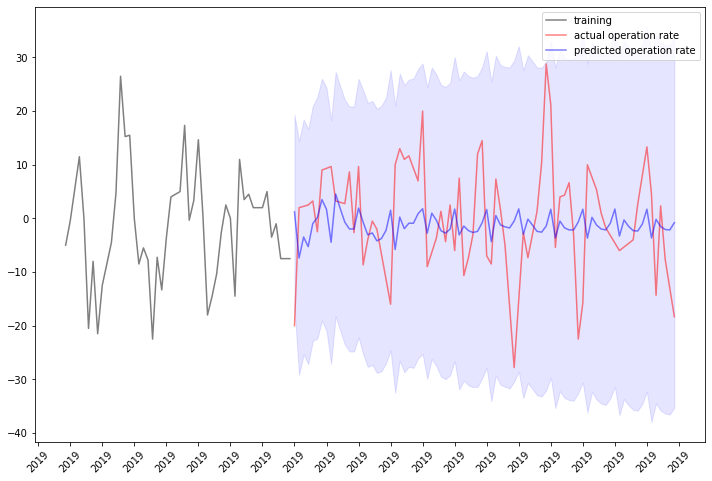

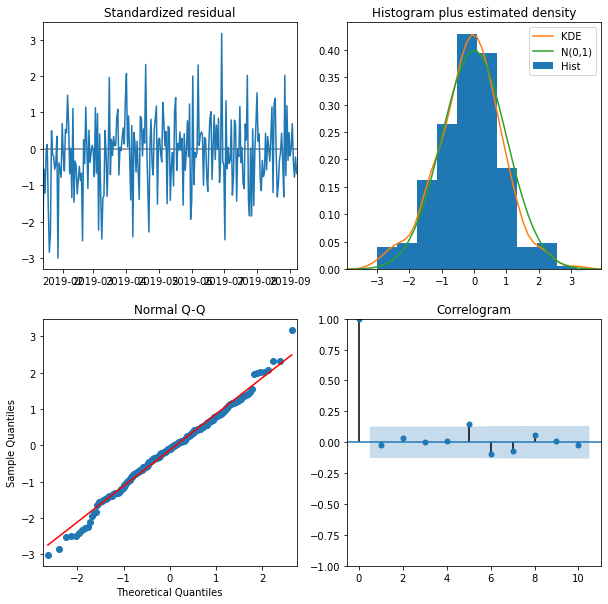

In [22]:
df_경기도_고양시_덕양구 = df_경기도[df_경기도['region2'] == '고양시\u3000덕양구']
arima_sarima(df_경기도_고양시_덕양구)

성남시 분당구

ARIMA


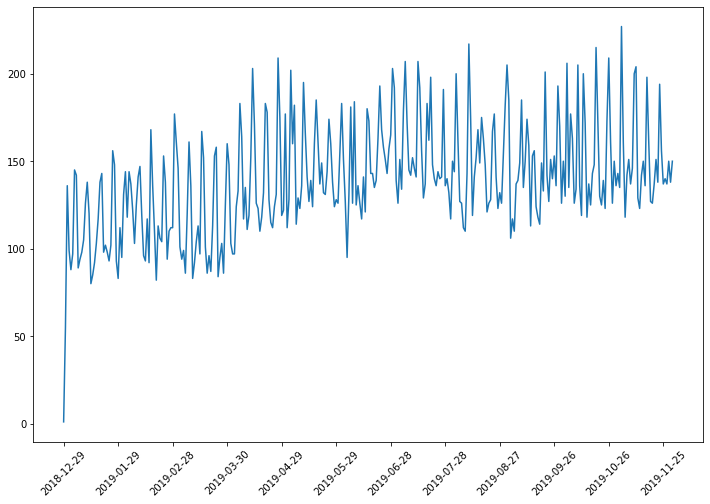

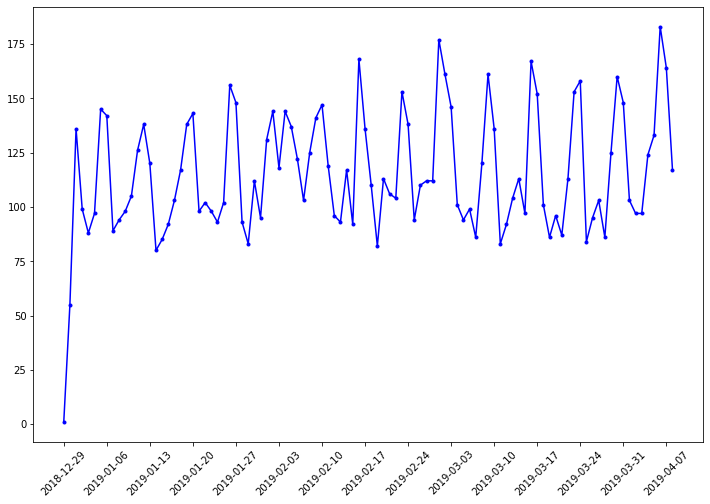

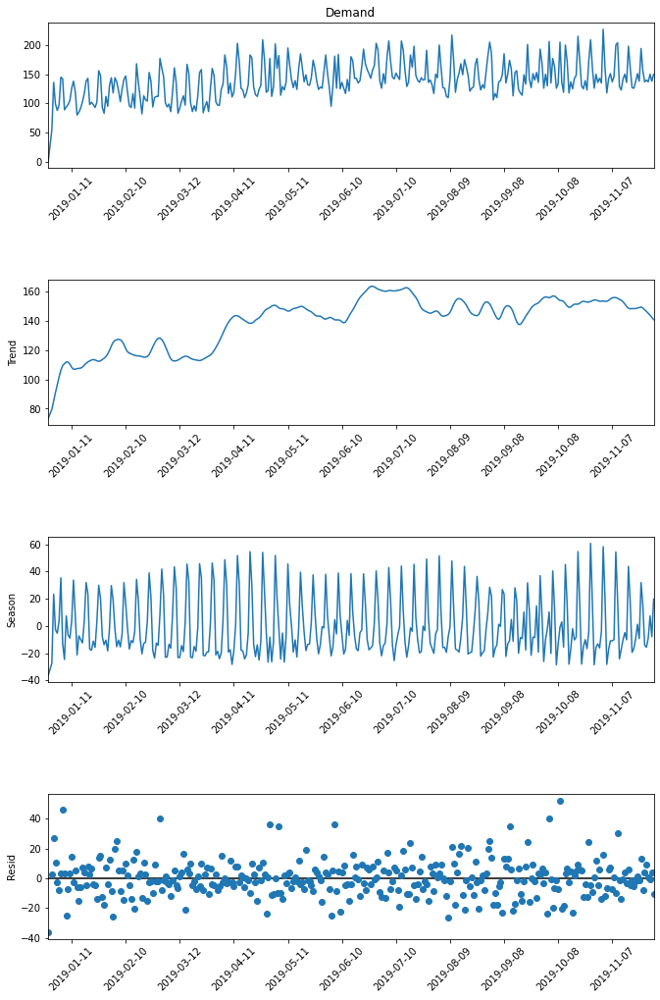

Date
2018-12-31     2.856198
2019-01-01    27.330112
2019-01-02    10.861776
2019-01-05     3.530478
2019-01-06    46.060401
                ...    
2019-11-23    13.012039
2019-11-25     3.662185
2019-11-26     9.483832
2019-11-27     0.970827
2019-11-29     3.728130
Name: resid, Length: 159, dtype: float64


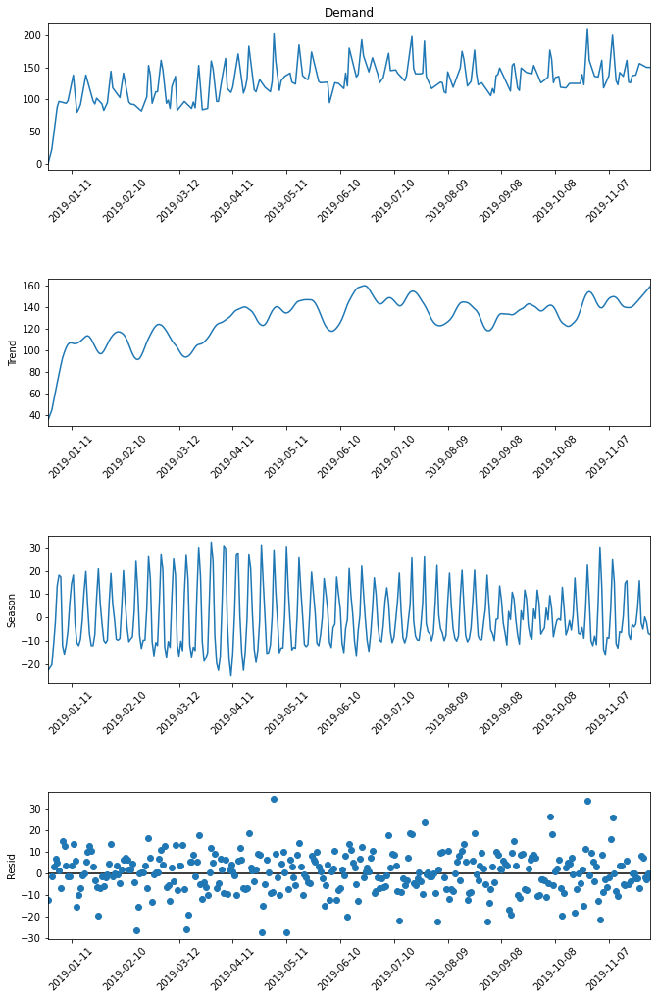

Date
2019-01-01     3.311771
2019-01-02     6.818850
2019-01-03     5.015897
2019-01-04     1.284245
2019-01-06    14.962822
                ...    
2019-11-14     3.574230
2019-11-17     5.996299
2019-11-21     0.104662
2019-11-25     7.961579
2019-11-26     7.074019
Name: resid, Length: 170, dtype: float64


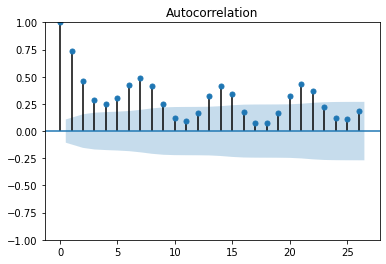

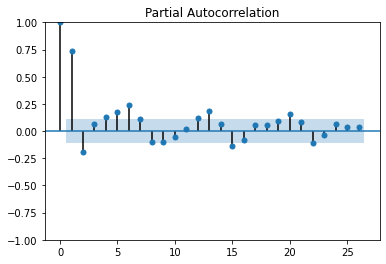

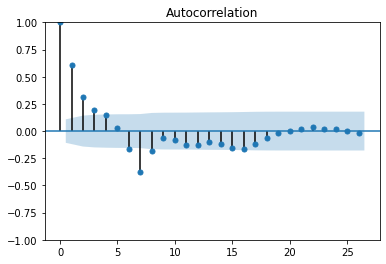

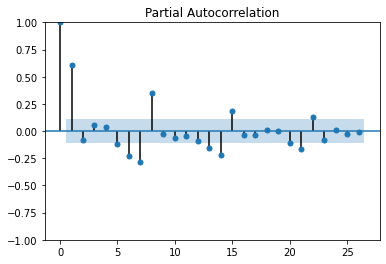

p-value of ADF test (diff 7): 1.2192690031027994e-08


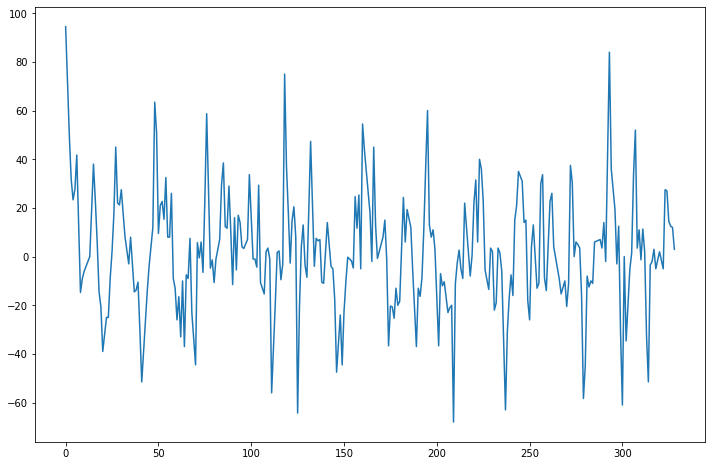

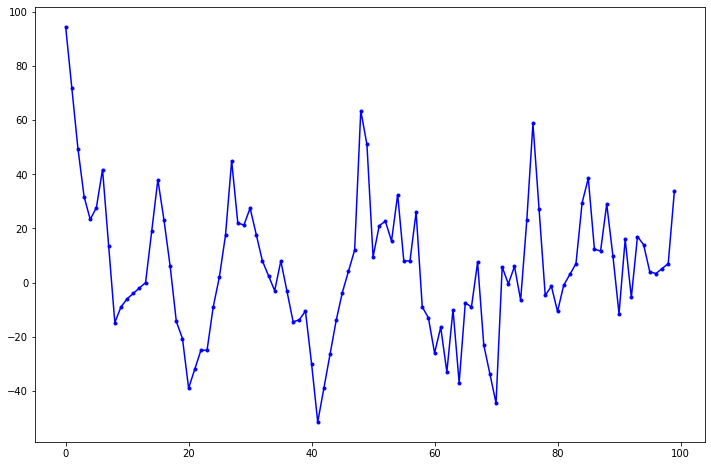

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  245
Model:                 ARIMA(3, 1, 1)   Log Likelihood               -1067.082
Date:                Thu, 12 Jan 2023   AIC                           2144.165
Time:                        06:53:45   BIC                           2161.651
Sample:                    01-06-2019   HQIC                          2151.207
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8837      0.144     -6.155      0.000      -1.165      -0.602
ar.L2         -0.3294      0.093     -3.552      0.000      -0.511      -0.148
ar.L3         -0.2981      0.072     -4.140      0.0

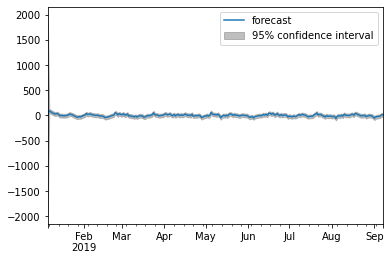

Test RMSE: 33.54359162443138



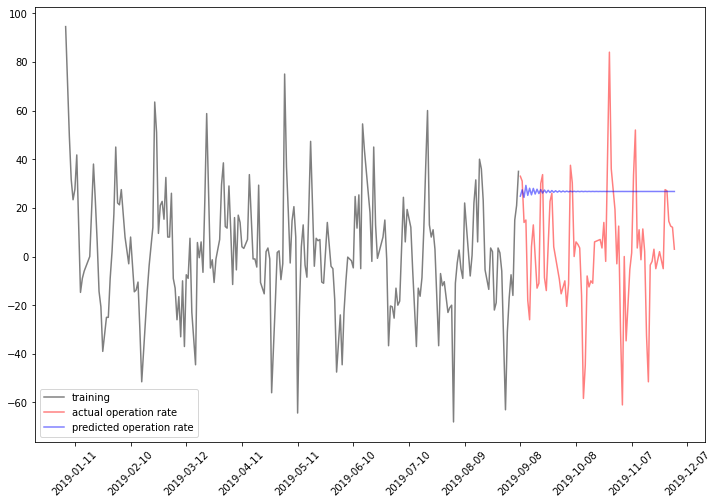





SARIMA
 ARIMA(1,0,0)(2,1,0)[7]          
ar.L1         0.691844
ar.S.L7      -0.949545
ar.S.L14     -0.459038
sigma2      461.975588
dtype: float64
2151.3192507986214
Test RMSE: 24.881518633732682



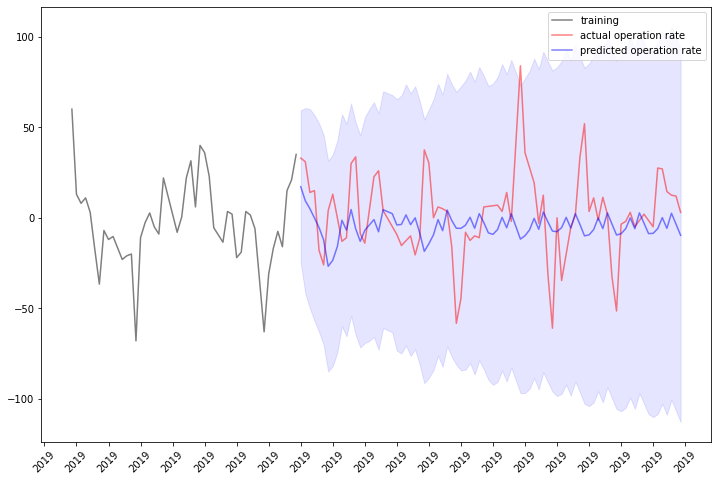

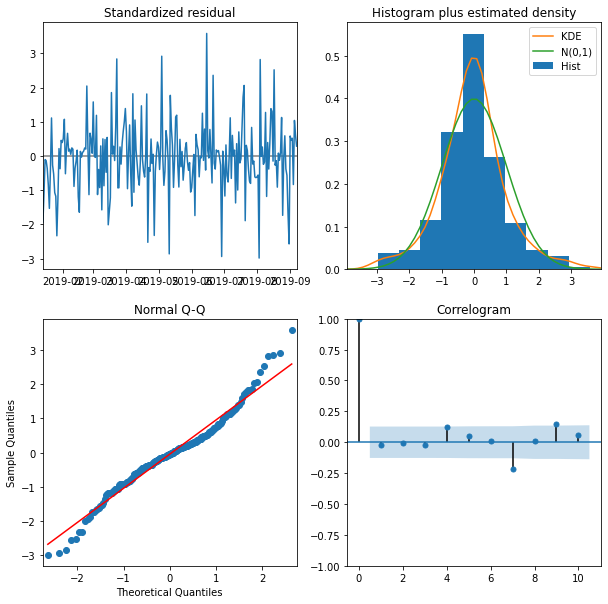

In [23]:
df_경기도_성남시_분당구 = df_경기도[df_경기도['region2'] == '성남시\u3000분당구']
arima_sarima(df_경기도_성남시_분당구)

성남시 수정구

ARIMA


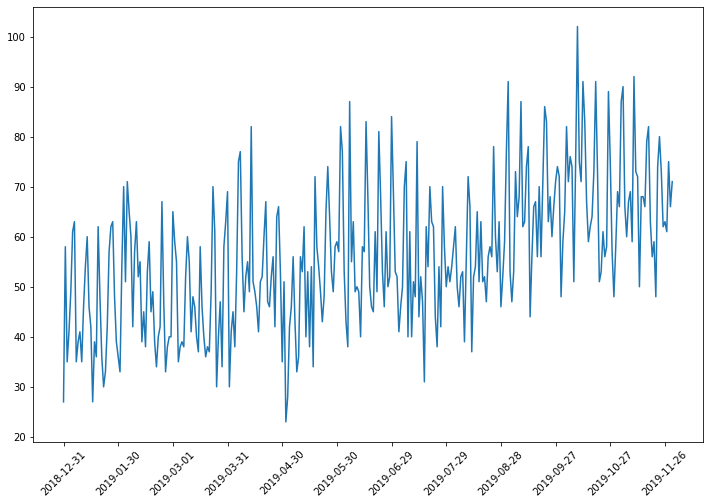

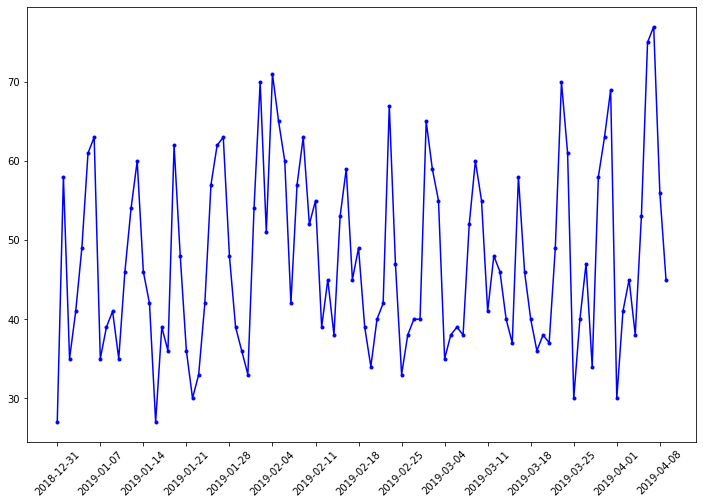

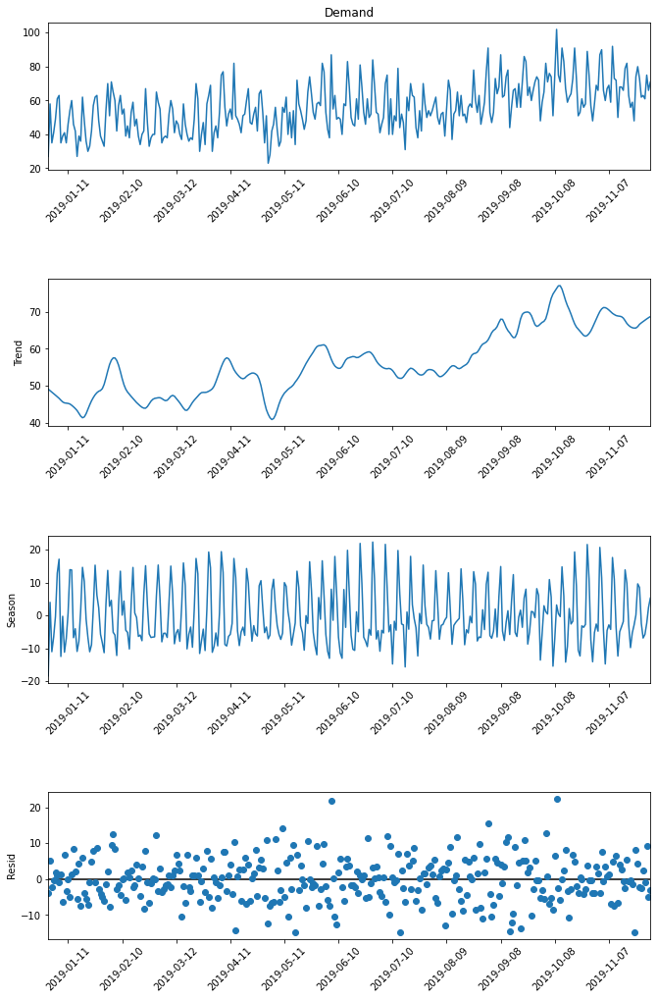

Date
2019-01-01    5.255865
2019-01-04    1.820637
2019-01-05    1.014602
2019-01-07    1.320265
2019-01-09    6.748066
                ...   
2019-11-17    5.360373
2019-11-22    8.230950
2019-11-23    4.350926
2019-11-26    2.463923
2019-11-28    9.261453
Name: resid, Length: 161, dtype: float64


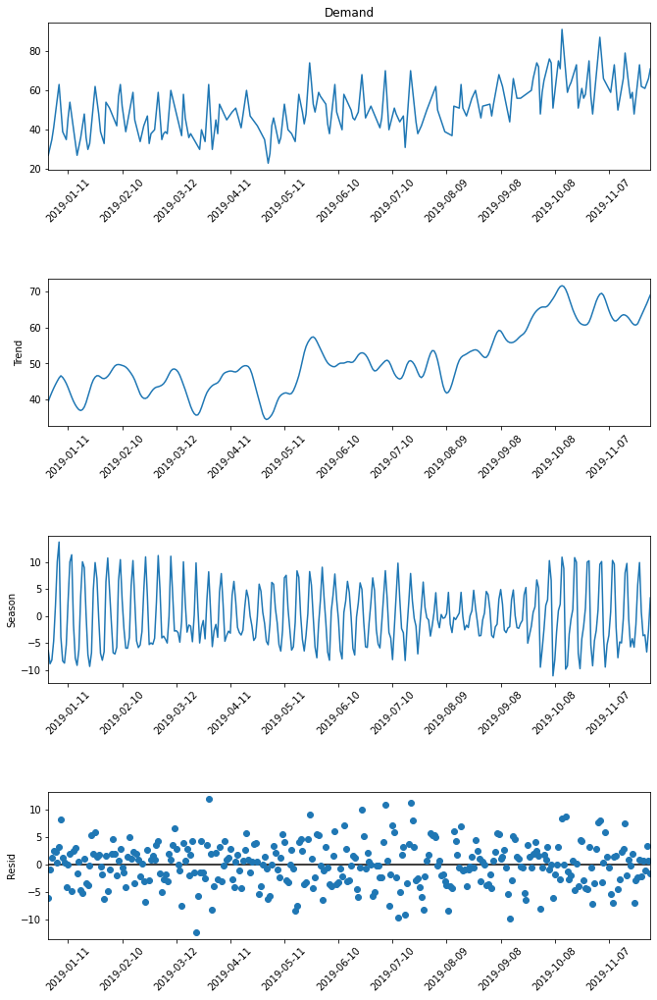

Date
2019-01-02    1.171960
2019-01-03    2.518559
2019-01-04    2.267538
2019-01-05    0.448295
2019-01-06    3.266937
                ...   
2019-11-20    1.926426
2019-11-24    0.850567
2019-11-26    0.764282
2019-11-28    3.474226
2019-11-29    0.736104
Name: resid, Length: 165, dtype: float64


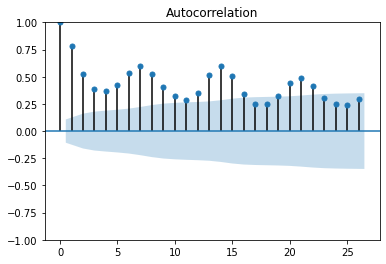

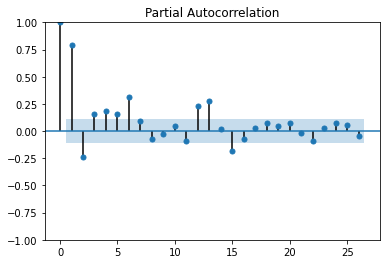

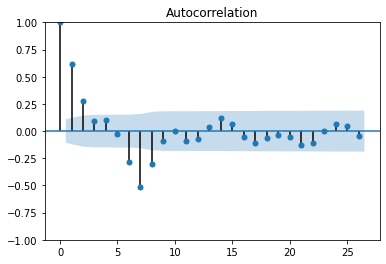

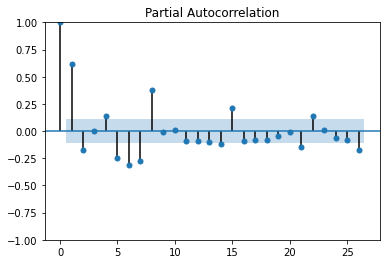

p-value of ADF test (diff 7): 4.156979141464583e-06


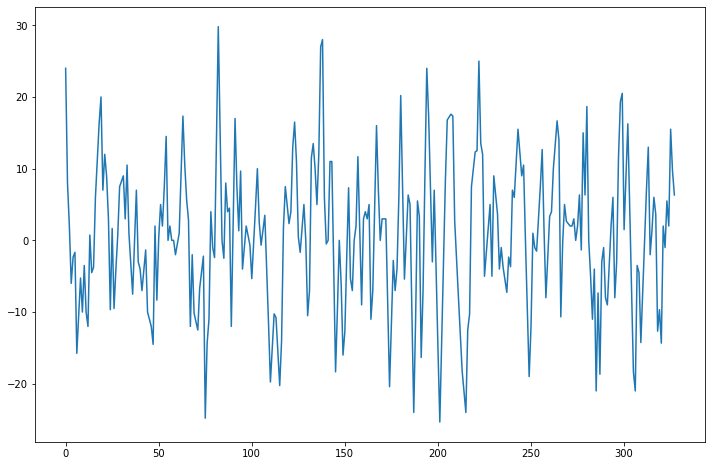

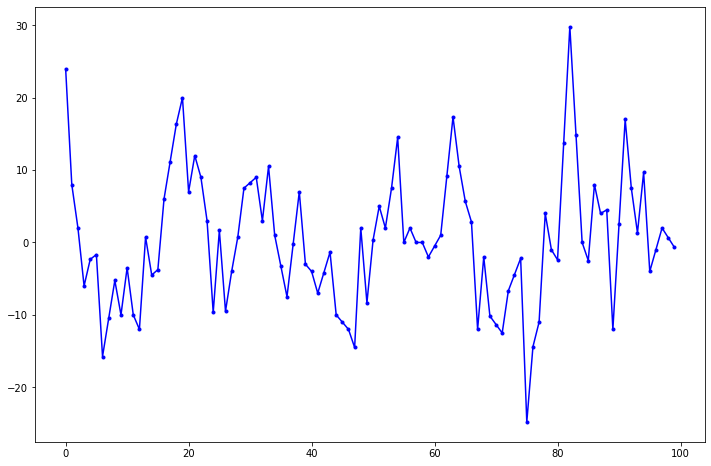

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  244
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -844.221
Date:                Thu, 12 Jan 2023   AIC                           1698.442
Time:                        06:54:19   BIC                           1715.907
Sample:                    01-07-2019   HQIC                          1705.477
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7894      0.081     -9.689      0.000      -0.949      -0.630
ar.L2         -0.2513      0.079     -3.176      0.001      -0.406      -0.096
ar.L3         -0.3994      0.063     -6.324      0.0

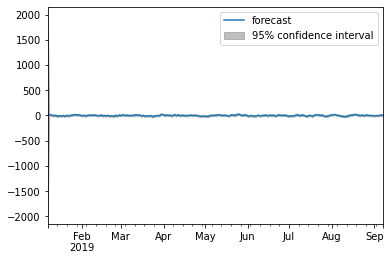

Test RMSE: 16.703496317343966



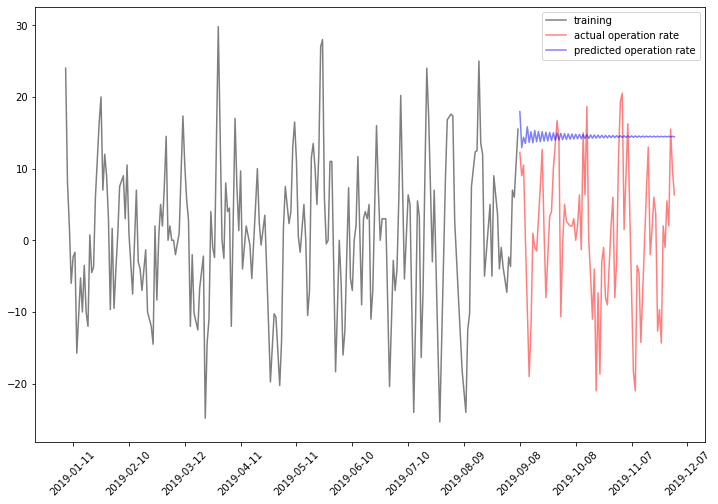





SARIMA
 ARIMA(1,0,1)(2,1,0)[7]          
ar.L1        0.617677
ma.L1        0.153520
ar.S.L7     -1.076630
ar.S.L14    -0.438774
sigma2      66.618282
dtype: float64
1687.0848047438267
Test RMSE: 9.613925666395307



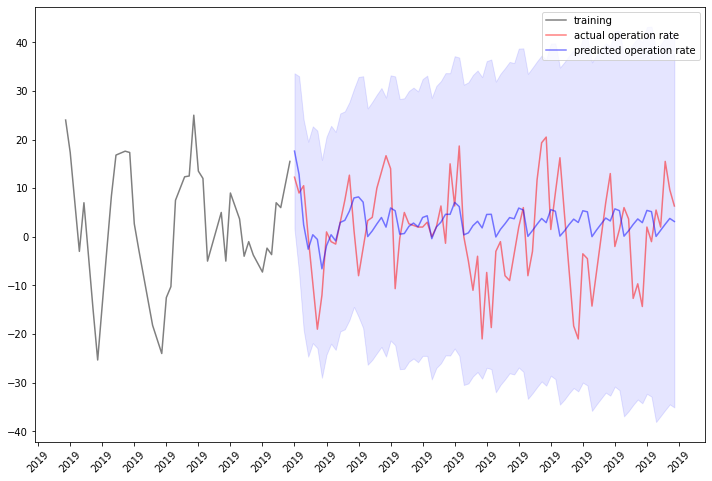

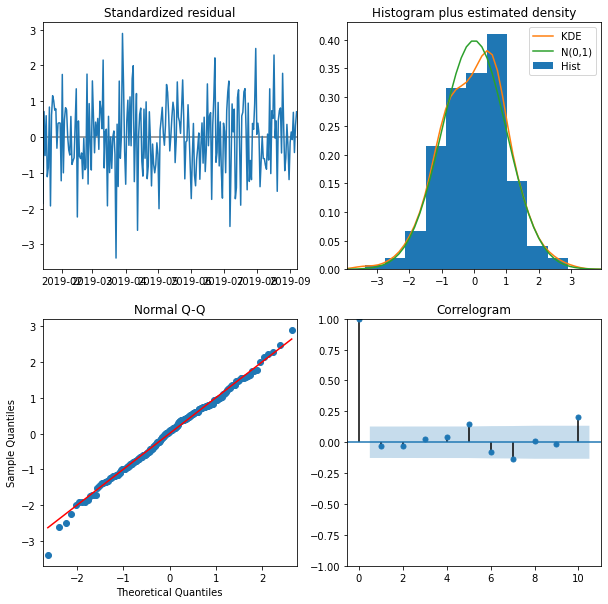

In [24]:
df_경기도_성남시_수정구 = df_경기도[df_경기도['region2'] == '성남시\u3000수정구']
arima_sarima(df_경기도_성남시_수정구)

성남시 중원구

ARIMA


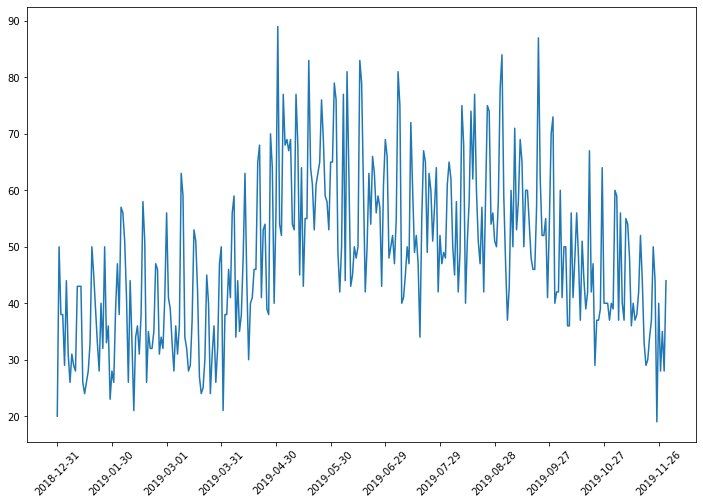

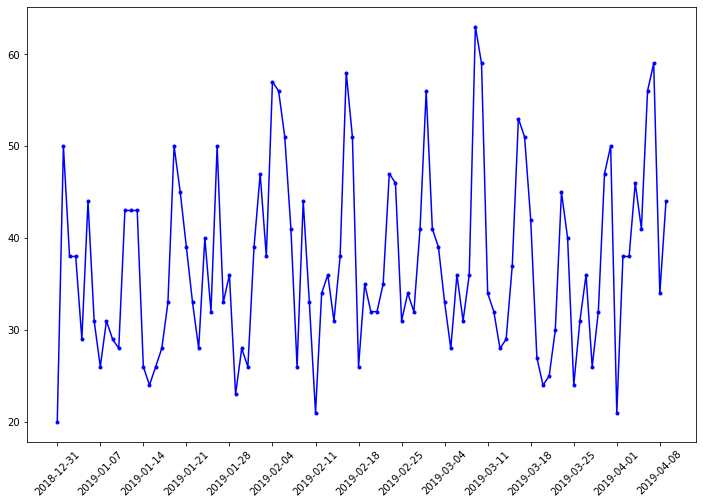

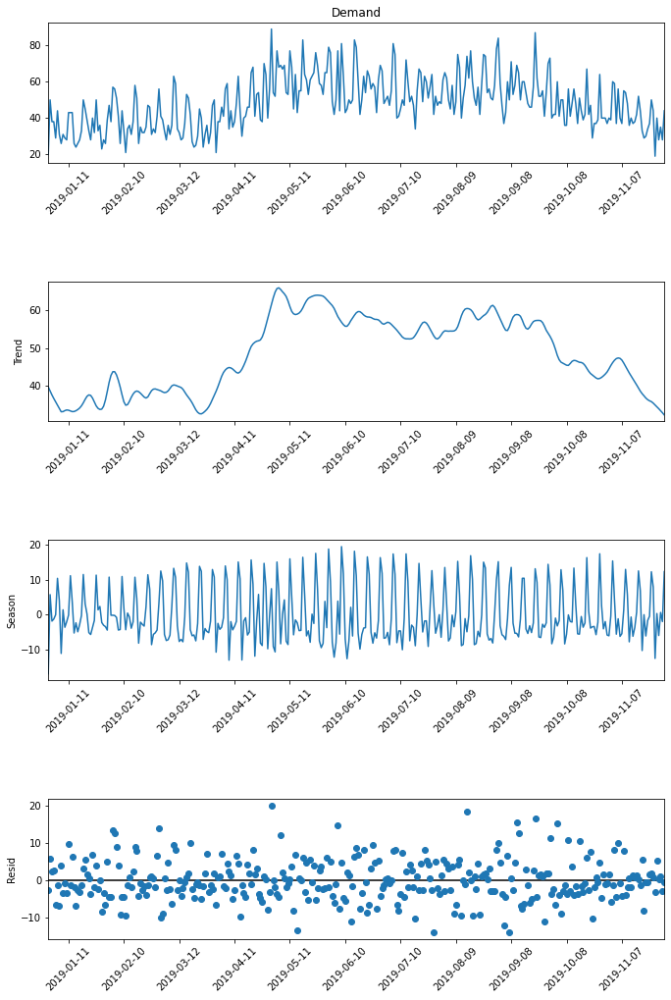

Date
2019-01-01    5.712519
2019-01-02    2.328720
2019-01-03    2.678773
2019-01-07    4.047022
2019-01-11    9.622974
                ...   
2019-11-22    1.466496
2019-11-23    1.925784
2019-11-24    0.713227
2019-11-26    5.278737
2019-11-28    0.995654
Name: resid, Length: 151, dtype: float64


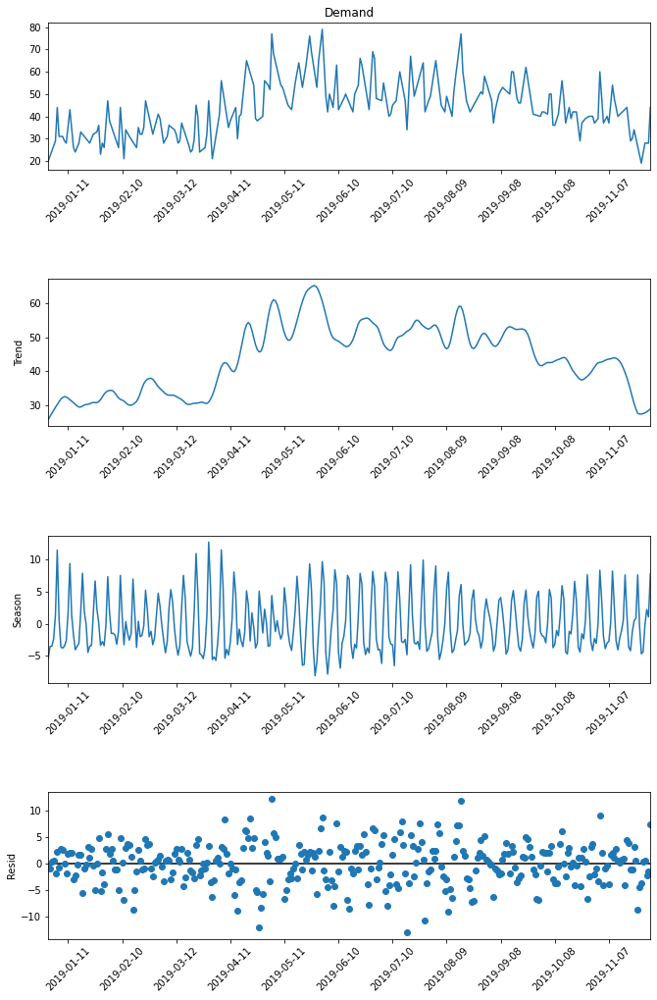

Date
2019-01-02    0.353169
2019-01-03    0.584440
2019-01-05    2.276268
2019-01-07    2.804281
2019-01-08    2.487063
                ...   
2019-11-21    3.049640
2019-11-22    0.478829
2019-11-26    0.330174
2019-11-27    0.483879
2019-11-30    7.278596
Name: resid, Length: 175, dtype: float64


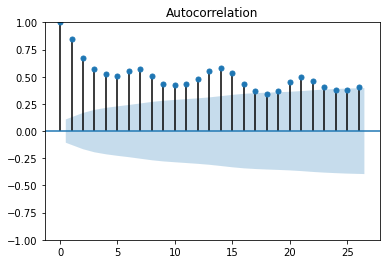

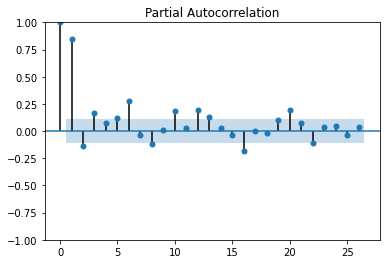

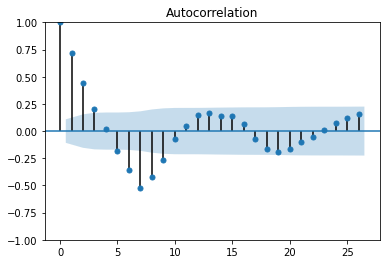

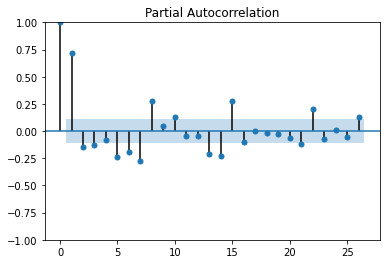

p-value of ADF test (diff 7): 2.251853642695177e-06


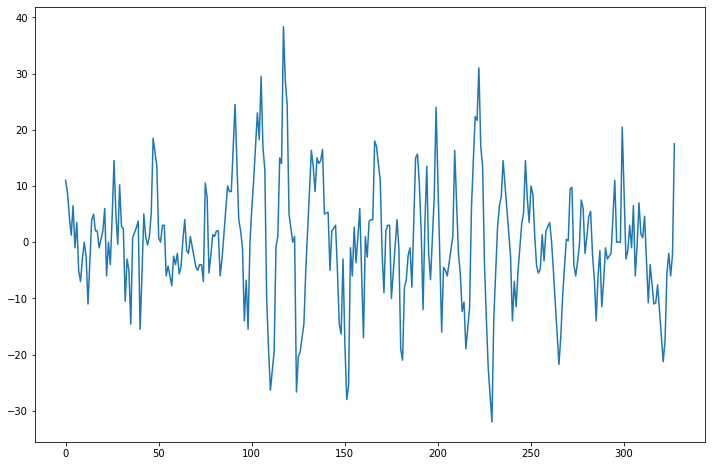

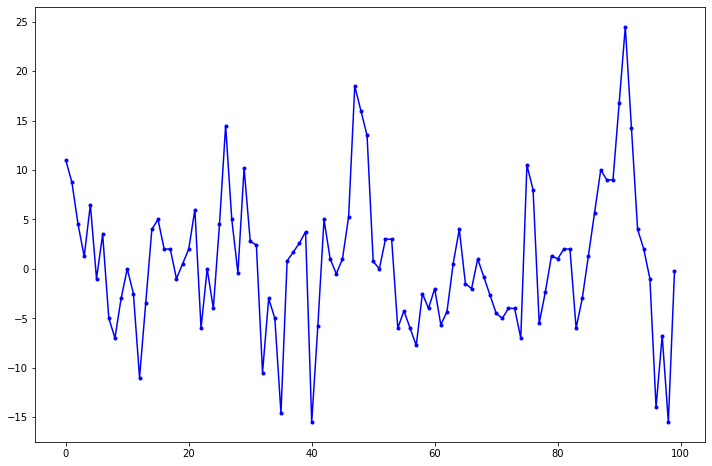

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  244
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -854.967
Date:                Thu, 12 Jan 2023   AIC                           1719.933
Time:                        06:55:13   BIC                           1737.399
Sample:                    01-07-2019   HQIC                          1726.968
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7972      0.114     -6.995      0.000      -1.021      -0.574
ar.L2         -0.0027      0.077     -0.035      0.972      -0.154       0.148
ar.L3         -0.1275      0.071     -1.808      0.0

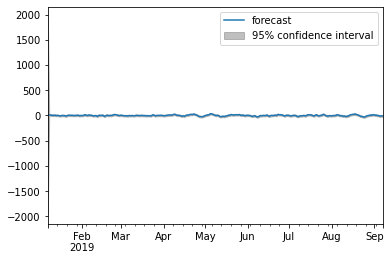

Test RMSE: 9.087319918924726



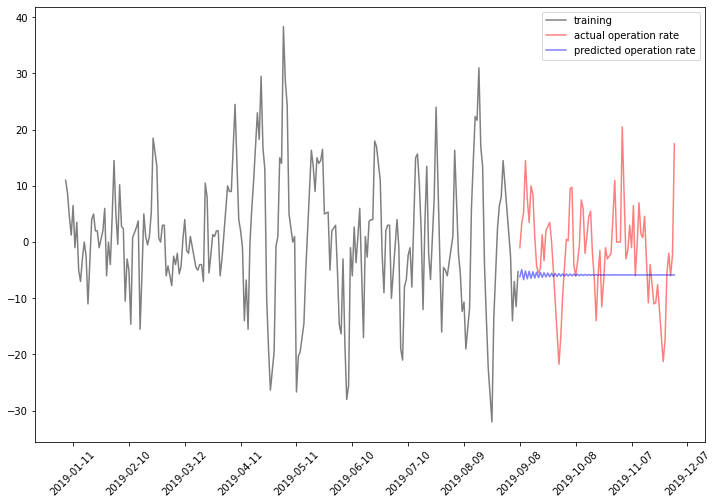





SARIMA
 ARIMA(1,0,0)(2,1,0)[7]          
ar.L1        0.697318
ar.S.L7     -1.017176
ar.S.L14    -0.505388
sigma2      73.374697
dtype: float64
1707.5275617964319
Test RMSE: 8.728048903895898



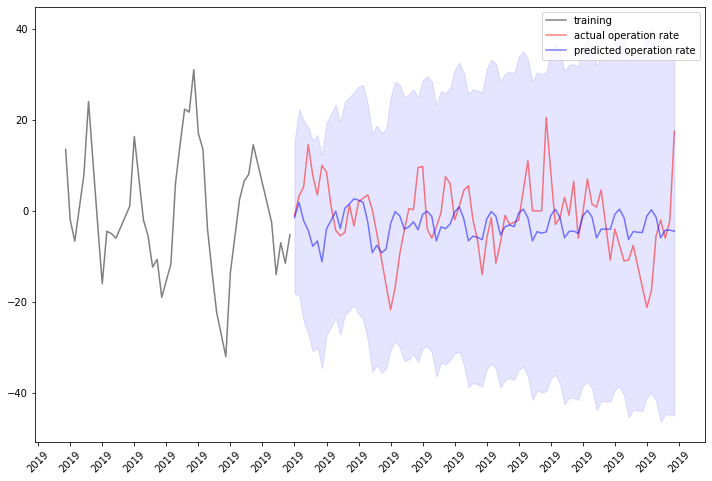

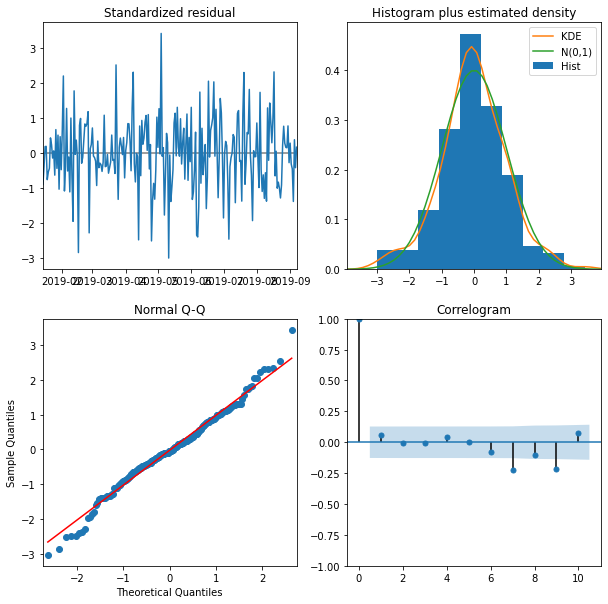

In [25]:
df_경기도_성남시_중원구 = df_경기도[df_경기도['region2'] == '성남시\u3000중원구']
arima_sarima(df_경기도_성남시_중원구)

안양시 동안구

ARIMA


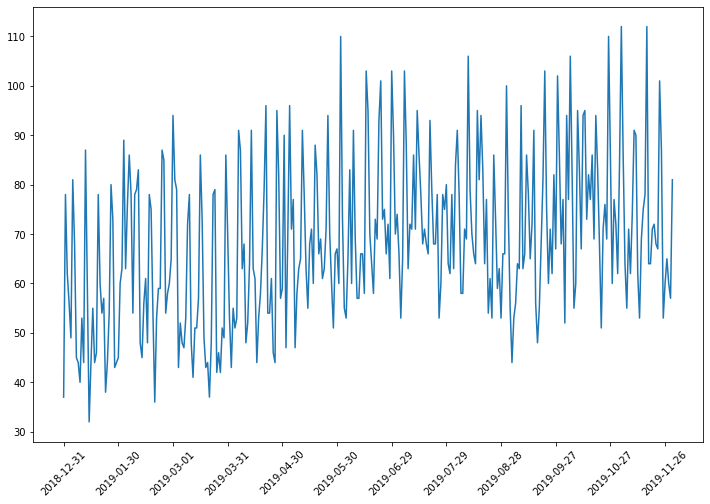

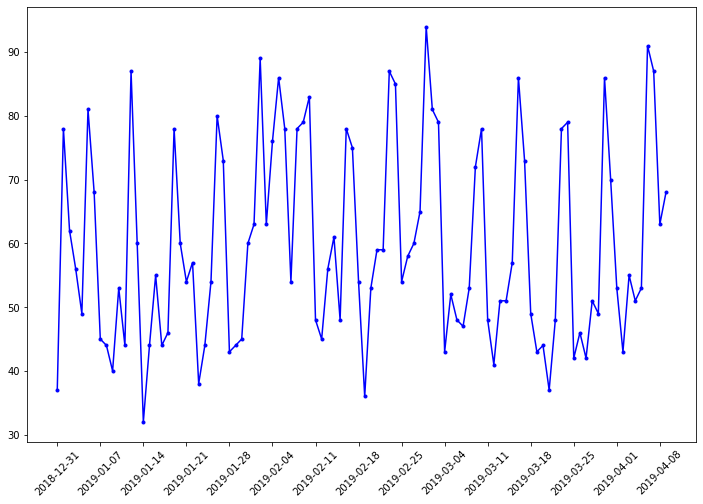

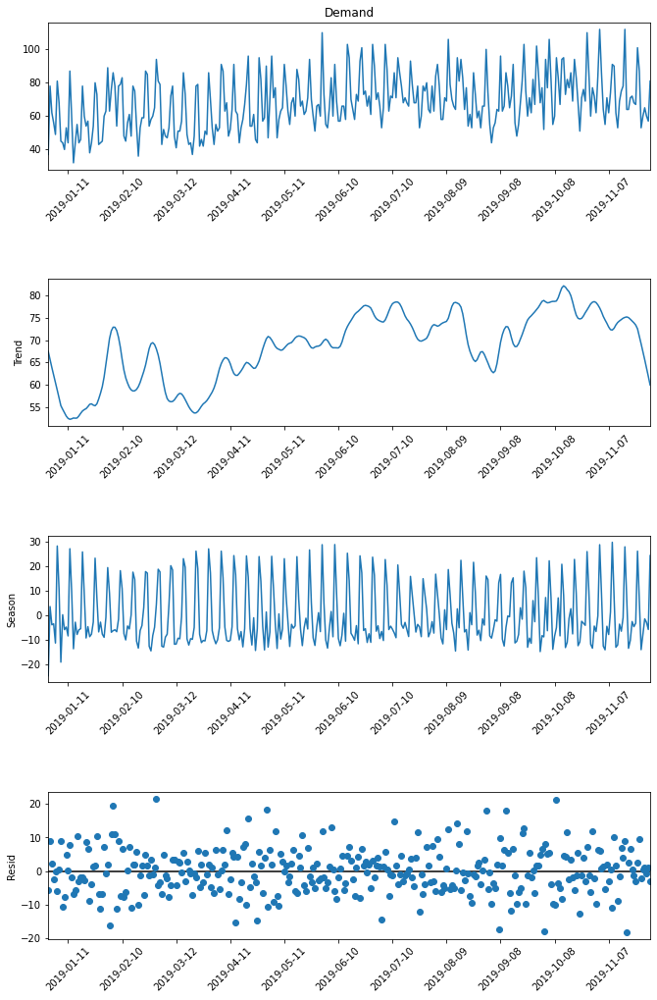

Date
2019-01-01    8.864689
2019-01-02    2.084386
2019-01-06    0.432274
2019-01-07    8.881423
2019-01-10    4.885463
                ...   
2019-11-23    2.365102
2019-11-24    9.568102
2019-11-26    0.450199
2019-11-27    0.918278
2019-11-29    0.987701
Name: resid, Length: 163, dtype: float64


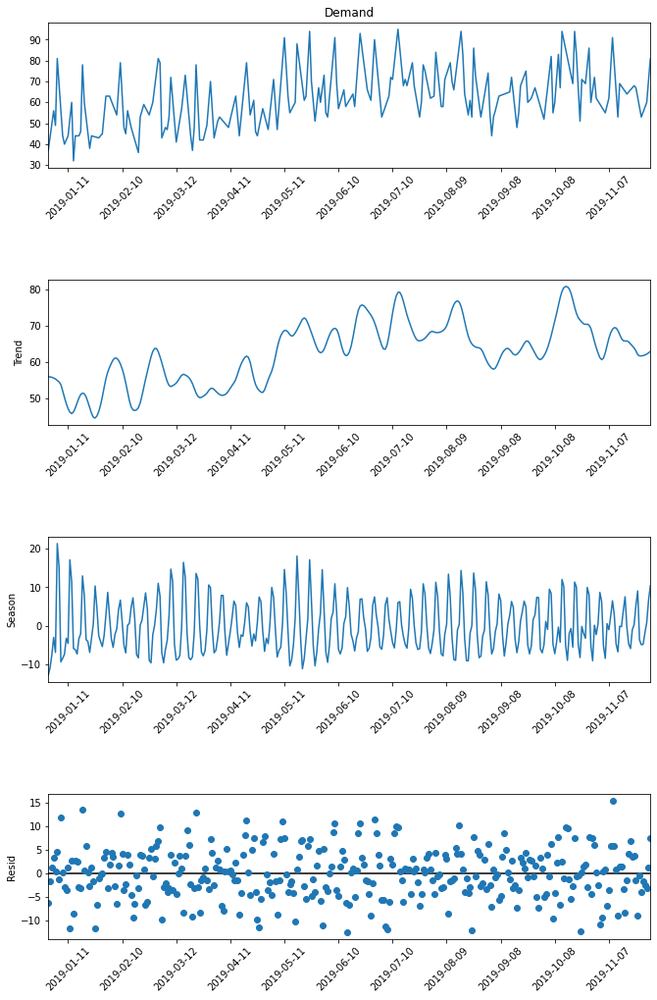

Date
2019-01-02     1.342726
2019-01-03     3.356380
2019-01-04     0.546201
2019-01-05     4.556968
2019-01-07    11.873640
                ...    
2019-11-19     6.883205
2019-11-20     3.555199
2019-11-21     3.806176
2019-11-29     1.354321
2019-11-30     7.523331
Name: resid, Length: 166, dtype: float64


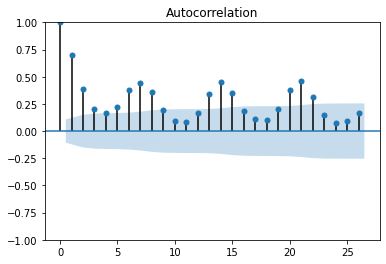

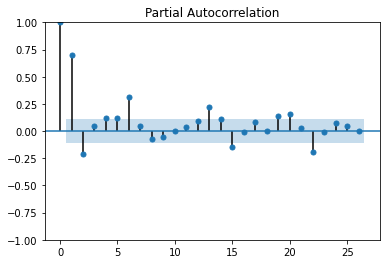

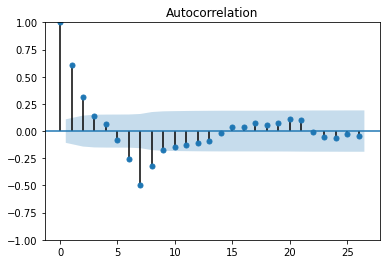

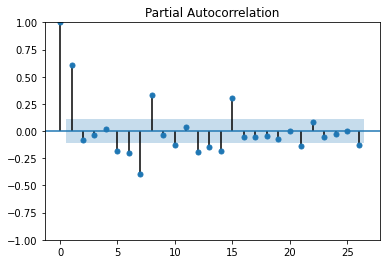

p-value of ADF test (diff 7): 2.1921988642676997e-06


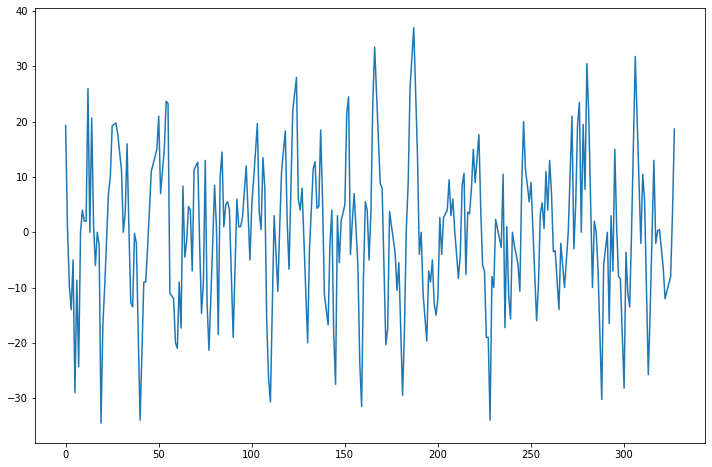

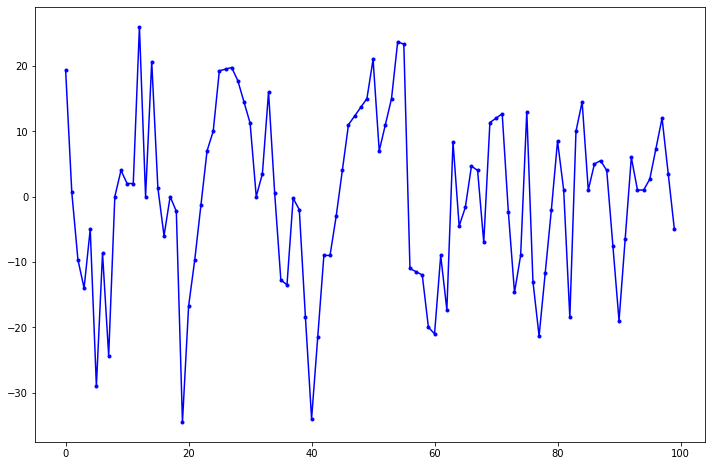

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  244
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -934.561
Date:                Thu, 12 Jan 2023   AIC                           1879.122
Time:                        06:55:38   BIC                           1896.587
Sample:                    01-07-2019   HQIC                          1886.156
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1666      0.496     -0.336      0.737      -1.138       0.805
ar.L2         -0.1858      0.090     -2.069      0.039      -0.362      -0.010
ar.L3         -0.1385      0.119     -1.168      0.2

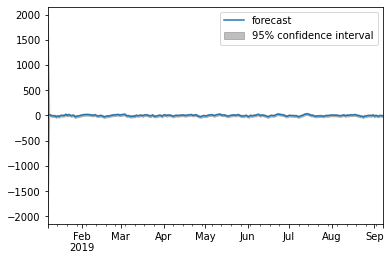

Test RMSE: 13.378201716663261



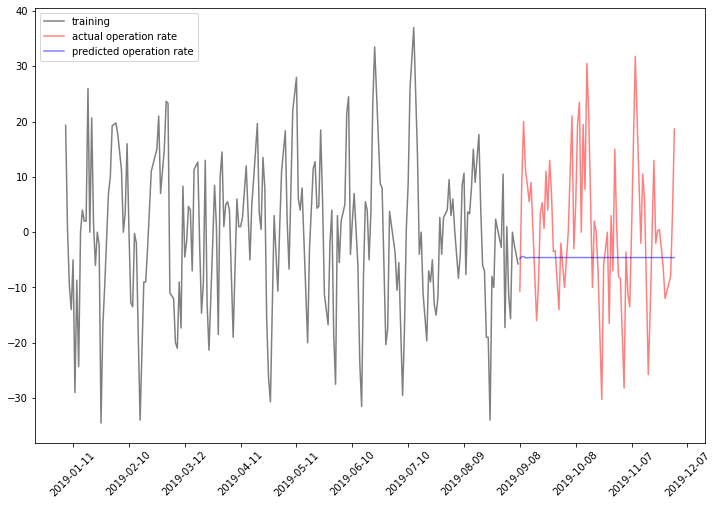





SARIMA
 ARIMA(2,0,0)(2,1,0)[7]          
ar.L1         0.722756
ar.L2        -0.132698
ar.S.L7      -1.090088
ar.S.L14     -0.594751
sigma2      118.425546
dtype: float64
1825.1519299786721
Test RMSE: 15.018322459030701



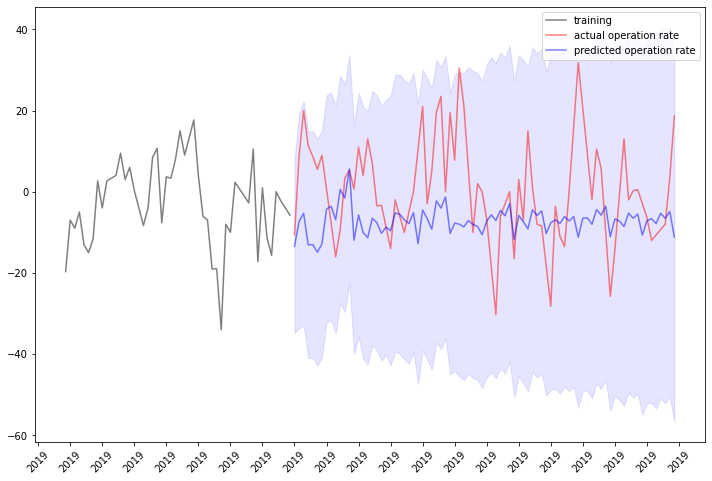

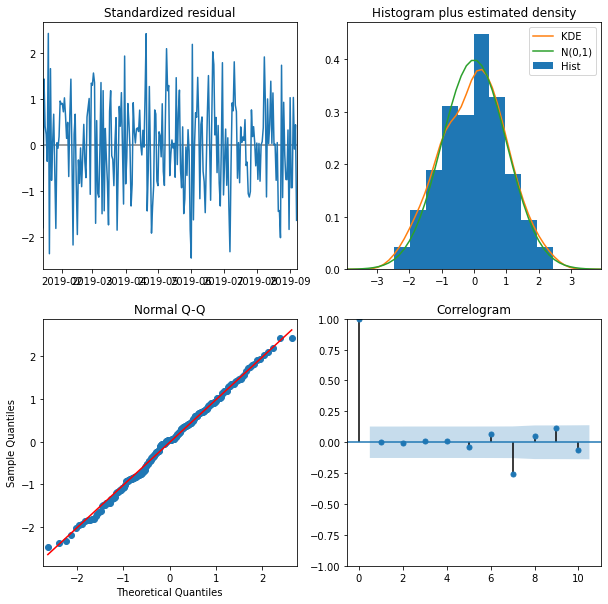

In [26]:
df_경기도_안양시_동안구 = df_경기도[df_경기도['region2'] == '안양시\u3000동안구']
arima_sarima(df_경기도_안양시_동안구)

안양시 만안구

ARIMA


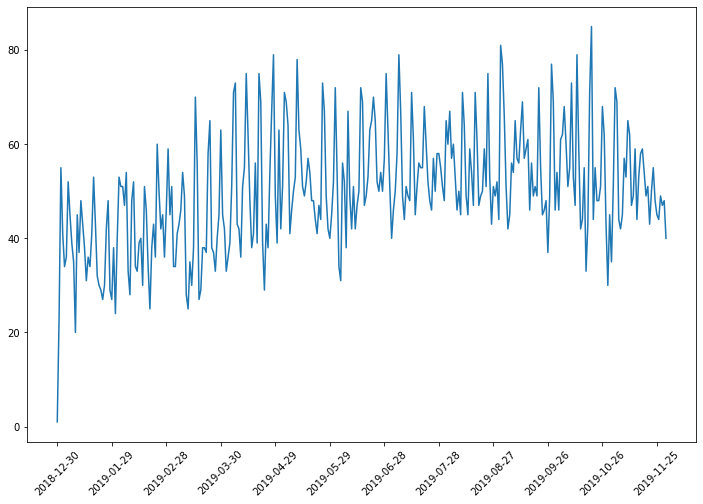

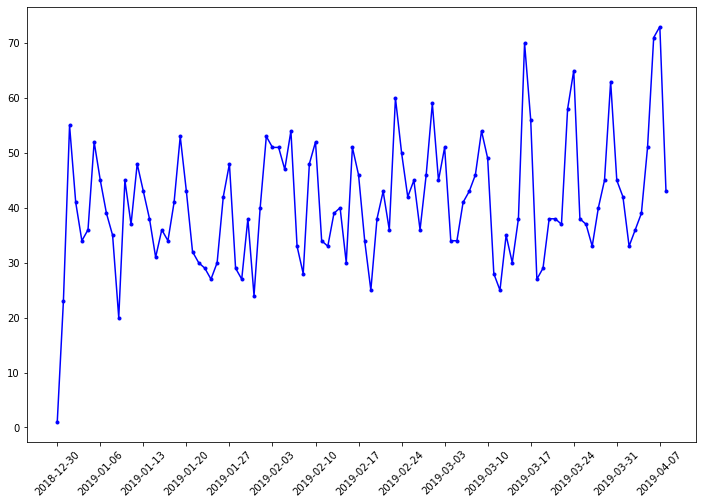

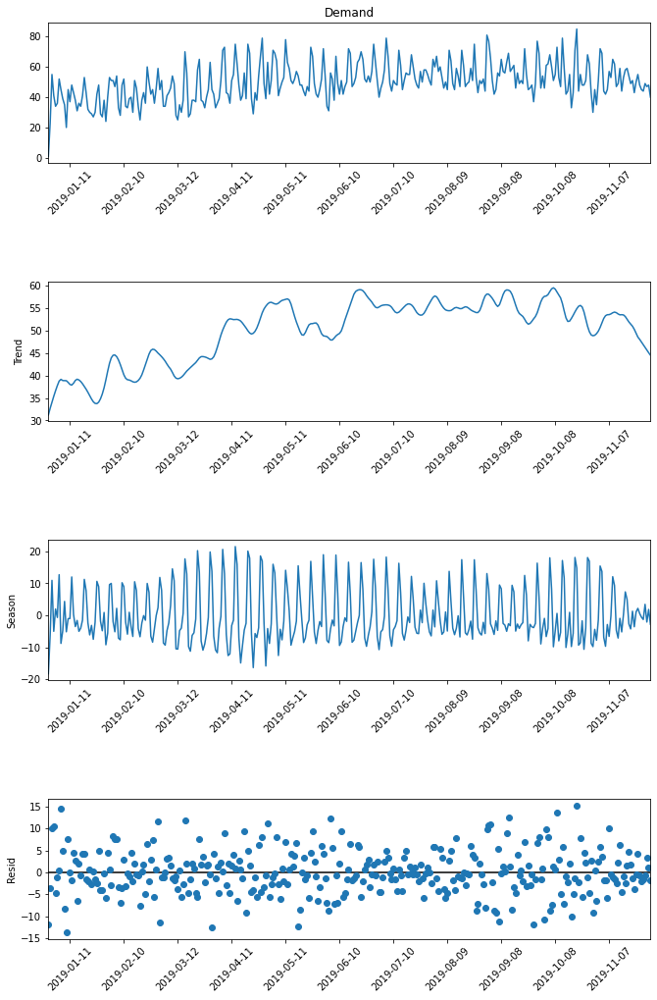

Date
2019-01-01     9.951651
2019-01-02    10.577931
2019-01-05     0.493112
2019-01-06    14.584149
2019-01-07     4.894003
                ...    
2019-11-18     4.710381
2019-11-19     1.727071
2019-11-23     4.190227
2019-11-28     3.375858
2019-11-29     1.018574
Name: resid, Length: 150, dtype: float64


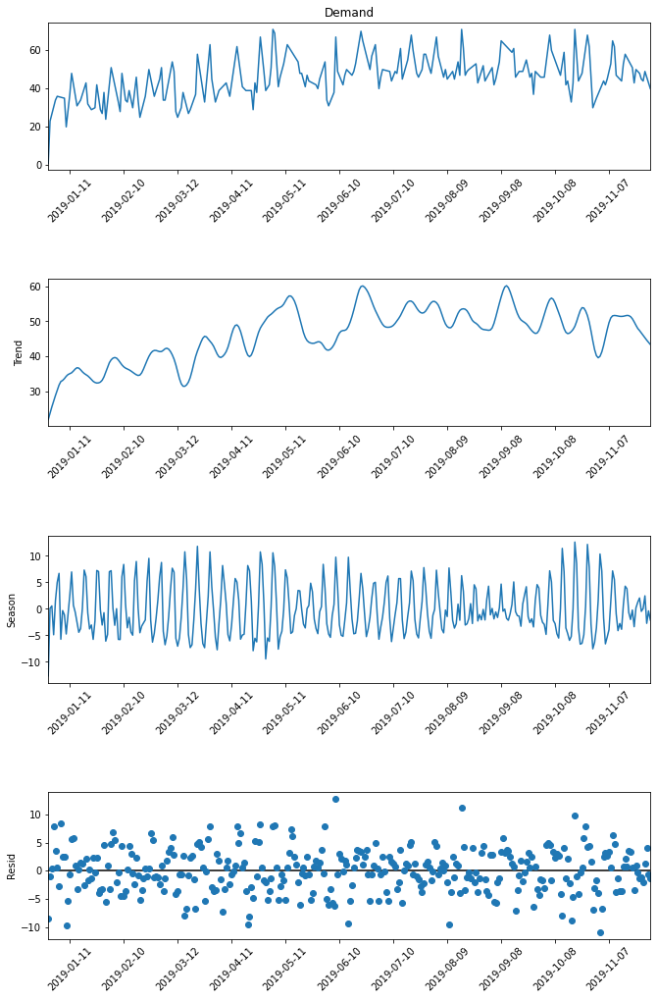

Date
2019-01-01    0.478401
2019-01-02    7.936571
2019-01-03    3.602314
2019-01-04    0.584681
2019-01-06    8.366539
                ...   
2019-11-19    3.412523
2019-11-20    0.484259
2019-11-22    0.933918
2019-11-27    1.242901
2019-11-28    4.085838
Name: resid, Length: 169, dtype: float64


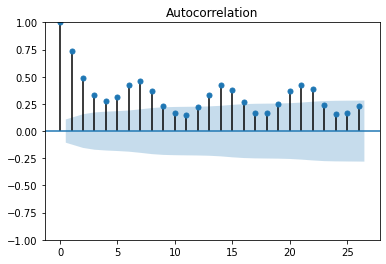

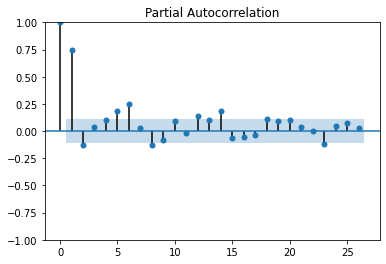

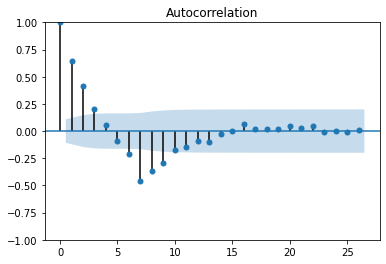

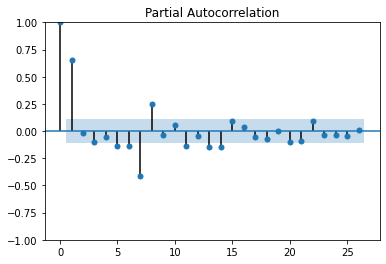

p-value of ADF test (diff 7): 3.5302528722500625e-08


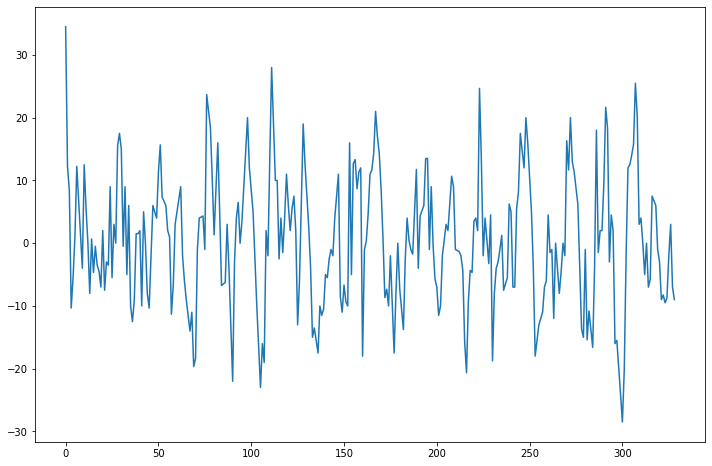

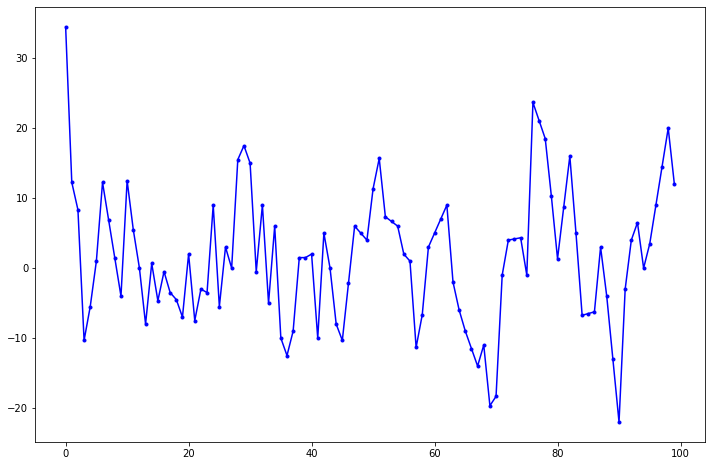

                               SARIMAX Results                                
Dep. Variable:                   Diff   No. Observations:                  245
Model:                 ARIMA(3, 1, 1)   Log Likelihood                -847.113
Date:                Thu, 12 Jan 2023   AIC                           1704.226
Time:                        06:56:08   BIC                           1721.712
Sample:                    01-06-2019   HQIC                          1711.268
                         - 09-07-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6368      0.064      9.884      0.000       0.511       0.763
ar.L2          0.0520      0.076      0.686      0.492      -0.096       0.201
ar.L3         -0.0980      0.070     -1.410      0.1

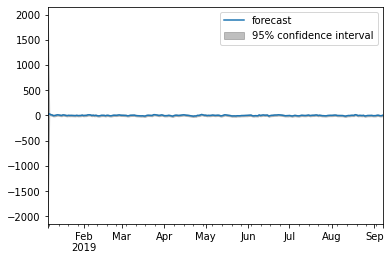

Test RMSE: 11.741863502322575



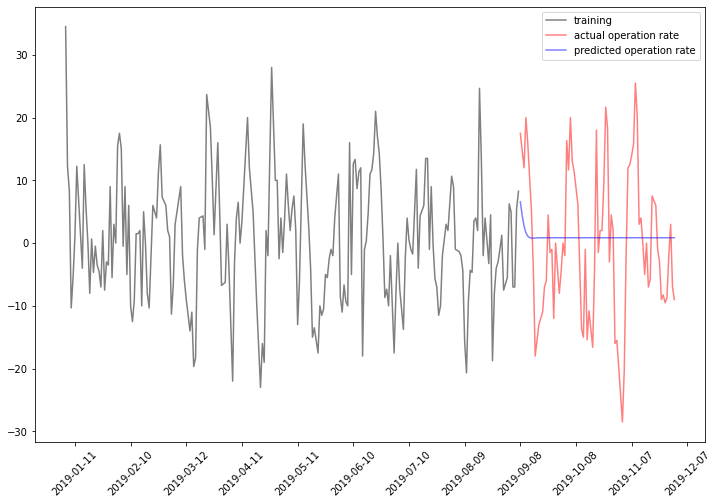





SARIMA
 ARIMA(2,0,1)(2,1,0)[7] intercept
intercept    -0.010032
ar.L1         1.638296
ar.L2        -0.688658
ma.L1        -0.988283
ar.S.L7      -0.965040
ar.S.L14     -0.414543
sigma2       71.550433
dtype: float64
1711.2714617681168
Test RMSE: 12.020937194881032



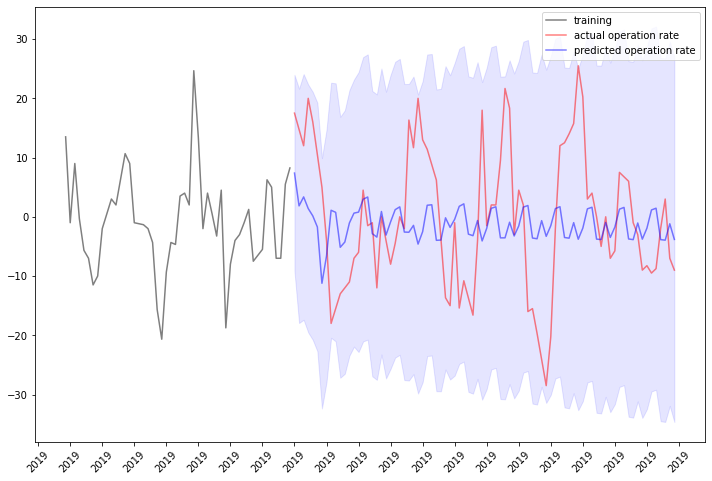

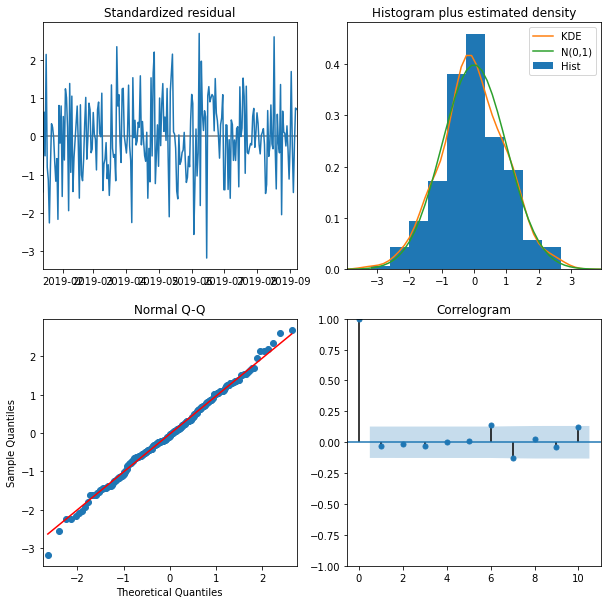

In [27]:
df_경기도_안양시_만안구 = df_경기도[df_경기도['region2'] == '안양시\u3000만안구']
arima_sarima(df_경기도_안양시_만안구)